In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

from matplotlib.dates import date2num
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from datetime import datetime
import xarray as xr
import netCDF4 as nc
import glob
import math
import subprocess
from matplotlib import colormaps
import plotly.graph_objs as go

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import seaborn as sns
import csv
import pandas as pd
from scipy.optimize import curve_fit
from math import prod

import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT
from metpy.units import units
from metpy.calc import dewpoint_from_relative_humidity
#from metpy.io import get_test_data

import sys, os
import requests
import pyart

import warnings
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:

file_path='/work/bk1415/b382718/output/caipeex/nested_run/icon_output/continental_ccn/latent_heat/sull_ds'
ds_nosip = xr.open_mfdataset(f'{file_path}/nosip/caipeex_2mom/NWP_*.nc');
ds_4sip = xr.open_mfdataset(f'{file_path}/4sip/caipeex_2mom/NWP_*.nc');
ds_nohm = xr.open_mfdataset(f'{file_path}/nohm/caipeex_2mom/NWP_*.nc');
ds_norf = xr.open_mfdataset(f'{file_path}/norf/caipeex_2mom/NWP_*.nc');
ds_nobr = xr.open_mfdataset(f'{file_path}/nobr/caipeex_2mom/NWP_*.nc');
ds_nosb = xr.open_mfdataset(f'{file_path}/nosb/caipeex_2mom/NWP_*.nc');


In [3]:

grid_caipeex = xr.open_dataset('/work/bk1415/b382718/output/caipeex/nested_run/icon_output/continental_ccn/latent_heat/control/caipeex_2mom_sip/domain4_DOM04.nc');

clon_deg = np.degrees(grid_caipeex.clon)
clat_deg = np.degrees(grid_caipeex.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([75.5, 17.5])
#print(okla_x), print(okla_y)
dx_deg = 0.5; dy_deg = 0.3
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)


73.96231325070727
78.03733091737507
15.966592379850837
20.032768784756854
75.0
76.0
17.8
17.2


(None, None)

In [4]:

window_cell = (
    (grid_caipeex.clat >= np.deg2rad(bottom_bound))
    & (grid_caipeex.clat <= np.deg2rad(top_bound))
    & (grid_caipeex.clon >= np.deg2rad(left_bound))
    & (grid_caipeex.clon <= np.deg2rad(right_bound))
).values

(window_cell_indices,) = np.where(window_cell)

# select cells matching with the area of interest (windows_cell_indices:: matching to that with the area sampled by the aircraft)
window_vertex_indices = (np.unique(grid_caipeex.vertex_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_vertex_indices ::',window_vertex_indices)

# select edges matching with the area of interest (corresponding to the windows_cell_indices)
window_edge_indices = (np.unique(grid_caipeex.edge_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_edge_indices ::',window_edge_indices)

selected_indices = xr.Dataset(
    {
        "cell": ("cell", window_cell_indices),
        "vertex": ("vertex", window_vertex_indices),
        "edge": ("edge", window_edge_indices),
    }
)


vars_to_renumber = {
    "cell": [
        "adjacent_cell_of_edge",
        "cells_of_vertex",
        "neighbor_cell_index",
    ],
    "vertex": ["vertex_of_cell", "edge_vertices", "vertices_of_vertex"],
    "edge": ["edge_of_cell", "edges_of_vertex"],
}

def reindex_grid(grid, indices, vars_to_renumber):
    new_grid = grid.load().isel(
        cell=indices.cell, vertex=indices.vertex, edge=indices.edge
    )
    for dim, idx in indices.coords.items():
        renumbering = np.full(grid.dims[dim], -2, dtype="int")
        renumbering[idx] = np.arange(len(idx))
        for name in vars_to_renumber[dim]:
            new_grid[name].data = renumbering[new_grid[name].data - 1] + 1
    return new_grid

new_grid_caipeex = reindex_grid(grid_caipeex, selected_indices, vars_to_renumber)

mask=np.isin(ds_4sip['ncells'], selected_indices.cell)


window_vertex_indices :: [ 3670  3702  3718 ... 32701 32702 32703]
window_edge_indices :: [11072 11073 11074 ... 95287 95288 95289]


In [5]:

ds_nosip['w_vel'] = -1.*ds_nosip.omega/(9.8*ds_nosip.rho)
ds_nosip['tempc'] = ds_nosip.temp-273.16;
ds_nosip['lwc_gperm3']  = ds_nosip.qc*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['tqi'] = ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh
ds_nosip['tq'] = ds_nosip.qc+ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh
ds_nosip['ciwc_gperm3'] = ds_nosip.qi*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['tiwc_gperm3'] = (ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh)*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['twc_gperm3'] = (ds_nosip.qc+ds_nosip.qi+ds_nosip.qs+ds_nosip.qg+ds_nosip.qh)*ds_nosip.rho*1.e3 # kgperm3 to gperm3
ds_nosip['cdnc_percm3'] = ds_nosip.qnc*ds_nosip.rho*1.e-6  # perkg to percm3
ds_nosip['inc_perl'] = (ds_nosip.qni+ds_nosip.qns+ds_nosip.qng+ds_nosip.qnh)*ds_nosip.rho*1.e-3 # perkg to perl

ds_4sip['w_vel'] = -1.*ds_4sip.omega/(9.8*ds_4sip.rho)
ds_4sip['tempc'] = ds_4sip.temp-273.16;
ds_4sip['lwc_gperm3']  = ds_4sip.qc*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tqi'] = ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['tq'] = ds_4sip.qc+ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['ciwc_gperm3'] = ds_4sip.qi*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tiwc_gperm3'] = (ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['twc_gperm3'] = (ds_4sip.qc+ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['cdnc_percm3'] = ds_4sip.qnc*ds_4sip.rho*1.e-6  # perkg to percm3
ds_4sip['inc_perl'] = (ds_4sip.qni+ds_4sip.qns+ds_4sip.qng+ds_4sip.qnh)*ds_4sip.rho*1.e-3 # perkg to perl

ds_norf['w_vel'] = -1.*ds_norf.omega/(9.8*ds_norf.rho)
ds_norf['tempc'] = ds_norf.temp-273.16;
ds_norf['lwc_gperm3']  = ds_norf.qc*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['tqi'] = ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh
ds_norf['tq'] = ds_norf.qc+ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh
ds_norf['ciwc_gperm3'] = ds_norf.qi*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['tiwc_gperm3'] = (ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh)*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['twc_gperm3'] = (ds_norf.qc+ds_norf.qi+ds_norf.qs+ds_norf.qg+ds_norf.qh)*ds_norf.rho*1.e3 # kgperm3 to gperm3
ds_norf['cdnc_percm3'] = ds_norf.qnc*ds_norf.rho*1.e-6  # perkg to percm3
ds_norf['inc_perl'] = (ds_norf.qni+ds_norf.qns+ds_norf.qng+ds_norf.qnh)*ds_norf.rho*1.e-3 # perkg to perl

ds_nohm['w_vel'] = -1.*ds_nohm.omega/(9.8*ds_nohm.rho)
ds_nohm['tempc'] = ds_nohm.temp-273.16;
ds_nohm['lwc_gperm3']  = ds_nohm.qc*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['tqi'] = ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh
ds_nohm['tq'] = ds_nohm.qc+ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh
ds_nohm['ciwc_gperm3'] = ds_nohm.qi*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['tiwc_gperm3'] = (ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh)*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['twc_gperm3'] = (ds_nohm.qc+ds_nohm.qi+ds_nohm.qs+ds_nohm.qg+ds_nohm.qh)*ds_nohm.rho*1.e3 # kgperm3 to gperm3
ds_nohm['cdnc_percm3'] = ds_nohm.qnc*ds_nohm.rho*1.e-6  # perkg to percm3
ds_nohm['inc_perl'] = (ds_nohm.qni+ds_nohm.qns+ds_nohm.qng+ds_nohm.qnh)*ds_nohm.rho*1.e-3 # perkg to perl

ds_nobr['w_vel'] = -1.*ds_nobr.omega/(9.8*ds_nobr.rho)
ds_nobr['tempc'] = ds_nobr.temp-273.16;
ds_nobr['lwc_gperm3']  = ds_nobr.qc*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['tqi'] = ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh
ds_nobr['tq'] = ds_nobr.qc+ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh
ds_nobr['ciwc_gperm3'] = ds_nobr.qi*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['tiwc_gperm3'] = (ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh)*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['twc_gperm3'] = (ds_nobr.qc+ds_nobr.qi+ds_nobr.qs+ds_nobr.qg+ds_nobr.qh)*ds_nobr.rho*1.e3 # kgperm3 to gperm3
ds_nobr['cdnc_percm3'] = ds_nobr.qnc*ds_nobr.rho*1.e-6  # perkg to percm3
ds_nobr['inc_perl'] = (ds_nobr.qni+ds_nobr.qns+ds_nobr.qng+ds_nobr.qnh)*ds_nobr.rho*1.e-3 # perkg to perl

ds_nosb['w_vel'] = -1.*ds_nosb.omega/(9.8*ds_nosb.rho)
ds_nosb['tempc'] = ds_nosb.temp-273.16;
ds_nosb['lwc_gperm3']  = ds_nosb.qc*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['tqi'] = ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh
ds_nosb['tq'] = ds_nosb.qc+ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh
ds_nosb['ciwc_gperm3'] = ds_nosb.qi*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['tiwc_gperm3'] = (ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh)*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['twc_gperm3'] = (ds_nosb.qc+ds_nosb.qi+ds_nosb.qs+ds_nosb.qg+ds_nosb.qh)*ds_nosb.rho*1.e3 # kgperm3 to gperm3
ds_nosb['cdnc_percm3'] = ds_nosb.qnc*ds_nosb.rho*1.e-6  # perkg to percm3
ds_nosb['inc_perl'] = (ds_nosb.qni+ds_nosb.qns+ds_nosb.qng+ds_nosb.qnh)*ds_nosb.rho*1.e-3 # perkg to perl


In [6]:

aircraft_starttime='2019-09-30T07:00:00.000000000'
aircraft_endtime='2019-09-30T11:00:00.000000000'

ds_nosip_new = ds_nosip.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
ds_4sip_new = ds_4sip.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
ds_norf_new = ds_norf.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
ds_nohm_new = ds_nohm.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
ds_nobr_new = ds_nobr.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))
ds_nosb_new = ds_nosb.sel(ncells=mask,time=slice(aircraft_starttime, aircraft_endtime))


## CFAD

In [6]:

################## ICON #################
#ds_4sip2 = ds_4sip.copy(deep=True)
ds_filt = ds_4sip.sel(ncells=mask)#, time=slice('2011-05-11T17:00:00.000000000','2011-05-12T00:00:00.000000000'))
filt_qc_4sip = xr.where(ds_filt.qc > 1.e-6, ds_filt.qc, np.nan);
alt_4sip_km = 1.e-3*ds_filt.z_mc

# 3. Flatten both arrays to 1D for histogramming
qc_4sip_flat = filt_qc_4sip.values.flatten()
alt_4sip_flat = alt_4sip_km.values.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask_4sip = (~np.isnan(qc_4sip_flat)) & (~np.isnan(alt_4sip_flat)) & (qc_4sip_flat > -10) & (alt_4sip_flat >= 0)
qc_4sip_flat = qc_4sip_flat[mask_4sip]
alt_4sip_flat = alt_4sip_flat[mask_4sip]

# 5. Define bins
#dbz_4sip_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_4sip_bins = np.arange(0.2, 20.1, 1) # Altitude bins from 0 to 15 km in 0.1 km steps

qc_4sip_bins = np.linspace(1.e-5, 1.e-2, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_4sip_bins = np.linspace(0., 16.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad_qc_4sip, xedges_4sip, yedges_4sip = np.histogram2d(qc_4sip_flat, alt_4sip_flat, bins=[qc_4sip_bins, alt_4sip_bins])

################## End ICON #################

med_qc_4sip = filt_qc_4sip.median(dim=('time','ncells'))
mean_alt_4sip = alt_4sip_km.mean(dim=('time','ncells'))

#med_refl_4sip = xr.where(mean_alt_4sip < 13.35, med_refl_4sip, np.nan)

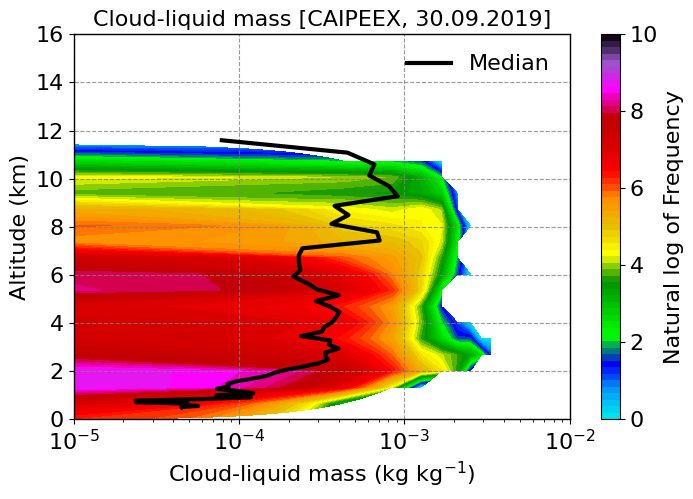

In [10]:

lev=np.linspace(0,10,60)
ln=3
fnt=16
plt.figure(figsize=(8,5))
plt.style.use('default')
pcm = plt.contourf(qc_4sip_bins[:-1], alt_4sip_bins[:-1], np.log(cfad_qc_4sip.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(med_qc_4sip, mean_alt_4sip, 'k-', linewidth=ln, label='Median')
#plt.text(40,14,'11.05.2011 17:00 UTC - 12.05.2011 00:00 UTC', fontsize=fnt)

plt.xlabel('Cloud-liquid mass (kg kg$^{-1}$)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud-liquid mass [CAIPEEX, 30.09.2019]', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10])#, label='Natural log of Frequency')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.xscale('log')
plt.ylim(0, 16)
plt.xlim(1.e-5, 1.e-2)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.legend(frameon=False, loc='best', fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()

In [58]:

################## ICON #################
#ds_4sip2 = ds_4sip.copy(deep=True)
ds_filt = ds_4sip.sel(ncells=mask)#, time=slice('2011-05-11T17:00:00.000000000','2011-05-12T00:00:00.000000000'))
filt_qi_4sip = xr.where(ds_filt.qi > 1.e-9, ds_filt.qi, np.nan);
alt_4sip_km = 1.e-3*ds_filt.z_mc

# 3. Flatten both arrays to 1D for histogramming
qi_4sip_flat = filt_qi_4sip.values.flatten()
alt_4sip_flat = alt_4sip_km.values.flatten()

# 4. Filter out NaNs and physically unrealistic values
mask_4sip = (~np.isnan(qi_4sip_flat)) & (~np.isnan(alt_4sip_flat)) & (qi_4sip_flat > -10) & (alt_4sip_flat >= 0)
qi_4sip_flat = qi_4sip_flat[mask_4sip]
alt_4sip_flat = alt_4sip_flat[mask_4sip]

# 5. Define bins
#dbz_4sip_bins = np.arange(-10, 81, 3)   # dBZ bins from -10 to 80 in 1 dBZ steps
#alt_4sip_bins = np.arange(0.2, 20.1, 1) # Altitude bins from 0 to 15 km in 0.1 km steps

qi_4sip_bins = np.linspace(1.e-8, 1.e-2, 25)   # dBZ bins from -10 to 80 in 1 dBZ steps
alt_4sip_bins = np.linspace(0., 16.1, 25) # Altitude bins from 0 to 15 km in 0.1 km steps

# 6. 2D Histogram (CFAD)
cfad_qi_4sip, xedges_4sip, yedges_4sip = np.histogram2d(qi_4sip_flat, alt_4sip_flat, bins=[qi_4sip_bins, alt_4sip_bins])

################## End ICON #################

med_qi_4sip = filt_qi_4sip.median(dim=('time','ncells'))
mean_alt_4sip = alt_4sip_km.mean(dim=('time','ncells'))

#med_refl_4sip = xr.where(mean_alt_4sip < 13.35, med_refl_4sip, np.nan)

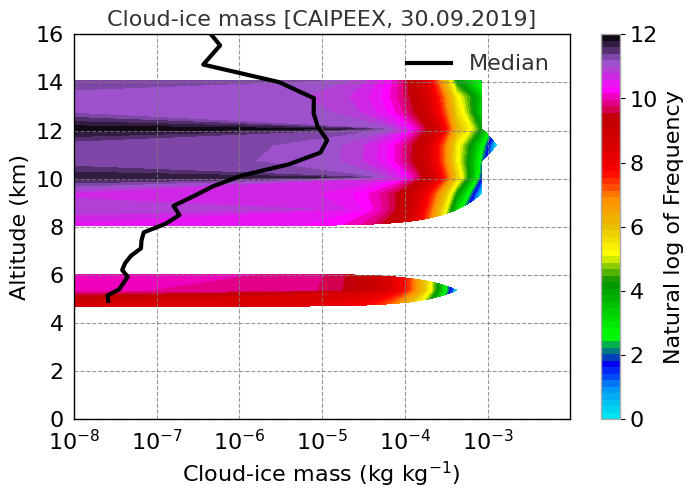

In [59]:

lev=np.linspace(0,12,60)
ln=3
fnt=16
plt.figure(figsize=(8,5))

pcm = plt.contourf(qi_4sip_bins[:-1], alt_4sip_bins[:-1], np.log(cfad_qi_4sip.T), cmap='pyart_NWSRef', levels=lev)
#pcm = plt.contourf(dbz_bins[:-1], alt_bins[:-1], np.log(cfad.T), cmap='HomeyerRainbow', levels=lev)

plt.plot(med_qi_4sip, mean_alt_4sip, 'k-', linewidth=ln, label='Median')
#plt.text(40,14,'11.05.2011 17:00 UTC - 12.05.2011 00:00 UTC', fontsize=fnt)

plt.xlabel('Cloud-ice mass (kg kg$^{-1}$)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud-ice mass [CAIPEEX, 30.09.2019]', fontsize=fnt)
cbar = plt.colorbar(pcm, ticks=[0, 2, 4, 6, 8, 10, 12])#, label='Natural log of Frequency')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

plt.xscale('log')
plt.ylim(0, 16)
#plt.xlim(1.e-5, 1.e-2)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.legend(frameon=False, loc='best', fontsize=fnt)
plt.grid(True, linestyle='--', color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
    
plt.show()

In [11]:
# To print the following message:
# 1. write your message after ## (e.g., ## your_message)
# 2. press 'Esc'
# 3. pres 'm' --> your typed cell is markdown now
# 4. shift+enter or run the cell --> there you go !!!

# Latent heating rate


In [7]:
mean_ht_nosip = 1.e-3*ds_nosip.z_mc.mean(dim=('time','ncells'))
mean_tempc_nosip = ds_nosip.tempc.mean(dim=('time','ncells'))

mean_ht_4sip = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
mean_tempc_4sip = ds_4sip.tempc.mean(dim=('time','ncells'))

mean_ht_norf = 1.e-3*ds_norf.z_mc.mean(dim=('time','ncells'))
mean_tempc_norf = ds_norf.tempc.mean(dim=('time','ncells'))

mean_ht_nohm = 1.e-3*ds_nohm.z_mc.mean(dim=('time','ncells'))
mean_tempc_nohm = ds_nohm.tempc.mean(dim=('time','ncells'))

mean_ht_nobr = 1.e-3*ds_nobr.z_mc.mean(dim=('time','ncells'))
mean_tempc_nobr = ds_nobr.tempc.mean(dim=('time','ncells'))

mean_ht_nosb = 1.e-3*ds_nosb.z_mc.mean(dim=('time','ncells'))
mean_tempc_nosb = ds_nosb.tempc.mean(dim=('time','ncells'))

In [8]:

variables = [mean_tempc_nosip, mean_tempc_4sip, mean_tempc_norf, mean_tempc_nohm, mean_tempc_nobr, mean_tempc_nosb]
numpy_variables = [var.values for var in variables]

mean_tempc_nosip = numpy_variables[0]
mean_tempc_4sip = numpy_variables[1]
mean_tempc_norf = numpy_variables[2]
mean_tempc_nohm = numpy_variables[3]
mean_tempc_nobr = numpy_variables[4]
mean_tempc_nosb = numpy_variables[5]

variables = [mean_ht_nosip, mean_ht_4sip, mean_ht_norf, mean_ht_nohm, mean_ht_nobr, mean_ht_nosb]
numpy_variables = [var.values for var in variables]

mean_ht_nosip = numpy_variables[0]
mean_ht_4sip = numpy_variables[1]
mean_ht_norf = numpy_variables[2]
mean_ht_nohm = numpy_variables[3]
mean_ht_nobr = numpy_variables[4]
mean_ht_nosb = numpy_variables[5]

In [8]:

w_thres = 2.
# Latent heating rate with No SIP
dims1 = ds_nosip.tempc.dims
dims2 = ds_nosip.tempc.mean(dim=('time','ncells')).dims
filt_lhr = xr.where((ds_nosip.tq > 1.e-6) & (ds_nosip.w_vel > w_thres), ds_nosip.d_lhr, np.nan)
lhr_kpers_nosip = (1./1800.) * np.gradient(ds_nosip.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nosip = lhr_kpers_nosip * 86400.
#ds_nosip['lhr_kperd'] = xr.where((ds_nosip.lhr_kperd > -10.) & (ds_nosip.lhr_kperd < 20.), ds_nosip.lhr_kperd, np.nan)
mean_lhr_kperd_nosip = np.mean(lhr_kperd_nosip, axis=(0,2))
ds_nosip['lhr_kperd'] = (dims1, lhr_kperd_nosip)
ds_nosip['mean_lhr_kperd'] = (dims2, mean_lhr_kperd_nosip)

# Latent heating rate with 4-SIP
dims1 = ds_4sip.tempc.dims
dims = ds_4sip.tempc.mean(dim=('time','ncells')).dims
filt_lhr = xr.where((ds_4sip.tq > 1.e-6) & (ds_4sip.w_vel > w_thres), ds_4sip.d_lhr, np.nan)
lhr_kpers_4sip = (1./1800.) * np.gradient(ds_4sip.d_lhr, axis=0) # w.r.t. time
lhr_kperd_4sip = lhr_kpers_4sip * 86400.
#ds_4sip['lhr_kperd'] = (dims, lhr_kperd_4sip)
#ds_4sip['lhr_kperd'] = xr.where((ds_4sip.lhr_kperd > -10.) & (ds_4sip.lhr_kperd < 20.), ds_4sip.lhr_kperd, np.nan)
mean_lhr_kperd_4sip = np.mean(lhr_kperd_4sip, axis=(0,2))
ds_4sip['lhr_kperd'] = (dims1, lhr_kperd_4sip)
ds_4sip['mean_lhr_kperd'] = (dims, mean_lhr_kperd_4sip)

# Latent heating rate with No Raindrop Shattering (RF)
dims1 = ds_norf.tempc.dims
dims2 = ds_norf.tempc.mean(dim=('time','ncells')).dims
filt_lhr = xr.where((ds_norf.tq > 1.e-6) & (ds_norf.w_vel > w_thres), ds_norf.d_lhr, np.nan)
lhr_kpers_norf = (1./1800.) * np.gradient(ds_norf.d_lhr, axis=0) # w.r.t. time
lhr_kperd_norf = lhr_kpers_norf * 86400.
#ds_norf['lhr_kperd'] = (dims, lhr_kperd_norf)
#ds_norf['lhr_kperd'] = xr.where((ds_norf.lhr_kperd > -10.) & (ds_norf.lhr_kperd < 20.), ds_norf.lhr_kperd, np.nan)
mean_lhr_kperd_norf = np.mean(lhr_kperd_norf, axis=(0,2))
ds_norf['lhr_kperd'] = (dims1, lhr_kperd_norf)
ds_norf['mean_lhr_kperd'] = (dims2, mean_lhr_kperd_norf)

# Latent heating rate with No Hallett-Mossop (HM)
dims1 = ds_nohm.tempc.dims
dims2 = ds_nohm.tempc.mean(dim=('time','ncells')).dims
filt_lhr = xr.where((ds_nohm.tq > 1.e-6) & (ds_nohm.w_vel > w_thres), ds_nohm.d_lhr, np.nan)
lhr_kpers_nohm = (1./1800.) * np.gradient(ds_nohm.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nohm = lhr_kpers_nohm * 86400.
#ds_nohm['lhr_kperd'] = (dims, lhr_kperd_nohm)
#ds_nohm['lhr_kperd'] = xr.where((ds_nohm.lhr_kperd > -10.) & (ds_nohm.lhr_kperd < 20.), ds_nohm.lhr_kperd, np.nan)
mean_lhr_kperd_nohm = np.mean(lhr_kperd_nohm, axis=(0,2))
ds_nohm['lhr_kperd'] = (dims1, lhr_kperd_nohm)
ds_nohm['mean_lhr_kperd'] = (dims, mean_lhr_kperd_nohm)

# Latent heating rate with No ice-ice collision breakup (BR)
dims1 = ds_nobr.tempc.dims
dims2 = ds_nobr.tempc.mean(dim=('time','ncells')).dims
filt_lhr = xr.where((ds_nobr.tq > 1.e-6) & (ds_nobr.w_vel > w_thres), ds_nobr.d_lhr, np.nan)
lhr_kpers_nobr = (1./1800.) * np.gradient(ds_nobr.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nobr = lhr_kpers_nobr * 86400.
#ds_nobr['lhr_kperd'] = (dims, lhr_kperd_nobr)
#ds_nobr['lhr_kperd'] = xr.where((ds_nobr.lhr_kperd > -10.) & (ds_nobr.lhr_kperd < 20.), ds_nobr.lhr_kperd, np.nan)
mean_lhr_kperd_nobr = np.mean(lhr_kperd_nobr, axis=(0,2))
ds_nobr['lhr_kperd'] = (dims1, lhr_kperd_nobr)
ds_nobr['mean_lhr_kperd'] = (dims2, mean_lhr_kperd_nobr)

# Latent heating rate with No Sublimation (SB)
dims1 = ds_nosb.tempc.dims
dims2 = ds_nosb.tempc.mean(dim=('time','ncells')).dims
filt_lhr = xr.where((ds_nosb.tq > 1.e-6) & (ds_nosb.w_vel > w_thres), ds_nosb.d_lhr, np.nan)
lhr_kpers_nosb = (1./1800.) * np.gradient(ds_nosb.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nosb = lhr_kpers_nosb * 86400.
#ds_nosb['lhr_kperd'] = (dims, lhr_kperd_nosb)
#ds_nosb['lhr_kperd'] = xr.where((ds_nosb.lhr_kperd > -10.) & (ds_nosb.lhr_kperd < 20.), ds_nosb.lhr_kperd, np.nan)
mean_lhr_kperd_nosb = np.mean(lhr_kperd_nosb, axis=(0,2))
ds_nosb['lhr_kperd'] = (dims1, lhr_kperd_nosb)
ds_nosb['mean_lhr_kperd'] = (dims2, mean_lhr_kperd_nosb)

# Change in lhr w.r.t. control
del_lhr_kperd_norf = mean_lhr_kperd_4sip-mean_lhr_kperd_norf
del_lhr_kperd_nohm = mean_lhr_kperd_4sip-mean_lhr_kperd_nohm
del_lhr_kperd_nobr = mean_lhr_kperd_4sip-mean_lhr_kperd_nobr
del_lhr_kperd_nosb = mean_lhr_kperd_4sip-mean_lhr_kperd_nosb
del_lhr_kperd_nosip = mean_lhr_kperd_4sip-mean_lhr_kperd_nosip


In [21]:
del_lhr_kperd_nosip

array([ 0.0000000e+00,  7.3599149e-05,  4.2292289e-04,  8.1264786e-04,
        3.0169040e-03, -3.8848668e-03,  3.3002496e-03,  3.5576314e-02,
        6.6639841e-02,  5.6813955e-02, -1.9410455e-01, -3.5163927e-01,
       -6.2987804e-02,  6.1745882e-02,  7.9973102e-02,  1.2873256e-01,
        2.4424696e-01,  3.3610159e-01,  4.0667576e-01,  4.6118617e-01,
        4.7595352e-01,  3.5478890e-01,  2.0175779e-01,  9.0850115e-02,
        1.9188523e-02, -7.4348330e-02, -1.5713906e-01, -1.9633293e-01,
       -2.2352648e-01, -2.4015284e-01, -2.4319339e-01, -2.0044041e-01,
       -9.4930887e-02, -7.2477102e-02, -1.0403800e-01, -1.6688609e-01,
       -2.3553324e-01, -2.7111554e-01, -2.4690366e-01, -2.2517943e-01,
       -2.0419383e-01, -1.6587090e-01, -1.0856366e-01, -6.9110870e-02,
       -9.3574524e-03, -4.9618244e-02, -7.3110819e-02, -9.2893124e-02,
       -7.1004629e-02, -5.3762197e-03, -3.8333684e-02, -1.6673326e-02,
       -1.9366741e-03, -1.5990734e-02,  1.7710209e-02, -7.7594280e-02,
      

In [ ]:
# xarrays takes longer time to plot, convert them to numpy instead

variables = [mean_lhr_kperd_nosip, mean_lhr_kperd_4sip, mean_lhr_kperd_norf, mean_lhr_kperd_nohm, 
             mean_lhr_kperd_nobr, mean_lhr_kperd_nosb]
numpy_variables = [var.values for var in variables]

mean_lhr_kperd_nosip = numpy_variables[0]
mean_lhr_kperd_4sip = numpy_variables[1]
mean_lhr_kperd_norf = numpy_variables[2]
mean_lhr_kperd_nohm = numpy_variables[3]
mean_lhr_kperd_nobr = numpy_variables[4]
mean_lhr_kperd_nosb = numpy_variables[5]


In [9]:

del_lhr_kperd_norf = mean_lhr_kperd_4sip-mean_lhr_kperd_norf
del_lhr_kperd_nohm = mean_lhr_kperd_4sip-mean_lhr_kperd_nohm
del_lhr_kperd_nobr = mean_lhr_kperd_4sip-mean_lhr_kperd_nobr
del_lhr_kperd_nosb = mean_lhr_kperd_4sip-mean_lhr_kperd_nosb
del_lhr_kperd_nosip = mean_lhr_kperd_4sip-mean_lhr_kperd_nosip

per_del_lhr_kperd_norf = 100*(del_lhr_kperd_norf)/mean_lhr_kperd_4sip
per_del_lhr_kperd_nohm = 100*(del_lhr_kperd_nohm)/mean_lhr_kperd_4sip
per_del_lhr_kperd_nobr = 100*(del_lhr_kperd_nobr)/mean_lhr_kperd_4sip
per_del_lhr_kperd_nosb = 100*(del_lhr_kperd_nosb)/mean_lhr_kperd_4sip
per_del_lhr_kperd_nosip = 100*(del_lhr_kperd_nosip)/mean_lhr_kperd_4sip


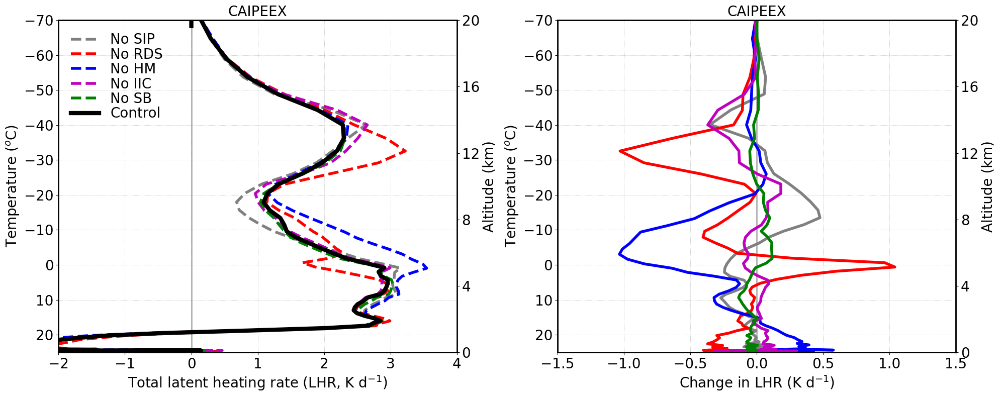

In [11]:

fontsize=20;
lnwdth=4;
alpha=0.8;

plt.figure(figsize=(20, 8))
plt.style.use('default')

plt.subplot(1,2,1)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_lhr_kperd_nosip, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_lhr_kperd_norf, mean_tempc_norf, 'r--', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_lhr_kperd_nohm, mean_tempc_nohm, 'b--', linewidth=lnwdth, label='No HM')
plt1.plot(mean_lhr_kperd_nobr, mean_tempc_nobr, 'm--', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_lhr_kperd_nosb, mean_tempc_nosb, 'g--', linewidth=lnwdth, label='No SB')
plt1.plot(mean_lhr_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth+2, label='Control')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_lhr_kperd_nosb, mean_tempc_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-2., 4)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(del_lhr_kperd_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(del_lhr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(del_lhr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(del_lhr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(del_lhr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(del_lhr_kperd_nosb, mean_tempc_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(-1.5, 1.5)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-3, -2, -1, 0, 1])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper right')

plt1.set_xlabel('Change in LHR (K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
#plt2.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.tight_layout()
plt.show()


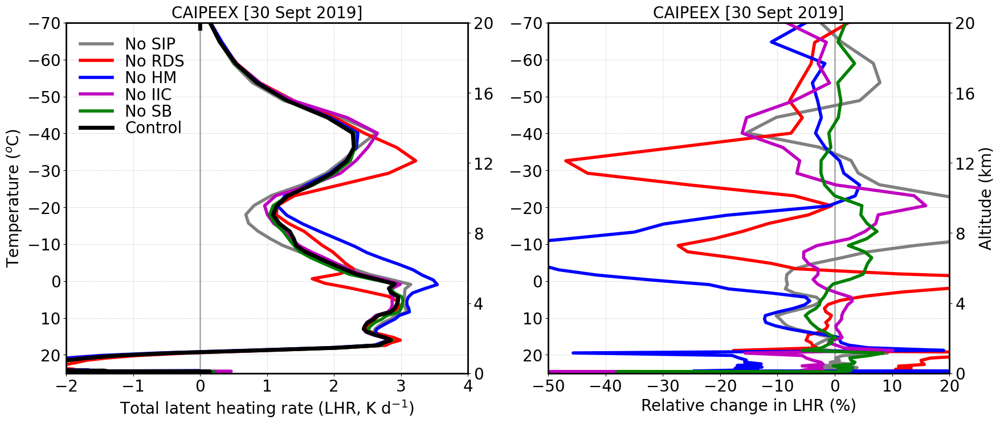

In [62]:

fontsize=20;
lnwdth=4;
alpha=0.8;

plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_lhr_kperd_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_lhr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_lhr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_lhr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_lhr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_lhr_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth+1, label='Control')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_lhr_kperd_nosb, mean_tempc_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-2., 4)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
#plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(per_del_lhr_kperd_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(per_del_lhr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(per_del_lhr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(per_del_lhr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(per_del_lhr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(per_del_lhr_kperd_nosb, mean_tempc_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(-50., 20)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-3, -2, -1, 0, 1])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper right')

plt1.set_xlabel('Relative change in LHR (%)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
#plt2.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.show()


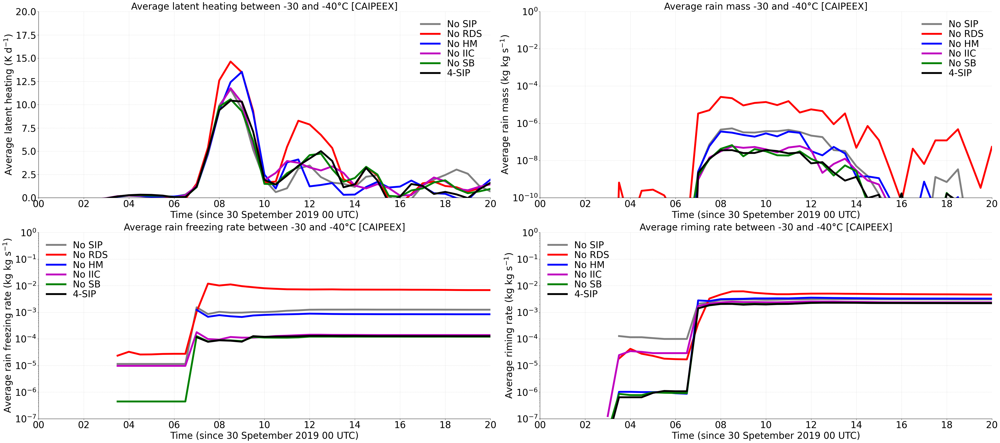

In [48]:

thres_q = 1.e-8;

## Latent heating
mean_lhr_min35_nosip = ds_nosip.lhr_kperd.sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_lhr_min35_4sip = ds_4sip.lhr_kperd.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_lhr_min35_norf = ds_norf.lhr_kperd.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_lhr_min35_nohm = ds_nohm.lhr_kperd.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_lhr_min35_nobr = ds_nobr.lhr_kperd.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_lhr_min35_nosb = ds_nosb.lhr_kperd.sel(height=slice(14, 16)).mean(dim=('ncells','height'))

## Rain mass
mean_qr_min35_nosip = ds_nosip.qr.sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_qr_min35_4sip = ds_4sip.qr.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_qr_min35_norf = ds_norf.qr.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_qr_min35_nohm = ds_nohm.qr.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_qr_min35_nobr = ds_nobr.qr.sel(height=slice(14, 16)).mean(dim=('ncells','height'))
mean_qr_min35_nosb = ds_nosb.qr.sel(height=slice(14, 16)).mean(dim=('ncells','height'))

## Riming rate
mean_dq_tot_rime_min35_4sip = xr.where(ds_4sip.d_qx_riming > thres_q, ds_4sip.d_qx_riming, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_dq_tot_rime_min35_nosip = xr.where(ds_nosip.d_qx_riming > thres_q, ds_nosip.d_qx_riming, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_dq_tot_rime_min35_norf = xr.where(ds_norf.d_qx_riming > thres_q, ds_norf.d_qx_riming, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_dq_tot_rime_min35_nohm = xr.where(ds_nohm.d_qx_riming > thres_q, ds_nohm.d_qx_riming, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_dq_tot_rime_min35_nobr = xr.where(ds_nobr.d_qx_riming > thres_q, ds_nobr.d_qx_riming, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))
mean_dq_tot_rime_min35_nosb = xr.where(ds_nosb.d_qx_riming > thres_q, ds_nosb.d_qx_riming, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))

## Rain freezing rate
sum_dq = ds_4sip.d_qr_rf+ds_4sip.d_qs_rf+ds_4sip.d_qg_rf+ds_4sip.d_qh_rf
mean_dq_rainfreez_min35_4sip = xr.where(sum_dq > thres_q, sum_dq, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))

sum_dq = ds_nosip.d_qr_rf+ds_nosip.d_qs_rf+ds_nosip.d_qg_rf+ds_nosip.d_qh_rf
mean_dq_rainfreez_min35_nosip = xr.where(sum_dq > thres_q, sum_dq, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))

sum_dq = ds_norf.d_qr_rf+ds_norf.d_qs_rf+ds_norf.d_qg_rf+ds_norf.d_qh_rf
mean_dq_rainfreez_min35_norf = xr.where(sum_dq > thres_q, sum_dq, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))

sum_dq = ds_nohm.d_qr_rf+ds_nohm.d_qs_rf+ds_nohm.d_qg_rf+ds_nohm.d_qh_rf
mean_dq_rainfreez_min35_nohm = xr.where(sum_dq > thres_q, sum_dq, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))

sum_dq = ds_nobr.d_qr_rf+ds_nobr.d_qs_rf+ds_nobr.d_qg_rf+ds_nobr.d_qh_rf
mean_dq_rainfreez_min35_nobr = xr.where(sum_dq > thres_q, sum_dq, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))

sum_dq = ds_nosb.d_qr_rf+ds_nosb.d_qs_rf+ds_nosb.d_qg_rf+ds_nosb.d_qh_rf
mean_dq_rainfreez_min35_nosb = xr.where(sum_dq > thres_q, sum_dq, np.nan).sel(height=slice(14, 16)).mean(dim=('height','ncells'))


plt.figure(figsize=(45, 20))

lnwdth=6
fontsize=30

plt.subplot(2,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, mean_lhr_min35_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, mean_lhr_min35_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, mean_lhr_min35_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, mean_lhr_min35_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, mean_lhr_min35_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, mean_lhr_min35_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.ylim(0,20)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Average latent heating (K d$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Average latent heating between -30 and -40°C [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)


plt.subplot(2,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, mean_qr_min35_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, mean_qr_min35_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, mean_qr_min35_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, mean_qr_min35_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, mean_qr_min35_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, mean_qr_min35_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.yscale('log')
plt.xlim(start_date, end_date)
plt.ylim(1.e-10,1.e0)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Average rain mass (kg kg s$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Average rain mass -30 and -40°C [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)


plt.subplot(2,2,3)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, mean_dq_rainfreez_min35_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, mean_dq_rainfreez_min35_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, mean_dq_rainfreez_min35_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, mean_dq_rainfreez_min35_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, mean_dq_rainfreez_min35_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, mean_dq_rainfreez_min35_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.yscale('log')
plt.xlim(start_date, end_date)
plt.ylim(1.e-7,1.e0)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Average rain freezing rate (kg kg s$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Average rain freezing rate between -30 and -40°C [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)




plt.subplot(2,2,4)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, mean_dq_tot_rime_min35_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, mean_dq_tot_rime_min35_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, mean_dq_tot_rime_min35_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, mean_dq_tot_rime_min35_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, mean_dq_tot_rime_min35_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, mean_dq_tot_rime_min35_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.yscale('log')
plt.xlim(start_date, end_date)
plt.ylim(1.e-7,1.e0)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Average riming rate (kg kg s$^{-1}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Average riming rate between -30 and -40°C [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)

plt.tight_layout()
plt.show()

In [12]:
ds_4sip

<xarray.Dataset> Size: 75GB
Dimensions:            (time: 41, ncells: 68960, vertices: 3, height: 65,
                        bnds: 2, plev: 1, plev_2: 1, plev_3: 1, height_2: 66)
Coordinates:
  * time               (time) datetime64[ns] 328B 2019-09-30 ... 2019-09-30T2...
    clon               (ncells) float64 552kB dask.array<chunksize=(68960,), meta=np.ndarray>
    clat               (ncells) float64 552kB dask.array<chunksize=(68960,), meta=np.ndarray>
  * height             (height) float64 520B 1.0 2.0 3.0 4.0 ... 63.0 64.0 65.0
  * height_2           (height_2) float64 528B 1.0 2.0 3.0 ... 64.0 65.0 66.0
  * plev               (plev) float64 8B 800.0
  * plev_2             (plev_2) float64 8B 400.0
  * plev_3             (plev_3) float64 8B 0.0
Dimensions without coordinates: ncells, vertices, bnds
Data variables: (12/124)
    clon_bnds          (time, ncells, vertices) float64 68MB dask.array<chunksize=(1, 68960, 3), meta=np.ndarray>
    clat_bnds          (time, ncells, vertices) float64 68MB dask.array<chunksize=(1, 68960, 3), meta=np.ndarray>
    height_bnds        (time, height, bnds) float64 43kB dask.array<chunksize=(1, 65, 2), meta=np.ndarray>
    plev_bnds          (time, plev, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_2_bnds        (time, plev_2, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_3_bnds        (time, plev_3, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    ...                 ...
    tiwc_gperm3        (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    twc_gperm3         (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    cdnc_percm3        (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    inc_perl           (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    lhr_kperd          (time, height, ncells) float32 735MB 0.0 ... -0.002711
    mean_lhr_kperd     (height) float32 260B 0.0 -0.0002304 ... -3.495 -3.812
Attributes:
    CDI:                  Climate Data Interface version 2.4.0 (https://mpime...
    Conventions:          CF-1.6
    number_of_grid_used:  99
    uuidOfHGrid:          3eb4f381-adbd-e79a-b32f-6e1ff3ba2860
    uuidOfVGrid:          acbf7b33-d4a3-b631-6ecd-012f775e2bc0
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    title:                ICON simulation
    source:               version: 2024.10; revision: f3f9a5624ca4223a7fe2f0c...
    history:              /home/b/b382718/continental_cases/4sip/icon-oct2024...
    references:           see MPIM/DWD publications
    comment:              Deepak Waman (b382718) on l20442 (Linux 4.18.0-513....

In [10]:

r_d   = 287.;
cp_d  = 1004.64;
cv_d  = cp_d-r_d;
lh_v  = 2.5008e6;
lh_s  = 2.8345e6;
lh_f  = lh_s - lh_v;

q_vap_4sip = ds_4sip.qv;
cv_m_4sip  = cv_d*(1. + 0.97*q_vap_4sip);

## Components of latent heating (freezing, condensation, riming, nucleation, saturation adjustment)
tot_latent_heating_4sip = ((lh_v/cv_m_4sip)*(ds_4sip.d_qc_nuc) + # condensation
                       (lh_s/cv_m_4sip) * (ds_4sip.d_qi_dep + ds_4sip.d_qs_dep + ds_4sip.d_qg_dep + ds_4sip.d_qh_dep) + # deposition
                       (lh_f/cv_m_4sip) * (ds_4sip.d_qc_rime_i + ds_4sip.d_qr_rime_i + ds_4sip.d_qc_rime_s + ds_4sip.d_qr_rime_s +
                                     ds_4sip.d_qc_rime_gh + ds_4sip.d_qr_rime_gh) + # riming
                       (lh_v/cv_m_4sip) * (ds_4sip.d_satad+ds_4sip.d_satad2) + # saturation adjustment
                       (lh_s/cv_m_4sip) * (ds_4sip.d_qi_homhet) +
                       (lh_f/cv_m_4sip) * (ds_4sip.d_qi_hom + ds_4sip.d_qr_rf + ds_4sip.d_qs_rf + 
                                      ds_4sip.d_qg_rf + ds_4sip.d_qh_rf) +                     # freezing
                       (-1.*lh_v/cv_m_4sip) * (ds_4sip.d_qr_evap + ds_4sip.d_qsgh_evap) +  # evaporation
                       (-1.*lh_f/cv_m_4sip) * (ds_4sip.d_qr_melt + ds_4sip.d_qc_melt)      # melting
                      )

cond_latent_heat_4sip = (lh_v/cv_m_4sip)*(ds_4sip.d_qc_nuc) 
dep_latent_heat_4sip  = (lh_s/cv_m_4sip) * (ds_4sip.d_qi_dep + ds_4sip.d_qs_dep + ds_4sip.d_qg_dep + ds_4sip.d_qh_dep)
rime_latent_heat_4sip = (lh_f/cv_m_4sip) * (ds_4sip.d_qc_rime_i + ds_4sip.d_qr_rime_i + ds_4sip.d_qc_rime_s + 
                                            ds_4sip.d_qr_rime_s + ds_4sip.d_qc_rime_gh + ds_4sip.d_qr_rime_gh)
satad_latent_heat_4sip = (lh_v/cv_m_4sip) * (ds_4sip.d_satad+ds_4sip.d_satad2)
homhet_latent_heat_4sip = (lh_s/cv_m_4sip) * (ds_4sip.d_qi_homhet)
rain_freez_latent_heat_4sip = (lh_f/cv_m_4sip) * (ds_4sip.d_qi_hom + ds_4sip.d_qr_rf + ds_4sip.d_qs_rf + 
                                      ds_4sip.d_qg_rf + ds_4sip.d_qh_rf)
evap_latent_heat_4sip = (-1.*lh_v/cv_m_4sip) * (ds_4sip.d_qr_evap + ds_4sip.d_qsgh_evap)
melt_latent_heat_4sip = (-1.*lh_f/cv_m_4sip) * (ds_4sip.d_qr_melt + ds_4sip.d_qc_melt)

## Total latent heating
tot_latent_heating_kpers_4sip = (1./1800.) * np.gradient(tot_latent_heating_4sip, axis=0) # w.r.t. time
tot_latent_heating_kperd_4sip = tot_latent_heating_kpers_4sip * 86400.
mean_tot_latent_heating_kperd_4sip = np.mean(tot_latent_heating_kperd_4sip, axis=(0,2))


## LHR condensation
cond_latent_heat_kpers_4sip = (1./1800.) * np.gradient(cond_latent_heat_4sip, axis=0) # w.r.t. time
cond_latent_heat_kperd_4sip = cond_latent_heat_kpers_4sip * 86400.
mean_cond_latent_heat_kperd_4sip = np.mean(cond_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['cond_lhr_kperd'] = (ds_4sip.tempc.dims, cond_latent_heat_kperd_4sip)

## LHR deposition
dep_latent_heat_kpers_4sip = (1./1800.) * np.gradient(dep_latent_heat_4sip, axis=0) # w.r.t. time
dep_latent_heat_kperd_4sip = dep_latent_heat_kpers_4sip * 86400.
mean_dep_latent_heat_kperd_4sip = np.mean(dep_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['dep_lhr_kperd'] = (ds_4sip.tempc.dims, dep_latent_heat_kperd_4sip)

## LHR riming
rime_latent_heat_kpers_4sip = (1./1800.) * np.gradient(rime_latent_heat_4sip, axis=0) # w.r.t. time
rime_latent_heat_kperd_4sip = rime_latent_heat_kpers_4sip * 86400.
mean_rime_latent_heat_kperd_4sip = np.mean(rime_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['rime_lhr_kperd'] = (ds_4sip.tempc.dims, rime_latent_heat_kperd_4sip)

## LHR saturation adjustment
satad_latent_heat_kpers_4sip = (1./1800.) * np.gradient(satad_latent_heat_4sip, axis=0) # w.r.t. time
satad_latent_heat_kperd_4sip = satad_latent_heat_kpers_4sip * 86400.
mean_satad_latent_heat_kperd_4sip = np.mean(satad_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['satad_lhr_kperd'] = (ds_4sip.tempc.dims, satad_latent_heat_kperd_4sip)

## LHR homhet
homhet_latent_heat_kpers_4sip = (1./1800.) * np.gradient(homhet_latent_heat_4sip, axis=0) # w.r.t. time
homhet_latent_heat_kperd_4sip = homhet_latent_heat_kpers_4sip * 86400.
mean_homhet_latent_heat_kperd_4sip = np.mean(homhet_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['homhet_lhr_kperd'] = (ds_4sip.tempc.dims, homhet_latent_heat_kperd_4sip)

## LHR rain freezing (homogeneously, and to snow, graupel, hail)
rain_freez_latent_heat_kpers_4sip = (1./1800.) * np.gradient(rain_freez_latent_heat_4sip, axis=0) # w.r.t. time
rain_freez_latent_heat_kperd_4sip = rain_freez_latent_heat_kpers_4sip * 86400.
mean_rain_freez_latent_heat_kperd_4sip = np.mean(rain_freez_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['rainfreez_lhr_kperd'] = (ds_4sip.tempc.dims, rain_freez_latent_heat_kperd_4sip)

## LHR evaporation
evap_latent_heat_kpers_4sip = (1./1800.) * np.gradient(evap_latent_heat_4sip, axis=0) # w.r.t. time
evap_latent_heat_kperd_4sip = evap_latent_heat_kpers_4sip * 86400.
mean_evap_latent_heat_kperd_4sip = np.mean(evap_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['evap_lhr_kperd'] = (ds_4sip.tempc.dims, evap_latent_heat_kperd_4sip)

## LHR melting
melt_latent_heat_kpers_4sip = (1./1800.) * np.gradient(melt_latent_heat_4sip, axis=0) # w.r.t. time
melt_latent_heat_kperd_4sip = melt_latent_heat_kpers_4sip * 86400.
mean_melt_latent_heat_kperd_4sip = np.mean(melt_latent_heat_kperd_4sip, axis=(0,2))
ds_4sip['melt_lhr_kperd'] = (ds_4sip.tempc.dims, melt_latent_heat_kperd_4sip)


In [62]:
cp_d  = 1004.64;
cv_d  = cp_d-r_d;
lh_v  = 2.5008e6;
lh_s  = 2.8345e6;
lh_f  = lh_s - lh_v;

q_vap_nosip = ds_nosip.qv;
cv_m_nosip  = cv_d*(1. + 0.97*q_vap_nosip);

## Components of latent heating (freezing, condensation, riming, nucleation, saturation adjustment)
tot_latent_heating_nosip = ((lh_v/cv_m_nosip)*(ds_nosip.d_qc_nuc) + # condensation
                       (lh_s/cv_m_nosip) * (ds_nosip.d_qi_dep + ds_nosip.d_qs_dep + ds_nosip.d_qg_dep + ds_nosip.d_qh_dep) + # deposition
                       (lh_f/cv_m_nosip) * (ds_nosip.d_qc_rime_i + ds_nosip.d_qr_rime_i + ds_nosip.d_qc_rime_s + ds_nosip.d_qr_rime_s +
                                     ds_nosip.d_qc_rime_gh + ds_nosip.d_qr_rime_gh) + # riming
                       (lh_v/cv_m_nosip) * (ds_nosip.d_satad+ds_nosip.d_satad2) + # saturation adjustment
                       (lh_s/cv_m_nosip) * (ds_nosip.d_qi_homhet) +
                       (lh_f/cv_m_nosip) * (ds_nosip.d_qi_hom + ds_nosip.d_qr_rf + ds_nosip.d_qs_rf +
                                      ds_nosip.d_qg_rf + ds_nosip.d_qh_rf) +                     # freezing
                       (-1.*lh_v/cv_m_nosip) * (ds_nosip.d_qr_evap + ds_nosip.d_qsgh_evap) +  # evaporation
                       (-1.*lh_f/cv_m_nosip) * (ds_nosip.d_qr_melt + ds_nosip.d_qc_melt)      # melting
                      )

cond_latent_heat_nosip = (lh_v/cv_m_nosip)*(ds_nosip.d_qc_nuc)
dep_latent_heat_nosip  = (lh_s/cv_m_nosip) * (ds_nosip.d_qi_dep + ds_nosip.d_qs_dep + ds_nosip.d_qg_dep + ds_nosip.d_qh_dep)
rime_latent_heat_nosip = (lh_f/cv_m_nosip) * (ds_nosip.d_qc_rime_i + ds_nosip.d_qr_rime_i + ds_nosip.d_qc_rime_s +
                                            ds_nosip.d_qr_rime_s + ds_nosip.d_qc_rime_gh + ds_nosip.d_qr_rime_gh)
satad_latent_heat_nosip = (lh_v/cv_m_nosip) * (ds_nosip.d_satad+ds_nosip.d_satad2)
homhet_latent_heat_nosip = (lh_s/cv_m_nosip) * (ds_nosip.d_qi_homhet)
rain_freez_latent_heat_nosip = (lh_f/cv_m_nosip) * (ds_nosip.d_qi_hom + ds_nosip.d_qr_rf + ds_nosip.d_qs_rf +
                                      ds_nosip.d_qg_rf + ds_nosip.d_qh_rf)
evap_latent_heat_nosip = (-1.*lh_v/cv_m_nosip) * (ds_nosip.d_qr_evap + ds_nosip.d_qsgh_evap)
melt_latent_heat_nosip = (-1.*lh_f/cv_m_nosip) * (ds_nosip.d_qr_melt + ds_nosip.d_qc_melt)

## Total latent heating
tot_latent_heating_kpers_nosip = (1./1800.) * np.gradient(tot_latent_heating_nosip, axis=0) # w.r.t. time
tot_latent_heating_kperd_nosip = tot_latent_heating_kpers_nosip * 86400.
mean_tot_latent_heating_kperd_nosip = np.mean(tot_latent_heating_kperd_nosip, axis=(0,2))


## LHR condensation
cond_latent_heat_kpers_nosip = (1./1800.) * np.gradient(cond_latent_heat_nosip, axis=0) # w.r.t. time
cond_latent_heat_kperd_nosip = cond_latent_heat_kpers_nosip * 86400.
mean_cond_latent_heat_kperd_nosip = np.mean(cond_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['cond_lhr_kperd'] = (ds_nosip.tempc.dims, cond_latent_heat_kperd_nosip)

## LHR deposition
dep_latent_heat_kpers_nosip = (1./1800.) * np.gradient(dep_latent_heat_nosip, axis=0) # w.r.t. time
dep_latent_heat_kperd_nosip = dep_latent_heat_kpers_nosip * 86400.
mean_dep_latent_heat_kperd_nosip = np.mean(dep_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['dep_lhr_kperd'] = (ds_nosip.tempc.dims, dep_latent_heat_kperd_nosip)

## LHR riming
rime_latent_heat_kpers_nosip = (1./1800.) * np.gradient(rime_latent_heat_nosip, axis=0) # w.r.t. time
rime_latent_heat_kperd_nosip = rime_latent_heat_kpers_nosip * 86400.
mean_rime_latent_heat_kperd_nosip = np.mean(rime_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['rime_lhr_kperd'] = (ds_nosip.tempc.dims, rime_latent_heat_kperd_nosip)

## LHR saturation adjustment
satad_latent_heat_kpers_nosip = (1./1800.) * np.gradient(satad_latent_heat_nosip, axis=0) # w.r.t. time
satad_latent_heat_kperd_nosip = satad_latent_heat_kpers_nosip * 86400.
mean_satad_latent_heat_kperd_nosip = np.mean(satad_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['satad_lhr_kperd'] = (ds_nosip.tempc.dims, satad_latent_heat_kperd_nosip)

## LHR homhet
homhet_latent_heat_kpers_nosip = (1./1800.) * np.gradient(homhet_latent_heat_nosip, axis=0) # w.r.t. time
homhet_latent_heat_kperd_nosip = homhet_latent_heat_kpers_nosip * 86400.
mean_homhet_latent_heat_kperd_nosip = np.mean(homhet_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['homhet_lhr_kperd'] = (ds_nosip.tempc.dims, homhet_latent_heat_kperd_nosip)

## LHR rain freezing (homogeneously, and to snow, graupel, hail)
rain_freez_latent_heat_kpers_nosip = (1./1800.) * np.gradient(rain_freez_latent_heat_nosip, axis=0) # w.r.t. time
rain_freez_latent_heat_kperd_nosip = rain_freez_latent_heat_kpers_nosip * 86400.
mean_rain_freez_latent_heat_kperd_nosip = np.mean(rain_freez_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['rainfreez_lhr_kperd'] = (ds_nosip.tempc.dims, rain_freez_latent_heat_kperd_nosip)

## LHR evaporation
evap_latent_heat_kpers_nosip = (1./1800.) * np.gradient(evap_latent_heat_nosip, axis=0) # w.r.t. time
evap_latent_heat_kperd_nosip = evap_latent_heat_kpers_nosip * 86400.
mean_evap_latent_heat_kperd_nosip = np.mean(evap_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['evap_lhr_kperd'] = (ds_nosip.tempc.dims, evap_latent_heat_kperd_nosip)

## LHR melting
melt_latent_heat_kpers_nosip = (1./1800.) * np.gradient(melt_latent_heat_nosip, axis=0) # w.r.t. time
melt_latent_heat_kperd_nosip = melt_latent_heat_kpers_nosip * 86400.
mean_melt_latent_heat_kperd_nosip = np.mean(melt_latent_heat_kperd_nosip, axis=(0,2))
ds_nosip['melt_lhr_kperd'] = (ds_nosip.tempc.dims, melt_latent_heat_kperd_nosip)


In [63]:
cp_d  = 1004.64;
cv_d  = cp_d-r_d;
lh_v  = 2.5008e6;
lh_s  = 2.8345e6;
lh_f  = lh_s - lh_v;

q_vap_norf = ds_norf.qv;
cv_m_norf  = cv_d*(1. + 0.97*q_vap_norf);

## Components of latent heating (freezing, condensation, riming, nucleation, saturation adjustment)
tot_latent_heating_norf = ((lh_v/cv_m_norf)*(ds_norf.d_qc_nuc) + # condensation
                       (lh_s/cv_m_norf) * (ds_norf.d_qi_dep + ds_norf.d_qs_dep + ds_norf.d_qg_dep + ds_norf.d_qh_dep) + # deposition
                       (lh_f/cv_m_norf) * (ds_norf.d_qc_rime_i + ds_norf.d_qr_rime_i + ds_norf.d_qc_rime_s + ds_norf.d_qr_rime_s +
                                     ds_norf.d_qc_rime_gh + ds_norf.d_qr_rime_gh) + # riming
                       (lh_v/cv_m_norf) * (ds_norf.d_satad+ds_norf.d_satad2) + # saturation adjustment
                       (lh_s/cv_m_norf) * (ds_norf.d_qi_homhet) + 
                       (lh_f/cv_m_norf) * (ds_norf.d_qi_hom + ds_norf.d_qr_rf + ds_norf.d_qs_rf + 
                                      ds_norf.d_qg_rf + ds_norf.d_qh_rf) +                     # freezing
                       (-1.*lh_v/cv_m_norf) * (ds_norf.d_qr_evap + ds_norf.d_qsgh_evap) +  # evaporation
                       (-1.*lh_f/cv_m_norf) * (ds_norf.d_qr_melt + ds_norf.d_qc_melt)      # melting
                      )

cond_latent_heat_norf = (lh_v/cv_m_norf)*(ds_norf.d_qc_nuc) 
dep_latent_heat_norf  = (lh_s/cv_m_norf) * (ds_norf.d_qi_dep + ds_norf.d_qs_dep + ds_norf.d_qg_dep + ds_norf.d_qh_dep)
rime_latent_heat_norf = (lh_f/cv_m_norf) * (ds_norf.d_qc_rime_i + ds_norf.d_qr_rime_i + ds_norf.d_qc_rime_s + 
                                            ds_norf.d_qr_rime_s + ds_norf.d_qc_rime_gh + ds_norf.d_qr_rime_gh)
satad_latent_heat_norf = (lh_v/cv_m_norf) * (ds_norf.d_satad+ds_norf.d_satad2)
homhet_latent_heat_norf = (lh_s/cv_m_norf) * (ds_norf.d_qi_homhet)
rain_freez_latent_heat_norf = (lh_f/cv_m_norf) * (ds_norf.d_qi_hom + ds_norf.d_qr_rf + ds_norf.d_qs_rf + 
                                      ds_norf.d_qg_rf + ds_norf.d_qh_rf)
evap_latent_heat_norf = (-1.*lh_v/cv_m_norf) * (ds_norf.d_qr_evap + ds_norf.d_qsgh_evap)
melt_latent_heat_norf = (-1.*lh_f/cv_m_norf) * (ds_norf.d_qr_melt + ds_norf.d_qc_melt)

## Total latent heating
tot_latent_heating_kpers_norf = (1./1800.) * np.gradient(tot_latent_heating_norf, axis=0) # w.r.t. time
tot_latent_heating_kperd_norf = tot_latent_heating_kpers_norf * 86400.
mean_tot_latent_heating_kperd_norf = np.mean(tot_latent_heating_kperd_norf, axis=(0,2))


## LHR condensation
cond_latent_heat_kpers_norf = (1./1800.) * np.gradient(cond_latent_heat_norf, axis=0) # w.r.t. time
cond_latent_heat_kperd_norf = cond_latent_heat_kpers_norf * 86400.
mean_cond_latent_heat_kperd_norf = np.mean(cond_latent_heat_kperd_norf, axis=(0,2))
ds_norf['cond_lhr_kperd'] = (ds_norf.tempc.dims, cond_latent_heat_kperd_norf)

## LHR deposition
dep_latent_heat_kpers_norf = (1./1800.) * np.gradient(dep_latent_heat_norf, axis=0) # w.r.t. time
dep_latent_heat_kperd_norf = dep_latent_heat_kpers_norf * 86400.
mean_dep_latent_heat_kperd_norf = np.mean(dep_latent_heat_kperd_norf, axis=(0,2))
ds_norf['dep_lhr_kperd'] = (ds_norf.tempc.dims, dep_latent_heat_kperd_norf)

## LHR riming
rime_latent_heat_kpers_norf = (1./1800.) * np.gradient(rime_latent_heat_norf, axis=0) # w.r.t. time
rime_latent_heat_kperd_norf = rime_latent_heat_kpers_norf * 86400.
mean_rime_latent_heat_kperd_norf = np.mean(rime_latent_heat_kperd_norf, axis=(0,2))
ds_norf['rime_lhr_kperd'] = (ds_norf.tempc.dims, rime_latent_heat_kperd_norf)

## LHR saturation adjustment
satad_latent_heat_kpers_norf = (1./1800.) * np.gradient(satad_latent_heat_norf, axis=0) # w.r.t. time
satad_latent_heat_kperd_norf = satad_latent_heat_kpers_norf * 86400.
mean_satad_latent_heat_kperd_norf = np.mean(satad_latent_heat_kperd_norf, axis=(0,2))
ds_norf['satad_lhr_kperd'] = (ds_norf.tempc.dims, satad_latent_heat_kperd_norf)

## LHR homhet
homhet_latent_heat_kpers_norf = (1./1800.) * np.gradient(homhet_latent_heat_norf, axis=0) # w.r.t. time
homhet_latent_heat_kperd_norf = homhet_latent_heat_kpers_norf * 86400.
mean_homhet_latent_heat_kperd_norf = np.mean(homhet_latent_heat_kperd_norf, axis=(0,2))
ds_norf['homhet_lhr_kperd'] = (ds_norf.tempc.dims, homhet_latent_heat_kperd_norf)

## LHR rain freezing (homogeneously, and to snow, graupel, hail)
rain_freez_latent_heat_kpers_norf = (1./1800.) * np.gradient(rain_freez_latent_heat_norf, axis=0) # w.r.t. time
rain_freez_latent_heat_kperd_norf = rain_freez_latent_heat_kpers_norf * 86400.
mean_rain_freez_latent_heat_kperd_norf = np.mean(rain_freez_latent_heat_kperd_norf, axis=(0,2))
ds_norf['rainfreez_lhr_kperd'] = (ds_norf.tempc.dims, rain_freez_latent_heat_kperd_norf)

## LHR evaporation
evap_latent_heat_kpers_norf = (1./1800.) * np.gradient(evap_latent_heat_norf, axis=0) # w.r.t. time
evap_latent_heat_kperd_norf = evap_latent_heat_kpers_norf * 86400.
mean_evap_latent_heat_kperd_norf = np.mean(evap_latent_heat_kperd_norf, axis=(0,2))
ds_norf['evap_lhr_kperd'] = (ds_norf.tempc.dims, evap_latent_heat_kperd_norf)

## LHR melting
melt_latent_heat_kpers_norf = (1./1800.) * np.gradient(melt_latent_heat_norf, axis=0) # w.r.t. time
melt_latent_heat_kperd_norf = melt_latent_heat_kpers_norf * 86400.
mean_melt_latent_heat_kperd_norf = np.mean(melt_latent_heat_kperd_norf, axis=(0,2))
ds_norf['melt_lhr_kperd'] = (ds_norf.tempc.dims, melt_latent_heat_kperd_norf)


In [64]:
cp_d  = 1004.64;
cv_d  = cp_d-r_d;
lh_v  = 2.5008e6;
lh_s  = 2.8345e6;
lh_f  = lh_s - lh_v;

q_vap_nohm = ds_nohm.qv;
cv_m_nohm  = cv_d*(1. + 0.97*q_vap_nohm);

## Components of latent heating (freezing, condensation, riming, nucleation, saturation adjustment)
tot_latent_heating_nohm = ((lh_v/cv_m_nohm)*(ds_nohm.d_qc_nuc) + # condensation
                       (lh_s/cv_m_nohm) * (ds_nohm.d_qi_dep + ds_nohm.d_qs_dep + ds_nohm.d_qg_dep + ds_nohm.d_qh_dep) + # deposition
                       (lh_f/cv_m_nohm) * (ds_nohm.d_qc_rime_i + ds_nohm.d_qr_rime_i + ds_nohm.d_qc_rime_s + ds_nohm.d_qr_rime_s +
                                     ds_nohm.d_qc_rime_gh + ds_nohm.d_qr_rime_gh) + # riming
                       (lh_v/cv_m_nohm) * (ds_nohm.d_satad+ds_nohm.d_satad2) + # saturation adjustment
                       (lh_s/cv_m_nohm) * (ds_nohm.d_qi_homhet) + 
                       (lh_f/cv_m_nohm) * (ds_nohm.d_qi_hom + ds_nohm.d_qr_rf + ds_nohm.d_qs_rf + 
                                      ds_nohm.d_qg_rf + ds_nohm.d_qh_rf) +                     # freezing
                       (-1.*lh_v/cv_m_nohm) * (ds_nohm.d_qr_evap + ds_nohm.d_qsgh_evap) +  # evaporation
                       (-1.*lh_f/cv_m_nohm) * (ds_nohm.d_qr_melt + ds_nohm.d_qc_melt)      # melting
                      )

cond_latent_heat_nohm = (lh_v/cv_m_nohm)*(ds_nohm.d_qc_nuc) 
dep_latent_heat_nohm  = (lh_s/cv_m_nohm) * (ds_nohm.d_qi_dep + ds_nohm.d_qs_dep + ds_nohm.d_qg_dep + ds_nohm.d_qh_dep)
rime_latent_heat_nohm = (lh_f/cv_m_nohm) * (ds_nohm.d_qc_rime_i + ds_nohm.d_qr_rime_i + ds_nohm.d_qc_rime_s + 
                                            ds_nohm.d_qr_rime_s + ds_nohm.d_qc_rime_gh + ds_nohm.d_qr_rime_gh)
satad_latent_heat_nohm = (lh_v/cv_m_nohm) * (ds_nohm.d_satad+ds_nohm.d_satad2)
homhet_latent_heat_nohm = (lh_s/cv_m_nohm) * (ds_nohm.d_qi_homhet)
rain_freez_latent_heat_nohm = (lh_f/cv_m_nohm) * (ds_nohm.d_qi_hom + ds_nohm.d_qr_rf + ds_nohm.d_qs_rf + 
                                      ds_nohm.d_qg_rf + ds_nohm.d_qh_rf)
evap_latent_heat_nohm = (-1.*lh_v/cv_m_nohm) * (ds_nohm.d_qr_evap + ds_nohm.d_qsgh_evap)
melt_latent_heat_nohm = (-1.*lh_f/cv_m_nohm) * (ds_nohm.d_qr_melt + ds_nohm.d_qc_melt)

## Total latent heating
tot_latent_heating_kpers_nohm = (1./1800.) * np.gradient(tot_latent_heating_nohm, axis=0) # w.r.t. time
tot_latent_heating_kperd_nohm = tot_latent_heating_kpers_nohm * 86400.
mean_tot_latent_heating_kperd_nohm = np.mean(tot_latent_heating_kperd_nohm, axis=(0,2))


## LHR condensation
cond_latent_heat_kpers_nohm = (1./1800.) * np.gradient(cond_latent_heat_nohm, axis=0) # w.r.t. time
cond_latent_heat_kperd_nohm = cond_latent_heat_kpers_nohm * 86400.
mean_cond_latent_heat_kperd_nohm = np.mean(cond_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['cond_lhr_kperd'] = (ds_nohm.tempc.dims, cond_latent_heat_kperd_nohm)

## LHR deposition
dep_latent_heat_kpers_nohm = (1./1800.) * np.gradient(dep_latent_heat_nohm, axis=0) # w.r.t. time
dep_latent_heat_kperd_nohm = dep_latent_heat_kpers_nohm * 86400.
mean_dep_latent_heat_kperd_nohm = np.mean(dep_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['dep_lhr_kperd'] = (ds_nohm.tempc.dims, dep_latent_heat_kperd_nohm)

## LHR riming
rime_latent_heat_kpers_nohm = (1./1800.) * np.gradient(rime_latent_heat_nohm, axis=0) # w.r.t. time
rime_latent_heat_kperd_nohm = rime_latent_heat_kpers_nohm * 86400.
mean_rime_latent_heat_kperd_nohm = np.mean(rime_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['rime_lhr_kperd'] = (ds_nohm.tempc.dims, rime_latent_heat_kperd_nohm)

## LHR saturation adjustment
satad_latent_heat_kpers_nohm = (1./1800.) * np.gradient(satad_latent_heat_nohm, axis=0) # w.r.t. time
satad_latent_heat_kperd_nohm = satad_latent_heat_kpers_nohm * 86400.
mean_satad_latent_heat_kperd_nohm = np.mean(satad_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['satad_lhr_kperd'] = (ds_nohm.tempc.dims, satad_latent_heat_kperd_nohm)

## LHR homhet
homhet_latent_heat_kpers_nohm = (1./1800.) * np.gradient(homhet_latent_heat_nohm, axis=0) # w.r.t. time
homhet_latent_heat_kperd_nohm = homhet_latent_heat_kpers_nohm * 86400.
mean_homhet_latent_heat_kperd_nohm = np.mean(homhet_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['homhet_lhr_kperd'] = (ds_nohm.tempc.dims, homhet_latent_heat_kperd_nohm)

## LHR rain freezing (homogeneously, and to snow, graupel, hail)
rain_freez_latent_heat_kpers_nohm = (1./1800.) * np.gradient(rain_freez_latent_heat_nohm, axis=0) # w.r.t. time
rain_freez_latent_heat_kperd_nohm = rain_freez_latent_heat_kpers_nohm * 86400.
mean_rain_freez_latent_heat_kperd_nohm = np.mean(rain_freez_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['rainfreez_lhr_kperd'] = (ds_nohm.tempc.dims, rain_freez_latent_heat_kperd_nohm)

## LHR evaporation
evap_latent_heat_kpers_nohm = (1./1800.) * np.gradient(evap_latent_heat_nohm, axis=0) # w.r.t. time
evap_latent_heat_kperd_nohm = evap_latent_heat_kpers_nohm * 86400.
mean_evap_latent_heat_kperd_nohm = np.mean(evap_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['evap_lhr_kperd'] = (ds_nohm.tempc.dims, evap_latent_heat_kperd_nohm)

## LHR melting
melt_latent_heat_kpers_nohm = (1./1800.) * np.gradient(melt_latent_heat_nohm, axis=0) # w.r.t. time
melt_latent_heat_kperd_nohm = melt_latent_heat_kpers_nohm * 86400.
mean_melt_latent_heat_kperd_nohm = np.mean(melt_latent_heat_kperd_nohm, axis=(0,2))
ds_nohm['melt_lhr_kperd'] = (ds_nohm.tempc.dims, melt_latent_heat_kperd_nohm)


In [65]:
cp_d  = 1004.64;
cv_d  = cp_d-r_d;
lh_v  = 2.5008e6;
lh_s  = 2.8345e6;
lh_f  = lh_s - lh_v;

q_vap_nobr = ds_nobr.qv;
cv_m_nobr  = cv_d*(1. + 0.97*q_vap_nobr);

## Components of latent heating (freezing, condensation, riming, nucleation, saturation adjustment)
tot_latent_heating_nobr = ((lh_v/cv_m_nobr)*(ds_nobr.d_qc_nuc) + # condensation
                       (lh_s/cv_m_nobr) * (ds_nobr.d_qi_dep + ds_nobr.d_qs_dep + ds_nobr.d_qg_dep + ds_nobr.d_qh_dep) + # deposition
                       (lh_f/cv_m_nobr) * (ds_nobr.d_qc_rime_i + ds_nobr.d_qr_rime_i + ds_nobr.d_qc_rime_s + ds_nobr.d_qr_rime_s +
                                     ds_nobr.d_qc_rime_gh + ds_nobr.d_qr_rime_gh) + # riming
                       (lh_v/cv_m_nobr) * (ds_nobr.d_satad+ds_nobr.d_satad2) + # saturation adjustment
                       (lh_s/cv_m_nobr) * (ds_nobr.d_qi_homhet) + 
                       (lh_f/cv_m_nobr) * (ds_nobr.d_qi_hom + ds_nobr.d_qr_rf + ds_nobr.d_qs_rf + 
                                      ds_nobr.d_qg_rf + ds_nobr.d_qh_rf) +                     # freezing
                       (-1.*lh_v/cv_m_nobr) * (ds_nobr.d_qr_evap + ds_nobr.d_qsgh_evap) +  # evaporation
                       (-1.*lh_f/cv_m_nobr) * (ds_nobr.d_qr_melt + ds_nobr.d_qc_melt)      # melting
                      )

cond_latent_heat_nobr = (lh_v/cv_m_nobr)*(ds_nobr.d_qc_nuc) 
dep_latent_heat_nobr  = (lh_s/cv_m_nobr) * (ds_nobr.d_qi_dep + ds_nobr.d_qs_dep + ds_nobr.d_qg_dep + ds_nobr.d_qh_dep)
rime_latent_heat_nobr = (lh_f/cv_m_nobr) * (ds_nobr.d_qc_rime_i + ds_nobr.d_qr_rime_i + ds_nobr.d_qc_rime_s + 
                                            ds_nobr.d_qr_rime_s + ds_nobr.d_qc_rime_gh + ds_nobr.d_qr_rime_gh)
satad_latent_heat_nobr = (lh_v/cv_m_nobr) * (ds_nobr.d_satad+ds_nobr.d_satad2)
homhet_latent_heat_nobr = (lh_s/cv_m_nobr) * (ds_nobr.d_qi_homhet)
rain_freez_latent_heat_nobr = (lh_f/cv_m_nobr) * (ds_nobr.d_qi_hom + ds_nobr.d_qr_rf + ds_nobr.d_qs_rf + 
                                      ds_nobr.d_qg_rf + ds_nobr.d_qh_rf)
evap_latent_heat_nobr = (-1.*lh_v/cv_m_nobr) * (ds_nobr.d_qr_evap + ds_nobr.d_qsgh_evap)
melt_latent_heat_nobr = (-1.*lh_f/cv_m_nobr) * (ds_nobr.d_qr_melt + ds_nobr.d_qc_melt)

## Total latent heating
tot_latent_heating_kpers_nobr = (1./1800.) * np.gradient(tot_latent_heating_nobr, axis=0) # w.r.t. time
tot_latent_heating_kperd_nobr = tot_latent_heating_kpers_nobr * 86400.
mean_tot_latent_heating_kperd_nobr = np.mean(tot_latent_heating_kperd_nobr, axis=(0,2))


## LHR condensation
cond_latent_heat_kpers_nobr = (1./1800.) * np.gradient(cond_latent_heat_nobr, axis=0) # w.r.t. time
cond_latent_heat_kperd_nobr = cond_latent_heat_kpers_nobr * 86400.
mean_cond_latent_heat_kperd_nobr = np.mean(cond_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['cond_lhr_kperd'] = (ds_nobr.tempc.dims, cond_latent_heat_kperd_nobr)

## LHR deposition
dep_latent_heat_kpers_nobr = (1./1800.) * np.gradient(dep_latent_heat_nobr, axis=0) # w.r.t. time
dep_latent_heat_kperd_nobr = dep_latent_heat_kpers_nobr * 86400.
mean_dep_latent_heat_kperd_nobr = np.mean(dep_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['dep_lhr_kperd'] = (ds_nobr.tempc.dims, dep_latent_heat_kperd_nobr)

## LHR riming
rime_latent_heat_kpers_nobr = (1./1800.) * np.gradient(rime_latent_heat_nobr, axis=0) # w.r.t. time
rime_latent_heat_kperd_nobr = rime_latent_heat_kpers_nobr * 86400.
mean_rime_latent_heat_kperd_nobr = np.mean(rime_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['rime_lhr_kperd'] = (ds_nobr.tempc.dims, rime_latent_heat_kperd_nobr)

## LHR saturation adjustment
satad_latent_heat_kpers_nobr = (1./1800.) * np.gradient(satad_latent_heat_nobr, axis=0) # w.r.t. time
satad_latent_heat_kperd_nobr = satad_latent_heat_kpers_nobr * 86400.
mean_satad_latent_heat_kperd_nobr = np.mean(satad_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['satad_lhr_kperd'] = (ds_nobr.tempc.dims, satad_latent_heat_kperd_nobr)

## LHR homhet
homhet_latent_heat_kpers_nobr = (1./1800.) * np.gradient(homhet_latent_heat_nobr, axis=0) # w.r.t. time
homhet_latent_heat_kperd_nobr = homhet_latent_heat_kpers_nobr * 86400.
mean_homhet_latent_heat_kperd_nobr = np.mean(homhet_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['homhet_lhr_kperd'] = (ds_nobr.tempc.dims, homhet_latent_heat_kperd_nobr)

## LHR rain freezing (homogeneously, and to snow, graupel, hail)
rain_freez_latent_heat_kpers_nobr = (1./1800.) * np.gradient(rain_freez_latent_heat_nobr, axis=0) # w.r.t. time
rain_freez_latent_heat_kperd_nobr = rain_freez_latent_heat_kpers_nobr * 86400.
mean_rain_freez_latent_heat_kperd_nobr = np.mean(rain_freez_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['rainfreez_lhr_kperd'] = (ds_nobr.tempc.dims, rain_freez_latent_heat_kperd_nobr)

## LHR evaporation
evap_latent_heat_kpers_nobr = (1./1800.) * np.gradient(evap_latent_heat_nobr, axis=0) # w.r.t. time
evap_latent_heat_kperd_nobr = evap_latent_heat_kpers_nobr * 86400.
mean_evap_latent_heat_kperd_nobr = np.mean(evap_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['evap_lhr_kperd'] = (ds_nobr.tempc.dims, evap_latent_heat_kperd_nobr)

## LHR melting
melt_latent_heat_kpers_nobr = (1./1800.) * np.gradient(melt_latent_heat_nobr, axis=0) # w.r.t. time
melt_latent_heat_kperd_nobr = melt_latent_heat_kpers_nobr * 86400.
mean_melt_latent_heat_kperd_nobr = np.mean(melt_latent_heat_kperd_nobr, axis=(0,2))
ds_nobr['melt_lhr_kperd'] = (ds_nobr.tempc.dims, melt_latent_heat_kperd_nobr)


In [66]:
cp_d  = 1004.64;
cv_d  = cp_d-r_d;
lh_v  = 2.5008e6;
lh_s  = 2.8345e6;
lh_f  = lh_s - lh_v;

q_vap_nosb = ds_nosb.qv;
cv_m_nosb  = cv_d*(1. + 0.97*q_vap_nosb);

## Components of latent heating (freezing, condensation, riming, nucleation, saturation adjustment)
tot_latent_heating_nosb = ((lh_v/cv_m_nosb)*(ds_nosb.d_qc_nuc) + # condensation
                       (lh_s/cv_m_nosb) * (ds_nosb.d_qi_dep + ds_nosb.d_qs_dep + ds_nosb.d_qg_dep + ds_nosb.d_qh_dep) + # deposition
                       (lh_f/cv_m_nosb) * (ds_nosb.d_qc_rime_i + ds_nosb.d_qr_rime_i + ds_nosb.d_qc_rime_s + ds_nosb.d_qr_rime_s +
                                     ds_nosb.d_qc_rime_gh + ds_nosb.d_qr_rime_gh) + # riming
                       (lh_v/cv_m_nosb) * (ds_nosb.d_satad+ds_nosb.d_satad2) + # saturation adjustment
                       (lh_s/cv_m_nosb) * (ds_nosb.d_qi_homhet) + 
                       (lh_f/cv_m_nosb) * (ds_nosb.d_qi_hom + ds_nosb.d_qr_rf + ds_nosb.d_qs_rf + 
                                      ds_nosb.d_qg_rf + ds_nosb.d_qh_rf) +                     # freezing
                       (-1.*lh_v/cv_m_nosb) * (ds_nosb.d_qr_evap + ds_nosb.d_qsgh_evap) +  # evaporation
                       (-1.*lh_f/cv_m_nosb) * (ds_nosb.d_qr_melt + ds_nosb.d_qc_melt)      # melting
                      )

cond_latent_heat_nosb = (lh_v/cv_m_nosb)*(ds_nosb.d_qc_nuc) 
dep_latent_heat_nosb  = (lh_s/cv_m_nosb) * (ds_nosb.d_qi_dep + ds_nosb.d_qs_dep + ds_nosb.d_qg_dep + ds_nosb.d_qh_dep)
rime_latent_heat_nosb = (lh_f/cv_m_nosb) * (ds_nosb.d_qc_rime_i + ds_nosb.d_qr_rime_i + ds_nosb.d_qc_rime_s + 
                                            ds_nosb.d_qr_rime_s + ds_nosb.d_qc_rime_gh + ds_nosb.d_qr_rime_gh)
satad_latent_heat_nosb = (lh_v/cv_m_nosb) * (ds_nosb.d_satad+ds_nosb.d_satad2)
homhet_latent_heat_nosb = (lh_s/cv_m_nosb) * (ds_nosb.d_qi_homhet)
rain_freez_latent_heat_nosb = (lh_f/cv_m_nosb) * (ds_nosb.d_qi_hom + ds_nosb.d_qr_rf + ds_nosb.d_qs_rf + 
                                      ds_nosb.d_qg_rf + ds_nosb.d_qh_rf)
evap_latent_heat_nosb = (-1.*lh_v/cv_m_nosb) * (ds_nosb.d_qr_evap + ds_nosb.d_qsgh_evap)
melt_latent_heat_nosb = (-1.*lh_f/cv_m_nosb) * (ds_nosb.d_qr_melt + ds_nosb.d_qc_melt)

## Total latent heating
tot_latent_heating_kpers_nosb = (1./1800.) * np.gradient(tot_latent_heating_nosb, axis=0) # w.r.t. time
tot_latent_heating_kperd_nosb = tot_latent_heating_kpers_nosb * 86400.
mean_tot_latent_heating_kperd_nosb = np.mean(tot_latent_heating_kperd_nosb, axis=(0,2))


## LHR condensation
cond_latent_heat_kpers_nosb = (1./1800.) * np.gradient(cond_latent_heat_nosb, axis=0) # w.r.t. time
cond_latent_heat_kperd_nosb = cond_latent_heat_kpers_nosb * 86400.
mean_cond_latent_heat_kperd_nosb = np.mean(cond_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['cond_lhr_kperd'] = (ds_nosb.tempc.dims, cond_latent_heat_kperd_nosb)

## LHR deposition
dep_latent_heat_kpers_nosb = (1./1800.) * np.gradient(dep_latent_heat_nosb, axis=0) # w.r.t. time
dep_latent_heat_kperd_nosb = dep_latent_heat_kpers_nosb * 86400.
mean_dep_latent_heat_kperd_nosb = np.mean(dep_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['dep_lhr_kperd'] = (ds_nosb.tempc.dims, dep_latent_heat_kperd_nosb)

## LHR riming
rime_latent_heat_kpers_nosb = (1./1800.) * np.gradient(rime_latent_heat_nosb, axis=0) # w.r.t. time
rime_latent_heat_kperd_nosb = rime_latent_heat_kpers_nosb * 86400.
mean_rime_latent_heat_kperd_nosb = np.mean(rime_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['rime_lhr_kperd'] = (ds_nosb.tempc.dims, rime_latent_heat_kperd_nosb)

## LHR saturation adjustment
satad_latent_heat_kpers_nosb = (1./1800.) * np.gradient(satad_latent_heat_nosb, axis=0) # w.r.t. time
satad_latent_heat_kperd_nosb = satad_latent_heat_kpers_nosb * 86400.
mean_satad_latent_heat_kperd_nosb = np.mean(satad_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['satad_lhr_kperd'] = (ds_nosb.tempc.dims, satad_latent_heat_kperd_nosb)

## LHR homhet
homhet_latent_heat_kpers_nosb = (1./1800.) * np.gradient(homhet_latent_heat_nosb, axis=0) # w.r.t. time
homhet_latent_heat_kperd_nosb = homhet_latent_heat_kpers_nosb * 86400.
mean_homhet_latent_heat_kperd_nosb = np.mean(homhet_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['homhet_lhr_kperd'] = (ds_nosb.tempc.dims, homhet_latent_heat_kperd_nosb)

## LHR rain freezing (homogeneously, and to snow, graupel, hail)
rain_freez_latent_heat_kpers_nosb = (1./1800.) * np.gradient(rain_freez_latent_heat_nosb, axis=0) # w.r.t. time
rain_freez_latent_heat_kperd_nosb = rain_freez_latent_heat_kpers_nosb * 86400.
mean_rain_freez_latent_heat_kperd_nosb = np.mean(rain_freez_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['rainfreez_lhr_kperd'] = (ds_nosb.tempc.dims, rain_freez_latent_heat_kperd_nosb)

## LHR evaporation
evap_latent_heat_kpers_nosb = (1./1800.) * np.gradient(evap_latent_heat_nosb, axis=0) # w.r.t. time
evap_latent_heat_kperd_nosb = evap_latent_heat_kpers_nosb * 86400.
mean_evap_latent_heat_kperd_nosb = np.mean(evap_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['evap_lhr_kperd'] = (ds_nosb.tempc.dims, evap_latent_heat_kperd_nosb)

## LHR melting
melt_latent_heat_kpers_nosb = (1./1800.) * np.gradient(melt_latent_heat_nosb, axis=0) # w.r.t. time
melt_latent_heat_kperd_nosb = melt_latent_heat_kpers_nosb * 86400.
mean_melt_latent_heat_kperd_nosb = np.mean(melt_latent_heat_kperd_nosb, axis=(0,2))
ds_nosb['melt_lhr_kperd'] = (ds_nosb.tempc.dims, melt_latent_heat_kperd_nosb)


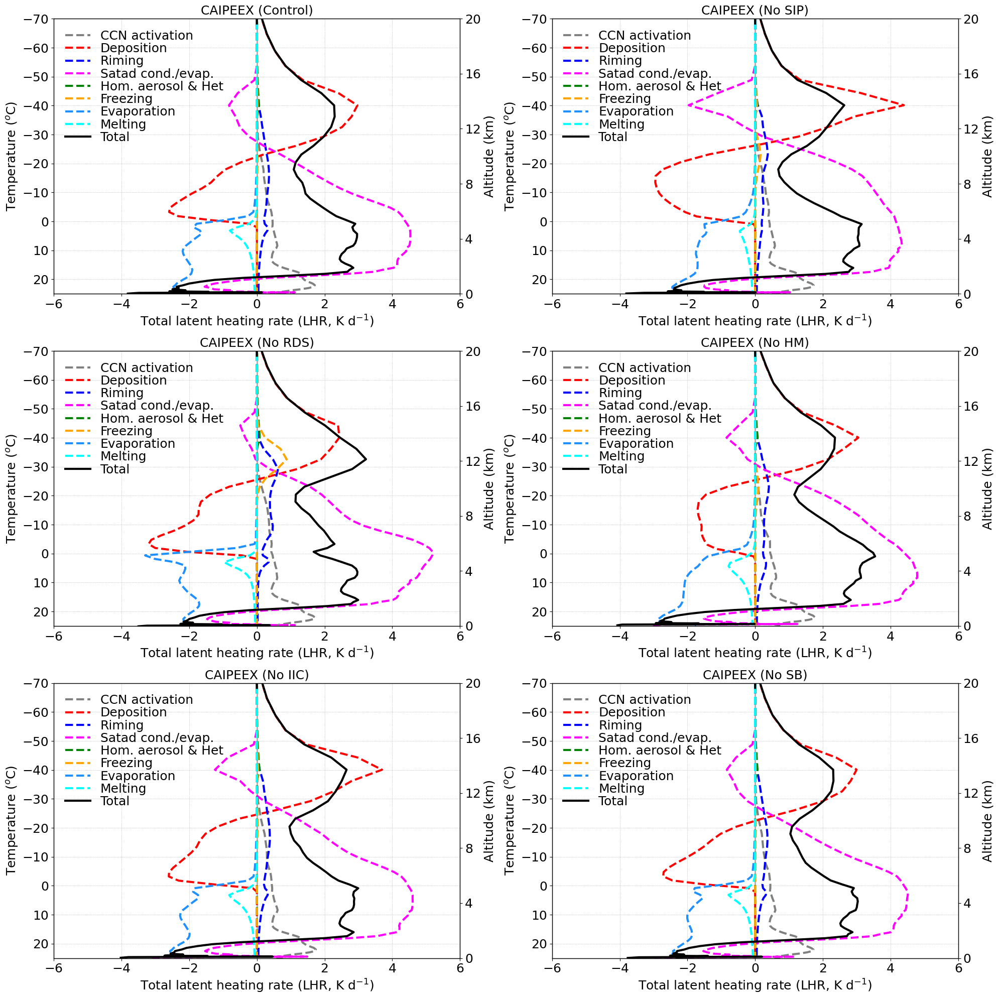

In [60]:
fontsize=18;
lnwdth=3;
alpha=0.8;

plt.figure(figsize=(20, 20))
plt.style.use('default')

plt.subplot(3,2,1)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_cond_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='grey', linewidth=lnwdth, label='CCN activation')
plt1.plot(mean_dep_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='red', linewidth=lnwdth, label='Deposition')
plt1.plot(mean_rime_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='blue', linewidth=lnwdth, label='Riming')
plt1.plot(mean_satad_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='magenta', linewidth=lnwdth, label='Satad cond./evap.')
plt1.plot(mean_homhet_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='green', linewidth=lnwdth, label='Hom. aerosol & Het')
plt1.plot(mean_rain_freez_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='orange', linewidth=lnwdth, label='Freezing')
plt1.plot(mean_evap_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='dodgerblue', linewidth=lnwdth, label='Evaporation')
plt1.plot(mean_melt_latent_heat_kperd_4sip, mean_tempc_4sip, '--', color='cyan', linewidth=lnwdth, label='Melting')
plt1.plot(mean_tot_latent_heating_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='Total')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_tot_latent_heating_kperd_4sip, mean_tempc_4sip, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-6., 6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX (Control)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.subplot(3,2,2)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_cond_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='CCN activation')
plt1.plot(mean_dep_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='red', linewidth=lnwdth, label='Deposition')
plt1.plot(mean_rime_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='blue', linewidth=lnwdth, label='Riming')
plt1.plot(mean_satad_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='magenta', linewidth=lnwdth, label='Satad cond./evap.')
plt1.plot(mean_homhet_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='green', linewidth=lnwdth, label='Hom. aerosol & Het')
plt1.plot(mean_rain_freez_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='orange', linewidth=lnwdth, label='Freezing')
plt1.plot(mean_evap_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='dodgerblue', linewidth=lnwdth, label='Evaporation')
plt1.plot(mean_melt_latent_heat_kperd_nosip, mean_tempc_nosip, '--', color='cyan', linewidth=lnwdth, label='Melting')
plt1.plot(mean_tot_latent_heating_kperd_nosip, mean_tempc_nosip, 'k-', linewidth=lnwdth, label='Total')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_tot_latent_heating_kperd_nosip, mean_tempc_nosip, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-6., 6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX (No SIP)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.subplot(3,2,3)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_cond_latent_heat_kperd_norf, mean_tempc_norf, '--', color='grey', linewidth=lnwdth, label='CCN activation')
plt1.plot(mean_dep_latent_heat_kperd_norf, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='Deposition')
plt1.plot(mean_rime_latent_heat_kperd_norf, mean_tempc_norf, '--', color='blue', linewidth=lnwdth, label='Riming')
plt1.plot(mean_satad_latent_heat_kperd_norf, mean_tempc_norf, '--', color='magenta', linewidth=lnwdth, label='Satad cond./evap.')
plt1.plot(mean_homhet_latent_heat_kperd_norf, mean_tempc_norf, '--', color='green', linewidth=lnwdth, label='Hom. aerosol & Het')
plt1.plot(mean_rain_freez_latent_heat_kperd_norf, mean_tempc_norf, '--', color='orange', linewidth=lnwdth, label='Freezing')
plt1.plot(mean_evap_latent_heat_kperd_norf, mean_tempc_norf, '--', color='dodgerblue', linewidth=lnwdth, label='Evaporation')
plt1.plot(mean_melt_latent_heat_kperd_norf, mean_tempc_norf, '--', color='cyan', linewidth=lnwdth, label='Melting')
plt1.plot(mean_tot_latent_heating_kperd_norf, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Total')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_tot_latent_heating_kperd_norf, mean_tempc_norf, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-6., 6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX (No RDS)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.subplot(3,2,4)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_cond_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='grey', linewidth=lnwdth, label='CCN activation')
plt1.plot(mean_dep_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='red', linewidth=lnwdth, label='Deposition')
plt1.plot(mean_rime_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='Riming')
plt1.plot(mean_satad_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='magenta', linewidth=lnwdth, label='Satad cond./evap.')
plt1.plot(mean_homhet_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='green', linewidth=lnwdth, label='Hom. aerosol & Het')
plt1.plot(mean_rain_freez_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='orange', linewidth=lnwdth, label='Freezing')
plt1.plot(mean_evap_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='dodgerblue', linewidth=lnwdth, label='Evaporation')
plt1.plot(mean_melt_latent_heat_kperd_nohm, mean_tempc_nohm, '--', color='cyan', linewidth=lnwdth, label='Melting')
plt1.plot(mean_tot_latent_heating_kperd_nohm, mean_tempc_nohm, 'k-', linewidth=lnwdth, label='Total')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_tot_latent_heating_kperd_nohm, mean_tempc_nohm, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-6., 6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX (No HM)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.subplot(3,2,5)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_cond_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='grey', linewidth=lnwdth, label='CCN activation')
plt1.plot(mean_dep_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='red', linewidth=lnwdth, label='Deposition')
plt1.plot(mean_rime_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='blue', linewidth=lnwdth, label='Riming')
plt1.plot(mean_satad_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='Satad cond./evap.')
plt1.plot(mean_homhet_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='green', linewidth=lnwdth, label='Hom. aerosol & Het')
plt1.plot(mean_rain_freez_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='orange', linewidth=lnwdth, label='Freezing')
plt1.plot(mean_evap_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='dodgerblue', linewidth=lnwdth, label='Evaporation')
plt1.plot(mean_melt_latent_heat_kperd_nobr, mean_tempc_nobr, '--', color='cyan', linewidth=lnwdth, label='Melting')
plt1.plot(mean_tot_latent_heating_kperd_nobr, mean_tempc_nobr, 'k-', linewidth=lnwdth, label='Total')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_tot_latent_heating_kperd_nosb, mean_tempc_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-6., 6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX (No IIC)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.subplot(3,2,6)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_cond_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='grey', linewidth=lnwdth, label='CCN activation')
plt1.plot(mean_dep_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='red', linewidth=lnwdth, label='Deposition')
plt1.plot(mean_rime_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='blue', linewidth=lnwdth, label='Riming')
plt1.plot(mean_satad_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='magenta', linewidth=lnwdth, label='Satad cond./evap.')
plt1.plot(mean_homhet_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='Hom. aerosol & Het')
plt1.plot(mean_rain_freez_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='orange', linewidth=lnwdth, label='Freezing')
plt1.plot(mean_evap_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='dodgerblue', linewidth=lnwdth, label='Evaporation')
plt1.plot(mean_melt_latent_heat_kperd_nosb, mean_tempc_nosb, '--', color='cyan', linewidth=lnwdth, label='Melting')
plt1.plot(mean_tot_latent_heating_kperd_nosb, mean_tempc_nosb, 'k-', linewidth=lnwdth, label='Total')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_tot_latent_heating_kperd_nosb, mean_tempc_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-6., 6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-4, -2, 0, 2, 4, 6, 8, 10])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt1.set_xlabel('Total latent heating rate (LHR, K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX (No SB)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.tight_layout()
plt.show()

In [ ]:
ds_4sip

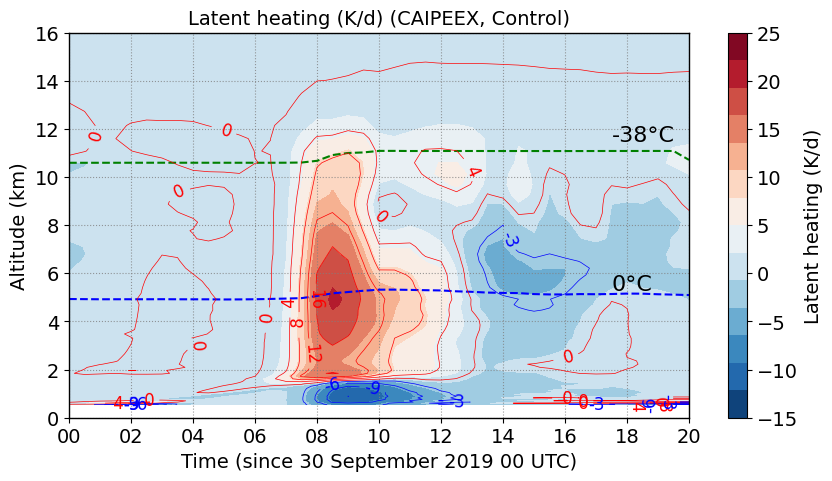

In [88]:

fnt=14;
ln=1.5;
alp1=0.3;

lev = np.linspace(-15, 25, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-15, -10, -5, 0, 5, 10, 15, 20, 25])#, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_4sip.time, mean_freez_lev_4sip, 'b--', linewidth=ln)
plt.plot(ds_4sip.time, mean_hom_lev_4sip, 'g--', linewidth=ln)

plt.text(ds_4sip.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_4sip.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)


contour_levels = np.arange(0.3, 25.5, 4)
contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='r', linestyles='-', linewidths=ln-1)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

contour_levels = np.arange(-15, -0.1, 3)
contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='b', linestyles='-', linewidths=ln-1)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

contour_levels = np.arange(0.1, 12.5, 4)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.cond_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='grey', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.cond_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='grey', alpha=alp1)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

contour_levels = np.arange(-8, 14.5, 3)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.dep_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='red', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.dep_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='red', alpha=alp1)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

contour_levels = np.arange(0.1, 2.5, 0.3)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.rime_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='blue', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.rime_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='blue', alpha=alp1, zorder=2)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%.1f')

contour_levels = np.arange(-10, 20.5, 6)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.satad_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='magenta', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.satad_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='magenta', alpha=alp1, zorder=2)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

contour_levels = np.arange(0.01, 0.5, 0.1)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.homhet_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='green', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.homhet_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='green', alpha=alp1, zorder=2)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%.2f')

contour_levels = np.arange(0.01, 0.02, 0.008)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.rainfreez_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='orange', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.rainfreez_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='orange', alpha=alp1, zorder=2)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%.2f')

contour_levels = np.arange(-12, 0., 3)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.evap_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='dodgerblue', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.evap_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='dodgerblue', alpha=alp1, zorder=2)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%1d')

contour_levels = np.arange(-3, 0., 0.8)
#contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.melt_lhr_kperd.mean(dim=('ncells')).T, levels=contour_levels, colors='cyan', linestyles='-', linewidths=ln)
#plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.melt_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='cyan', alpha=alp1, zorder=2)
#plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%.1f')



for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()


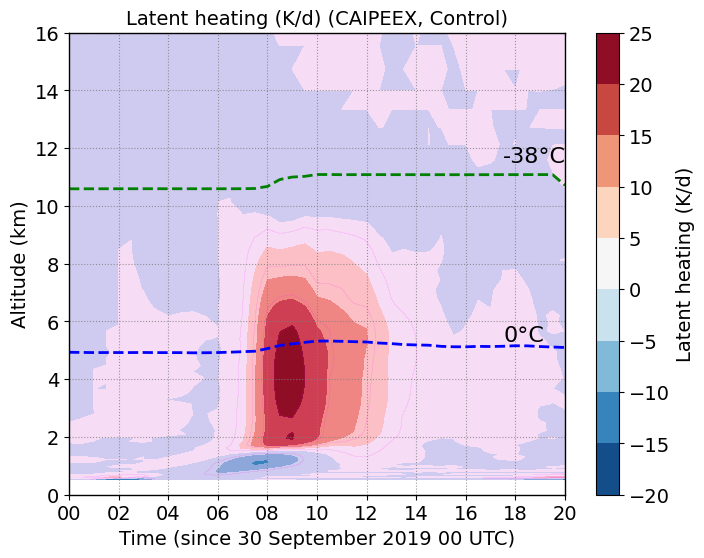

In [55]:

fnt=14;
ln=2;
lev = np.linspace(-8, 14, 15)

plt.figure(figsize=(8,6))
plt.style.use('default')

cnt=plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt)#, ticks=[0, 2, 4, 6, 8, 10, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_4sip.time, mean_freez_lev_4sip, 'b--', linewidth=ln)
plt.plot(ds_4sip.time, mean_hom_lev_4sip, 'g--', linewidth=ln)

plt.text(ds_4sip.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_4sip.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-10, 20.5, 6)
plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.melt_lhr_kperd.mean(dim='ncells').T, levels=contour_levels, colors='magenta', alpha=0.1)


for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()


## Freezing level

In [13]:
mask = (ds_4sip.tempc > -0.2) & (ds_4sip.tempc < 0.)
mean_freez_lev_4sip = 1.e-3*(ds_4sip.z_mc.where(mask)).mean(dim=('height','ncells'))
mask = (ds_4sip.tempc > -38.5) & (ds_4sip.tempc < -37.5)
mean_hom_lev_4sip = 1.e-3*(ds_4sip.z_mc.where(mask)).mean(dim=('height','ncells'))

mask = (ds_nosip.tempc > -0.2) & (ds_nosip.tempc < 0.)
mean_freez_lev_nosip = 1.e-3*(ds_nosip.z_mc.where(mask)).mean(dim=('height','ncells'))
mask = (ds_nosip.tempc > -38.5) & (ds_nosip.tempc < -37.5)
mean_hom_lev_nosip = 1.e-3*(ds_nosip.z_mc.where(mask)).mean(dim=('height','ncells'))

mask = (ds_norf.tempc > -0.2) & (ds_norf.tempc < 0.)
mean_freez_lev_norf = 1.e-3*(ds_norf.z_mc.where(mask)).mean(dim=('height','ncells'))
mask = (ds_norf.tempc > -38.5) & (ds_norf.tempc < -37.5)
mean_hom_lev_norf = 1.e-3*(ds_norf.z_mc.where(mask)).mean(dim=('height','ncells'))

mask = (ds_nohm.tempc > -0.2) & (ds_nohm.tempc < 0.)
mean_freez_lev_nohm = 1.e-3*(ds_nohm.z_mc.where(mask)).mean(dim=('height','ncells'))
mask = (ds_nohm.tempc > -38.5) & (ds_nohm.tempc < -37.5)
mean_hom_lev_nohm = 1.e-3*(ds_nohm.z_mc.where(mask)).mean(dim=('height','ncells'))

mask = (ds_nobr.tempc > -0.2) & (ds_nobr.tempc < 0.)
mean_freez_lev_nobr = 1.e-3*(ds_nobr.z_mc.where(mask)).mean(dim=('height','ncells'))
mask = (ds_nobr.tempc > -38.5) & (ds_nobr.tempc < -37.5)
mean_hom_lev_nobr = 1.e-3*(ds_nobr.z_mc.where(mask)).mean(dim=('height','ncells'))

mask = (ds_nosb.tempc > -0.2) & (ds_nosb.tempc < 0.)
mean_freez_lev_nosb = 1.e-3*(ds_nosb.z_mc.where(mask)).mean(dim=('height','ncells'))
mask = (ds_nosb.tempc > -38.5) & (ds_nosb.tempc < -37.5)
mean_hom_lev_nosb = 1.e-3*(ds_nosb.z_mc.where(mask)).mean(dim=('height','ncells'))


#plt.plot(ds_4sip.time, mean_hom_lev_4sip, 'k-', linewidth=ln, label='Control')

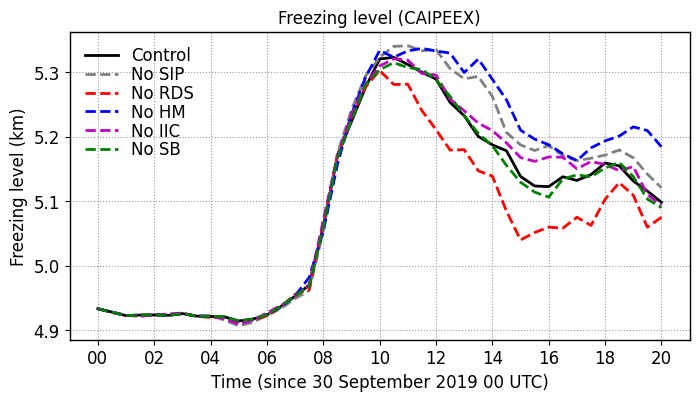

In [14]:



fnt=12;
ln=2;
plt.figure(figsize=(8,4))
plt.style.use('default')

plt.plot(ds_4sip.time, mean_freez_lev_4sip, 'k-', linewidth=ln, label='Control')
plt.plot(ds_nosip.time, mean_freez_lev_nosip, '--', color='grey', linewidth=ln, label='No SIP')
plt.plot(ds_norf.time, mean_freez_lev_norf, 'r--', linewidth=ln, label='No RDS')
plt.plot(ds_nohm.time, mean_freez_lev_nohm, 'b--', linewidth=ln, label='No HM')
plt.plot(ds_nobr.time, mean_freez_lev_nobr, 'm--', linewidth=ln, label='No IIC')
plt.plot(ds_nosb.time, mean_freez_lev_nosb, 'g--', linewidth=ln, label='No SB')

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
#plt.ylim(3.6, 4.4)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Freezing level (km)', fontsize=fnt)
plt.title('Freezing level (CAIPEEX)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

In [16]:
ds_4sip.time

<xarray.DataArray 'time' (time: 41)> Size: 328B
array(['2019-09-30T00:00:00.000000000', '2019-09-30T00:30:00.000000000',
       '2019-09-30T01:00:00.000000000', '2019-09-30T01:30:00.000000000',
       '2019-09-30T02:00:00.000000000', '2019-09-30T02:30:00.000000000',
       '2019-09-30T03:00:00.000000000', '2019-09-30T03:30:00.000000000',
       '2019-09-30T04:00:00.000000000', '2019-09-30T04:30:00.000000000',
       '2019-09-30T05:00:00.000000000', '2019-09-30T05:30:00.000000000',
       '2019-09-30T06:00:00.000000000', '2019-09-30T06:30:00.000000000',
       '2019-09-30T07:00:00.000000000', '2019-09-30T07:30:00.000000000',
       '2019-09-30T08:00:00.000000000', '2019-09-30T08:30:00.000000000',
       '2019-09-30T09:00:00.000000000', '2019-09-30T09:30:00.000000000',
       '2019-09-30T10:00:00.000000000', '2019-09-30T10:30:00.000000000',
       '2019-09-30T11:00:00.000000000', '2019-09-30T11:30:00.000000000',
       '2019-09-30T12:00:00.000000000', '2019-09-30T12:30:00.000000000',
       '2019-09-30T13:00:00.000000000', '2019-09-30T13:30:00.000000000',
       '2019-09-30T14:00:00.000000000', '2019-09-30T14:30:00.000000000',
       '2019-09-30T15:00:00.000000000', '2019-09-30T15:30:00.000000000',
       '2019-09-30T16:00:00.000000000', '2019-09-30T16:30:00.000000000',
       '2019-09-30T17:00:00.000000000', '2019-09-30T17:30:00.000000000',
       '2019-09-30T18:00:00.000000000', '2019-09-30T18:30:00.000000000',
       '2019-09-30T19:00:00.000000000', '2019-09-30T19:30:00.000000000',
       '2019-09-30T20:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 328B 2019-09-30 ... 2019-09-30T20:00:00
Attributes:
    standard_name:  time
    axis:           T

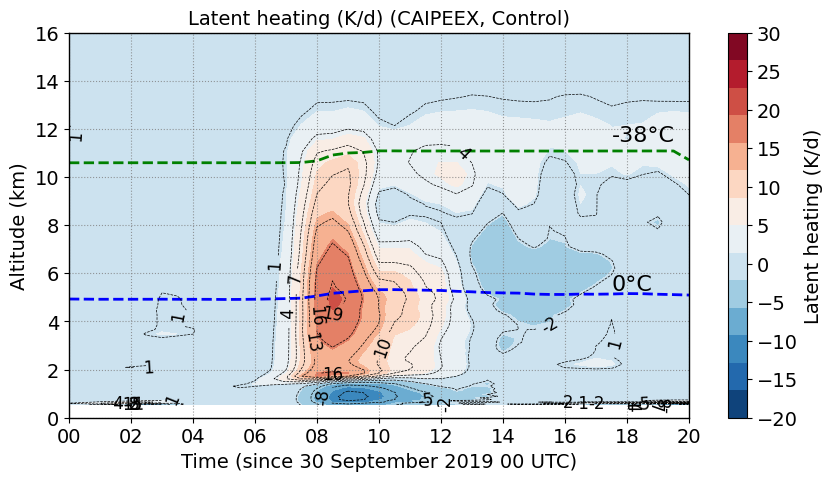

In [51]:
fnt=14;
ln=2;
lev = np.linspace(-20, 30, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_4sip.time, mean_ht_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_4sip.time, mean_freez_lev_4sip, 'b--', linewidth=ln)
plt.plot(ds_4sip.time, mean_hom_lev_4sip, 'g--', linewidth=ln)

plt.text(ds_4sip.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_4sip.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-20, 30.5, 3)
contours = plt.contour(ds_4sip.time, mean_ht_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

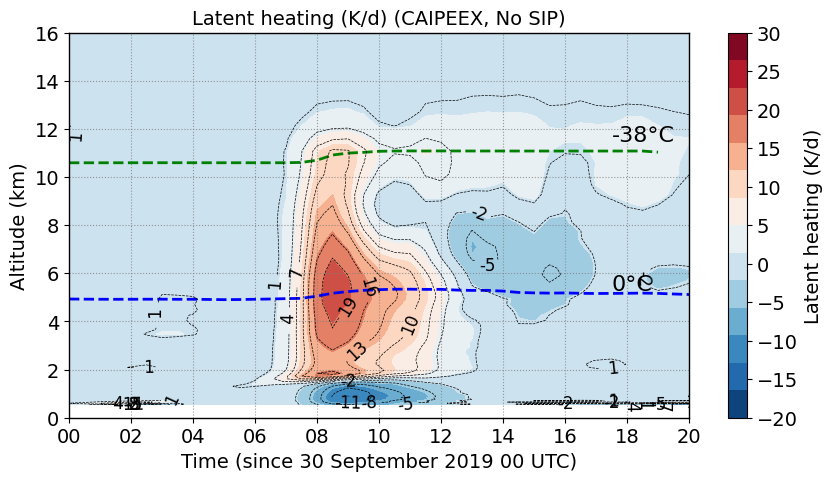

In [50]:
fnt=14;
ln=2;
lev = np.linspace(-20, 30, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nosip.time, mean_ht_nosip, ds_nosip.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nosip.time, mean_freez_lev_nosip, 'b--', linewidth=ln)
plt.plot(ds_nosip.time, mean_hom_lev_nosip, 'g--', linewidth=ln)

plt.text(ds_nosip.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nosip.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, No SIP)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-20, 30.5, 3)
contours = plt.contour(ds_nosip.time, mean_ht_nosip, ds_nosip.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

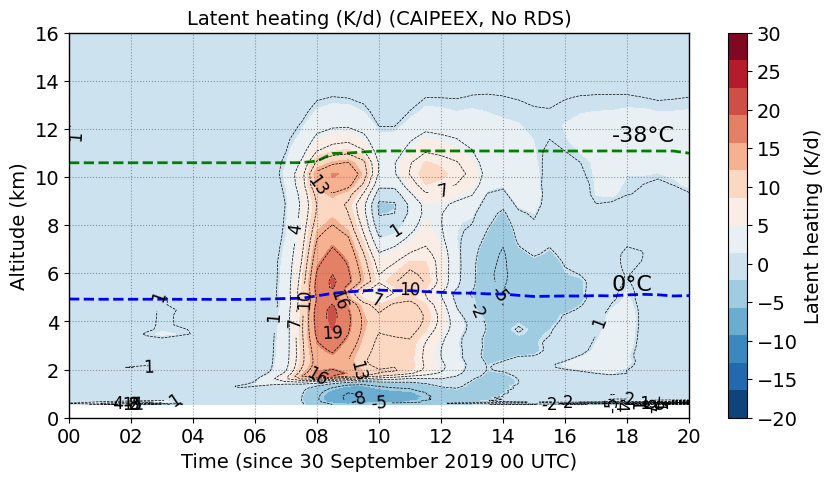

In [54]:
fnt=14;
ln=2;
lev = np.linspace(-20, 30, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_norf.time, mean_ht_norf, ds_norf.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_norf.time, mean_freez_lev_norf, 'b--', linewidth=ln)
plt.plot(ds_norf.time, mean_hom_lev_norf, 'g--', linewidth=ln)

plt.text(ds_norf.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_norf.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, No RDS)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-20, 30.5, 3)
contours = plt.contour(ds_norf.time, mean_ht_norf, ds_norf.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

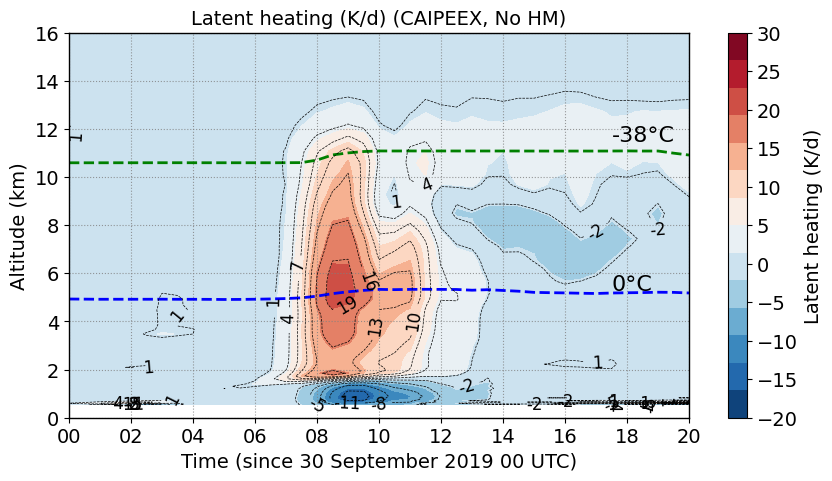

In [53]:
fnt=14;
ln=2;
lev = np.linspace(-20, 30, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nohm.time, mean_ht_nohm, ds_nohm.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nohm.time, mean_freez_lev_nohm, 'b--', linewidth=ln)
plt.plot(ds_nohm.time, mean_hom_lev_nohm, 'g--', linewidth=ln)

plt.text(ds_nohm.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nohm.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, No HM)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-20, 30.5, 3)
contours = plt.contour(ds_nohm.time, mean_ht_nohm, ds_nohm.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

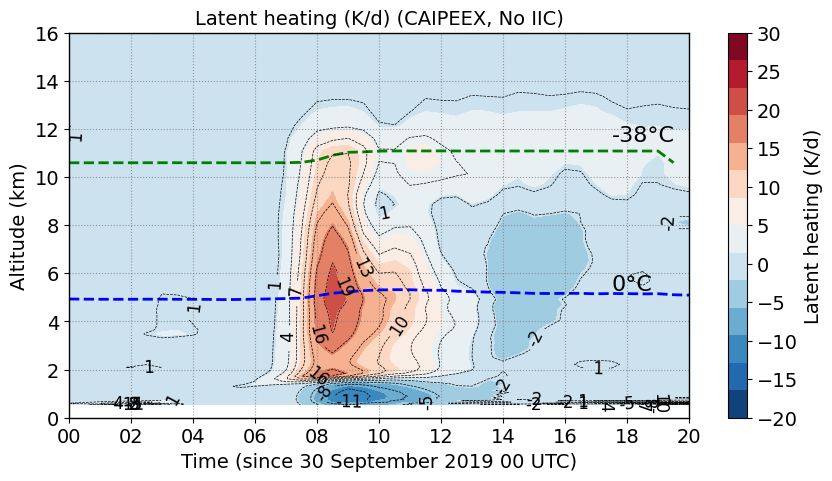

In [55]:
fnt=14;
ln=2;
lev = np.linspace(-20, 30, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nobr.time, mean_ht_nobr, ds_nobr.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nobr.time, mean_freez_lev_nobr, 'b--', linewidth=ln)
plt.plot(ds_nobr.time, mean_hom_lev_nobr, 'g--', linewidth=ln)

plt.text(ds_nobr.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nobr.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, No IIC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-20, 30.5, 3)
contours = plt.contour(ds_nobr.time, mean_ht_nobr, ds_nobr.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

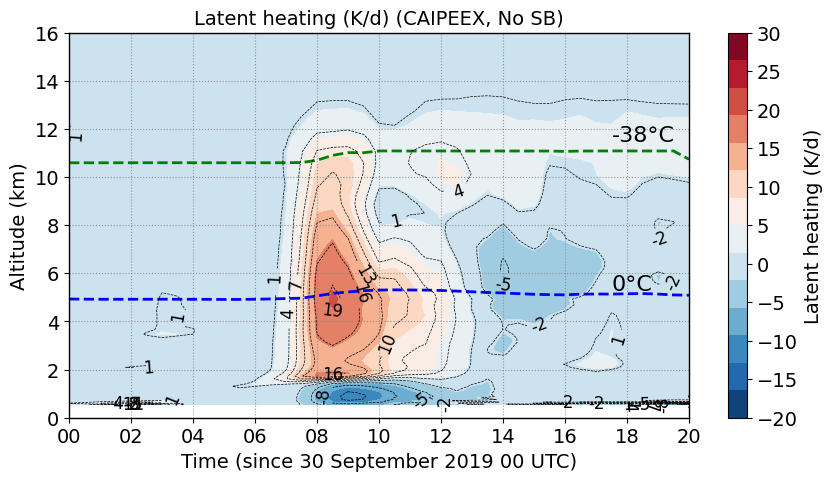

In [56]:
fnt=14;
ln=2;
lev = np.linspace(-20, 30, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nosb.time, mean_ht_nosb, ds_nosb.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nosb.time, mean_freez_lev_nosb, 'b--', linewidth=ln)
plt.plot(ds_nosb.time, mean_hom_lev_nosb, 'g--', linewidth=ln)

plt.text(ds_nosb.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nosb.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, No SB)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-20, 30.5, 3)
contours = plt.contour(ds_nosb.time, mean_ht_nosb, ds_nosb.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

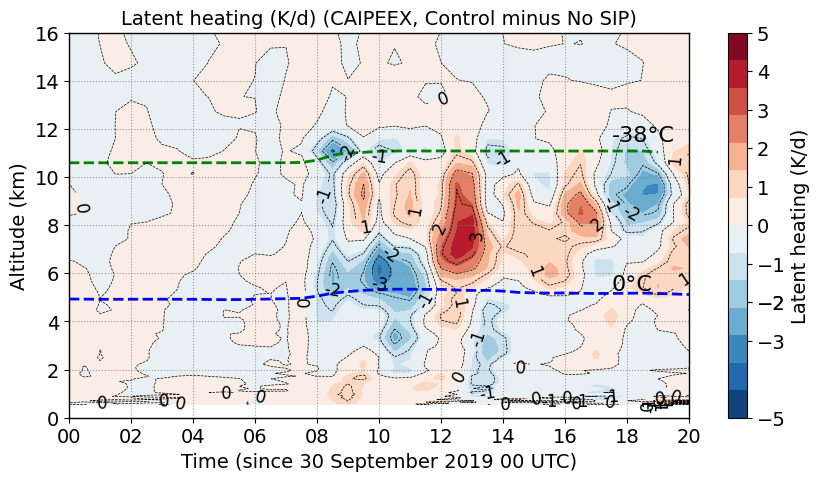

In [62]:
fnt=14;
ln=2;
lev = np.linspace(-5, 5, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nosip.time, mean_ht_nosip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nosip.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-5, -2, -3, -2, -1, 0, 1, 2, 3, 4, 5])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nosip.time, mean_freez_lev_nosip, 'b--', linewidth=ln)
plt.plot(ds_nosip.time, mean_hom_lev_nosip, 'g--', linewidth=ln)

plt.text(ds_nosip.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nosip.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control minus No SIP)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-5, 5.5, 1)
contours = plt.contour(ds_nosip.time, mean_ht_nosip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nosip.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

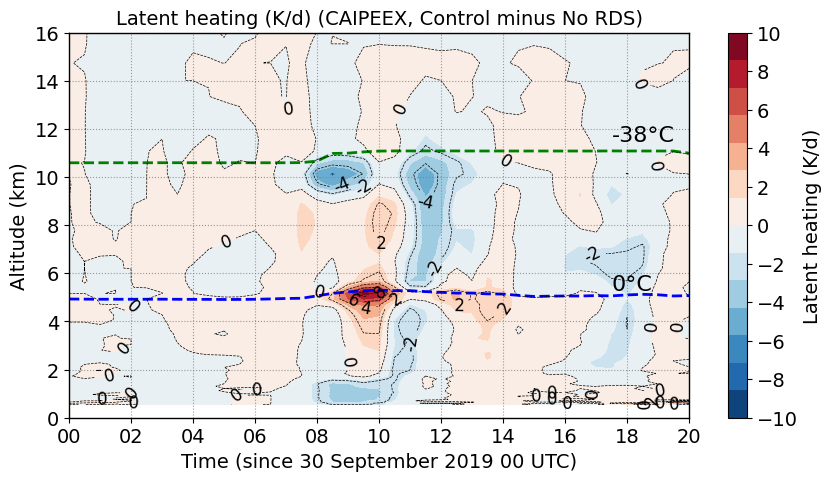

In [67]:
fnt=14;
ln=2;
lev = np.linspace(-10, 10, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_norf.time, mean_ht_norf, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_norf.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-10, -8, -6, -4, -2, 0, 2, 4, 6, 8, 10])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_norf.time, mean_freez_lev_norf, 'b--', linewidth=ln)
plt.plot(ds_norf.time, mean_hom_lev_norf, 'g--', linewidth=ln)

plt.text(ds_norf.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_norf.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control minus No RDS)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-10, 10.5, 2)
contours = plt.contour(ds_norf.time, mean_ht_norf, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_norf.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

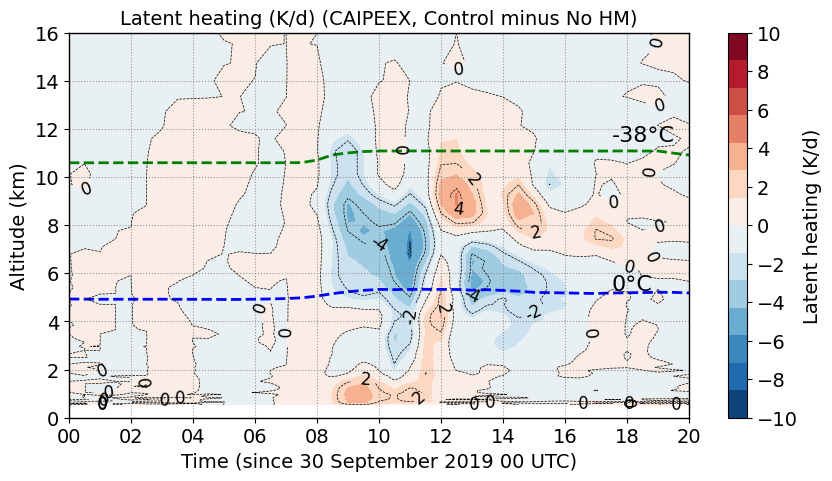

In [68]:
fnt=14;
ln=2;
lev = np.linspace(-10, 10, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nohm.time, mean_ht_nohm, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nohm.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-10, -8, -6, -4, -2, 0, 2, 4, 6, 8, 10])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nohm.time, mean_freez_lev_nohm, 'b--', linewidth=ln)
plt.plot(ds_nohm.time, mean_hom_lev_nohm, 'g--', linewidth=ln)

plt.text(ds_nohm.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nohm.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control minus No HM)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-10, 10.5, 2)
contours = plt.contour(ds_nohm.time, mean_ht_nohm, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nohm.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

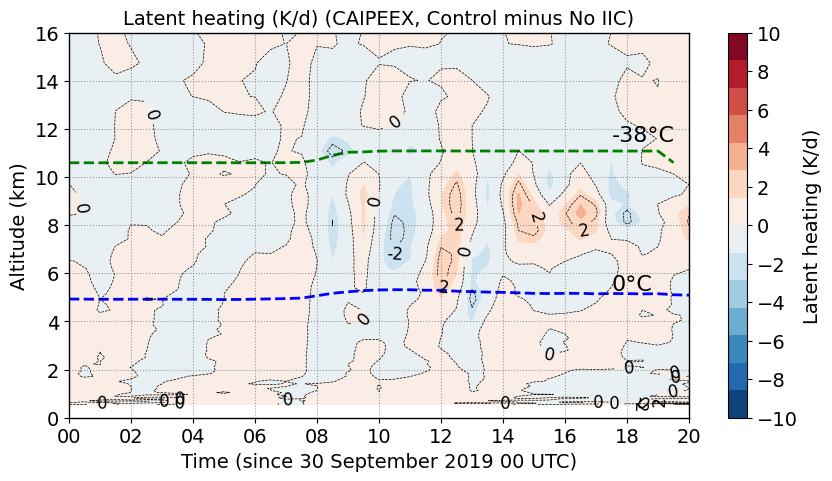

In [69]:
fnt=14;
ln=2;
lev = np.linspace(-10, 10, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nobr.time, mean_ht_nobr, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nobr.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-10, -8, -6, -4, -2, 0, 2, 4, 6, 8, 10])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nobr.time, mean_freez_lev_nobr, 'b--', linewidth=ln)
plt.plot(ds_nobr.time, mean_hom_lev_nobr, 'g--', linewidth=ln)

plt.text(ds_nobr.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nobr.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control minus No IIC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-10, 10.5, 2)
contours = plt.contour(ds_nobr.time, mean_ht_nobr, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nobr.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

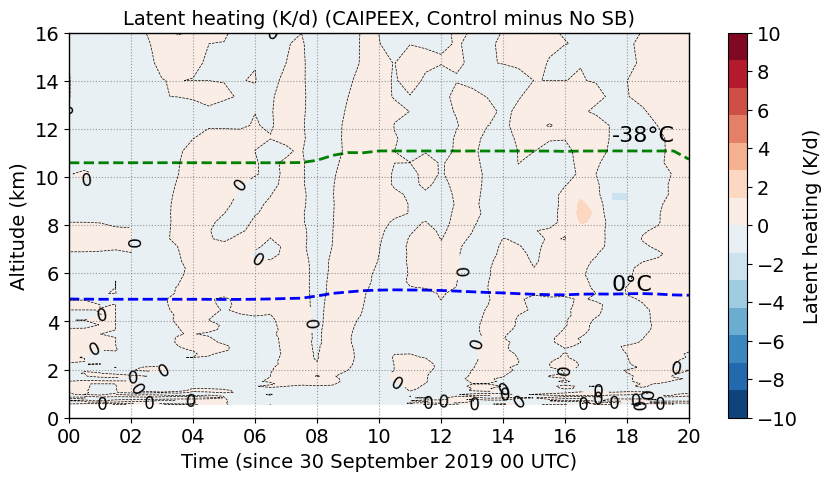

In [70]:
fnt=14;
ln=2;
lev = np.linspace(-10, 10, 15)

plt.figure(figsize=(10,5))
plt.style.use('default')

cnt=plt.contourf(ds_nosb.time, mean_ht_nosb, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nosb.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='RdBu_r')#'coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-10, -8, -6, -4, -2, 0, 2, 4, 6, 8, 10])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K/d)', size=fnt)

plt.plot(ds_nosb.time, mean_freez_lev_nosb, 'b--', linewidth=ln)
plt.plot(ds_nosb.time, mean_hom_lev_nosb, 'g--', linewidth=ln)

plt.text(ds_nosb.time[35], 5.3, '0°C', fontsize=fnt+2)
plt.text(ds_nosb.time[35], 11.5, '-38°C', fontsize=fnt+2)

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fnt)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

#plt.ylim(20, -60)
plt.ylim(0, 16)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Latent heating (K/d) (CAIPEEX, Control minus No SB)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-10, 10.5, 2)
contours = plt.contour(ds_nosb.time, mean_ht_nosb, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nosb.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=0.5)
plt.clabel(contours, inline=True, fontsize=fnt-2, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

## Cloud top height

In [7]:
thres_q = 1.e-3
cld_mask = ds_4sip.twc_gperm3 > thres_q;
mean_cld_top_ht = ds_4sip.z_mc.where(cld_mask)
mean_cld_top_ht_4sip = (mean_cld_top_ht.max(dim='height')).mean(dim=('ncells'))

cld_mask = (ds_nosip.twc_gperm3 > thres_q) & (ds_nosip.w_vel > 0.);
mean_cld_top_ht = ds_nosip.z_mc.where(cld_mask)
mean_cld_top_ht_nosip = (mean_cld_top_ht.max(dim='height')).mean(dim=('ncells'))

cld_mask = ds_norf.twc_gperm3 > thres_q;
mean_cld_top_ht = ds_norf.z_mc.where(cld_mask)
mean_cld_top_ht_norf = (mean_cld_top_ht.max(dim='height')).mean(dim=('ncells'))

cld_mask = ds_nohm.twc_gperm3 > thres_q;
mean_cld_top_ht = ds_nohm.z_mc.where(cld_mask)
mean_cld_top_ht_nohm = (mean_cld_top_ht.max(dim='height')).mean(dim=('ncells'))

cld_mask = ds_nobr.twc_gperm3 > thres_q;
mean_cld_top_ht = ds_nobr.z_mc.where(cld_mask)
mean_cld_top_ht_nobr = (mean_cld_top_ht.max(dim='height')).mean(dim=('ncells'))

cld_mask = ds_nosb.twc_gperm3 > thres_q;
mean_cld_top_ht = ds_nosb.z_mc.where(cld_mask)
mean_cld_top_ht_nosb = (mean_cld_top_ht.max(dim='height')).mean(dim=('ncells'))

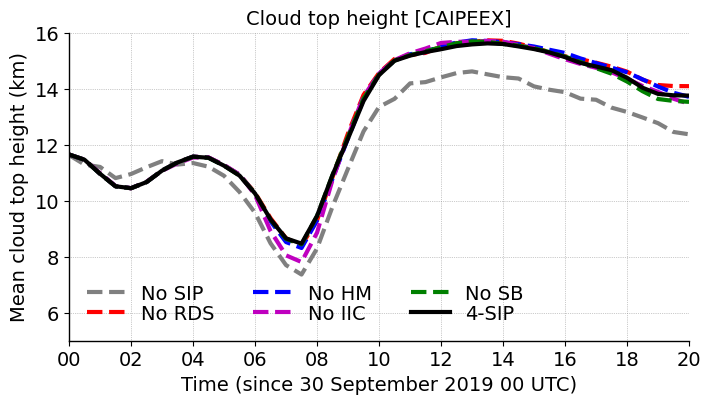

In [10]:




plt.figure(figsize=(8, 4))
plt.style.use('default')

lnwdth=3
fontsize=14

plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, 1.e-3*mean_cld_top_ht_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, 1.e-3*mean_cld_top_ht_norf, 'r--', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, 1.e-3*mean_cld_top_ht_nohm, 'b--', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, 1.e-3*mean_cld_top_ht_nobr, 'm--', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, 1.e-3*mean_cld_top_ht_nosb, 'g--', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, 1.e-3*mean_cld_top_ht_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fontsize)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.ylim(5,16)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Mean cloud top height (km)', fontsize=fontsize)#, fontweight='bold')
plt.title('Cloud top height [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, ncols=3, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()


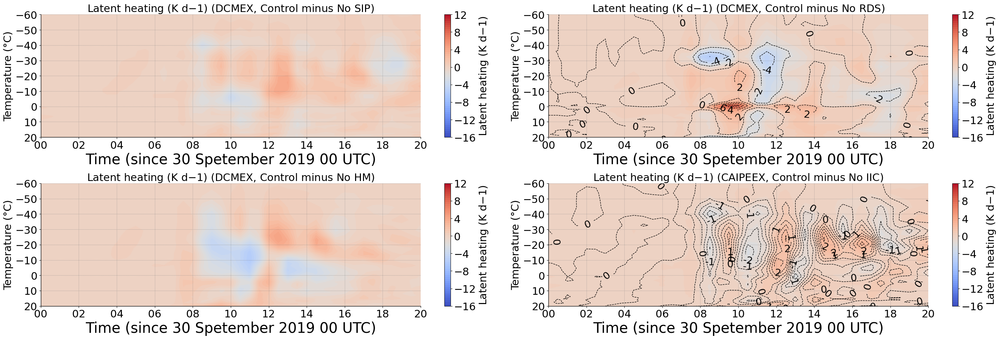

In [51]:

fnt=22
lev = np.linspace(-16, 12, 60)

plt.figure(figsize=(30,10))
plt.style.use('default')

plt.subplot(2,2,1)
cnt=plt.contourf(ds_4sip.time, mean_tempc_4sip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nosip.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-16, -12, -8, -4, 0, 4, 8, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K d${-1}$)', size=fnt)

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.ylim(20, -60)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Temperature (°C)', fontsize=fnt)
plt.title('Latent heating (K d${-1}$) (DCMEX, Control minus No SIP)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(2,2,2)
cnt=plt.contourf(ds_nosip.time, mean_tempc_nosip, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_norf.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-16, -12, -8, -4, 0, 4, 8, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K d${-1}$)', size=fnt)

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.ylim(20, -60)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Temperature (°C)', fontsize=fnt)
plt.title('Latent heating (K d${-1}$) (DCMEX, Control minus No RDS)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)


contour_levels = np.arange(-12, 12.5, 2.)  
contours = plt.contour(ds_norf.time, mean_tempc_norf, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_norf.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=1)
# Add contour labels
plt.clabel(contours, inline=True, fontsize=fnt-1, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(2,2,3)
cnt=plt.contourf(ds_norf.time, mean_tempc_norf, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nohm.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-16, -12, -8, -4, 0, 4, 8, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K d${-1}$)', size=fnt)

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.ylim(20, -60)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Temperature (°C)', fontsize=fnt)
plt.title('Latent heating (K d${-1}$) (DCMEX, Control minus No HM)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(2,2,4)
cnt=plt.contourf(ds_nobr.time, mean_tempc_nobr, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nobr.lhr_kperd.mean(dim=('ncells')).T, levels=lev, cmap='coolwarm')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-16, -12, -8, -4, 0, 4, 8, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Latent heating (K d${-1}$)', size=fnt)

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.ylim(20, -60)

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.ylabel('Temperature (°C)', fontsize=fnt)
plt.title('Latent heating (K d${-1}$) (CAIPEEX, Control minus No IIC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

contour_levels = np.arange(-5, 5.5, 0.5)  
contours = plt.contour(ds_nobr.time, mean_tempc_nobr, ds_4sip.lhr_kperd.mean(dim=('ncells')).T-ds_nobr.lhr_kperd.mean(dim=('ncells')).T, 
                       levels=contour_levels, colors='black', linestyles='--', linewidths=1)
# Add contour labels
plt.clabel(contours, inline=True, fontsize=fnt-1, fmt='%2d')

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
   
plt.tight_layout()
plt.show()

## TOA Radiative Fluxes

#### Calculating CRE
##### SW CRE = (Qcld_sw_dn - Qcld_sw_up) - (Qclear_sw_dn - Qclear_sw_up)
##### LW CRE = (Qcld_lw_dn - Qcld_lw_up) - (Qclear_lw_dn - Qclear_lw_up)
##### Net CRE = SW_CRE + LW_CRE

In [7]:

#### SIP 
toa_sw_up_4sip = ds_4sip.swflx_up.isel(height_2=0).mean('ncells') 
toa_sw_up_clr_4sip = ds_4sip.swflx_up_clr.isel(height_2=0).mean('ncells') 
toa_lw_up_4sip = ds_4sip.lwflx_up.isel(height_2=0).mean('ncells') 
toa_lw_up_clr_4sip = ds_4sip.lwflx_up_clr.isel(height_2=0).mean('ncells') 

toa_sw_dn_4sip = ds_4sip.swflx_dn.isel(height_2=0).mean('ncells') 
toa_sw_dn_clr_4sip = ds_4sip.swflx_dn_clr.isel(height_2=0).mean('ncells') 
toa_lw_dn_4sip = ds_4sip.lwflx_dn.isel(height_2=0).mean('ncells') 
toa_lw_dn_clr_4sip = ds_4sip.lwflx_dn_clr.isel(height_2=0).mean('ncells') 

toa_sw_cre_4sip = (toa_sw_dn_4sip-toa_sw_up_4sip) - (toa_sw_dn_clr_4sip-toa_sw_up_clr_4sip)
toa_lw_cre_4sip = (toa_sw_dn_4sip-toa_lw_up_4sip) - (toa_sw_dn_clr_4sip-toa_lw_up_clr_4sip)
toa_net_cre_4sip = toa_sw_cre_4sip+toa_lw_cre_4sip

ds_4sip['toa_sw_cre'] = toa_sw_cre_4sip
ds_4sip['toa_lw_cre'] = toa_lw_cre_4sip
ds_4sip['toa_net_cre'] = toa_net_cre_4sip


#### No SIP 
toa_sw_up_nosip = ds_nosip.swflx_up.isel(height_2=0).mean('ncells') #ds_nosip.swflx_up[:,0,:]
toa_sw_up_clr_nosip = ds_nosip.swflx_up_clr.isel(height_2=0).mean('ncells') #ds_nosip.swflx_up_clr[:,0,:]
toa_lw_up_nosip = ds_nosip.lwflx_up.isel(height_2=0).mean('ncells') #ds_nosip.lwflx_up[:,0,:]
toa_lw_up_clr_nosip = ds_nosip.lwflx_up_clr.isel(height_2=0).mean('ncells') #ds_nosip.lwflx_up_clr[:,0,:]

toa_sw_dn_nosip = ds_nosip.swflx_dn.isel(height_2=0).mean('ncells') #ds_nosip.swflx_dn[:,0,:]
toa_sw_dn_clr_nosip = ds_nosip.swflx_dn_clr.isel(height_2=0).mean('ncells') #ds_nosip.swflx_dn_clr[:,0,:]
toa_lw_dn_nosip = ds_nosip.lwflx_dn.isel(height_2=0).mean('ncells') #ds_nosip.lwflx_dn[:,0,:]
toa_lw_dn_clr_nosip = ds_nosip.lwflx_dn_clr.isel(height_2=0).mean('ncells') #ds_nosip.lwflx_dn_clr[:,0,:]

toa_sw_cre_nosip = (toa_sw_dn_nosip-toa_sw_up_nosip) - (toa_sw_dn_clr_nosip-toa_sw_up_clr_nosip)
toa_lw_cre_nosip = (toa_sw_dn_nosip-toa_lw_up_nosip) - (toa_sw_dn_clr_nosip-toa_lw_up_clr_nosip)
toa_net_cre_nosip = toa_sw_cre_nosip+toa_lw_cre_nosip

ds_nosip['toa_sw_cre'] = toa_sw_cre_nosip
ds_nosip['toa_lw_cre'] = toa_lw_cre_nosip
ds_nosip['toa_net_cre'] = toa_net_cre_nosip
ds_nosip['del_toa_sw_cre'] = toa_sw_cre_4sip-toa_sw_cre_nosip
ds_nosip['del_toa_lw_cre'] = toa_lw_cre_4sip-toa_lw_cre_nosip
ds_nosip['del_toa_net_cre'] = toa_net_cre_4sip-toa_net_cre_nosip

#### No RF 
toa_sw_up_norf = ds_norf.swflx_up.isel(height_2=0).mean('ncells') 
toa_sw_up_clr_norf = ds_norf.swflx_up_clr.isel(height_2=0).mean('ncells') 
toa_lw_up_norf = ds_norf.lwflx_up.isel(height_2=0).mean('ncells') 
toa_lw_up_clr_norf = ds_norf.lwflx_up_clr.isel(height_2=0).mean('ncells') 

toa_sw_dn_norf = ds_norf.swflx_dn.isel(height_2=0).mean('ncells') 
toa_sw_dn_clr_norf = ds_norf.swflx_dn_clr.isel(height_2=0).mean('ncells') 
toa_lw_dn_norf = ds_norf.lwflx_dn.isel(height_2=0).mean('ncells') 
toa_lw_dn_clr_norf = ds_norf.lwflx_dn_clr.isel(height_2=0).mean('ncells')

toa_sw_cre_norf = (toa_sw_dn_norf-toa_sw_up_norf) - (toa_sw_dn_clr_norf-toa_sw_up_clr_norf)
toa_lw_cre_norf = (toa_sw_dn_norf-toa_lw_up_norf) - (toa_sw_dn_clr_norf-toa_lw_up_clr_norf)
toa_net_cre_norf = toa_sw_cre_norf+toa_lw_cre_norf

ds_norf['toa_sw_cre'] = toa_sw_cre_norf
ds_norf['toa_lw_cre'] = toa_lw_cre_norf
ds_norf['toa_net_cre'] = toa_net_cre_norf
ds_norf['del_toa_sw_cre'] = toa_sw_cre_4sip-toa_sw_cre_norf
ds_norf['del_toa_lw_cre'] = toa_lw_cre_4sip-toa_lw_cre_norf
ds_norf['del_toa_net_cre'] = toa_net_cre_4sip-toa_net_cre_norf

#### No HM 
toa_sw_up_nohm = ds_nohm.swflx_up.isel(height_2=0).mean('ncells') 
toa_sw_up_clr_nohm = ds_nohm.swflx_up_clr.isel(height_2=0).mean('ncells') 
toa_lw_up_nohm = ds_nohm.lwflx_up.isel(height_2=0).mean('ncells') 
toa_lw_up_clr_nohm = ds_nohm.lwflx_up_clr.isel(height_2=0).mean('ncells') 

toa_sw_dn_nohm = ds_nohm.swflx_dn.isel(height_2=0).mean('ncells') 
toa_sw_dn_clr_nohm = ds_nohm.swflx_dn_clr.isel(height_2=0).mean('ncells') 
toa_lw_dn_nohm = ds_nohm.lwflx_dn.isel(height_2=0).mean('ncells') 
toa_lw_dn_clr_nohm = ds_nohm.lwflx_dn_clr.isel(height_2=0).mean('ncells')

toa_sw_cre_nohm = (toa_sw_dn_nohm-toa_sw_up_nohm) - (toa_sw_dn_clr_nohm-toa_sw_up_clr_nohm)
toa_lw_cre_nohm = (toa_sw_dn_nohm-toa_lw_up_nohm) - (toa_sw_dn_clr_nohm-toa_lw_up_clr_nohm)
toa_net_cre_nohm = toa_sw_cre_nohm+toa_lw_cre_nohm

ds_nohm['toa_sw_cre'] = toa_sw_cre_nohm
ds_nohm['toa_lw_cre'] = toa_lw_cre_nohm
ds_nohm['toa_net_cre'] = toa_net_cre_nohm
ds_nohm['del_toa_sw_cre'] = toa_sw_cre_4sip-toa_sw_cre_nohm
ds_nohm['del_toa_lw_cre'] = toa_lw_cre_4sip-toa_lw_cre_nohm
ds_nohm['del_toa_net_cre'] = toa_net_cre_4sip-toa_net_cre_nohm

#### No IIC 
toa_sw_up_nobr = ds_nobr.swflx_up.isel(height_2=0).mean('ncells') 
toa_sw_up_clr_nobr = ds_nobr.swflx_up_clr.isel(height_2=0).mean('ncells') 
toa_lw_up_nobr = ds_nobr.lwflx_up.isel(height_2=0).mean('ncells') 
toa_lw_up_clr_nobr = ds_nobr.lwflx_up_clr.isel(height_2=0).mean('ncells') 

toa_sw_dn_nobr = ds_nobr.swflx_dn.isel(height_2=0).mean('ncells') 
toa_sw_dn_clr_nobr = ds_nobr.swflx_dn_clr.isel(height_2=0).mean('ncells') 
toa_lw_dn_nobr = ds_nobr.lwflx_dn.isel(height_2=0).mean('ncells') 
toa_lw_dn_clr_nobr = ds_nobr.lwflx_dn_clr.isel(height_2=0).mean('ncells')

toa_sw_cre_nobr = (toa_sw_dn_nobr-toa_sw_up_nobr) - (toa_sw_dn_clr_nobr-toa_sw_up_clr_nobr)
toa_lw_cre_nobr = (toa_sw_dn_nobr-toa_lw_up_nobr) - (toa_sw_dn_clr_nobr-toa_lw_up_clr_nobr)
toa_net_cre_nobr = toa_sw_cre_nobr+toa_lw_cre_nobr

ds_nobr['toa_sw_cre'] = toa_sw_cre_nobr
ds_nobr['toa_lw_cre'] = toa_lw_cre_nobr
ds_nobr['toa_net_cre'] = toa_net_cre_nobr
ds_nobr['del_toa_sw_cre'] = toa_sw_cre_4sip-toa_sw_cre_nobr
ds_nobr['del_toa_lw_cre'] = toa_lw_cre_4sip-toa_lw_cre_nobr
ds_nobr['del_toa_net_cre'] = toa_net_cre_4sip-toa_net_cre_nobr

#### No SB 
toa_sw_up_nosb = ds_nosb.swflx_up.isel(height_2=0).mean('ncells') 
toa_sw_up_clr_nosb = ds_nosb.swflx_up_clr.isel(height_2=0).mean('ncells') 
toa_lw_up_nosb = ds_nosb.lwflx_up.isel(height_2=0).mean('ncells') 
toa_lw_up_clr_nosb = ds_nosb.lwflx_up_clr.isel(height_2=0).mean('ncells') 

toa_sw_dn_nosb = ds_nosb.swflx_dn.isel(height_2=0).mean('ncells') 
toa_sw_dn_clr_nosb = ds_nosb.swflx_dn_clr.isel(height_2=0).mean('ncells') 
toa_lw_dn_nosb = ds_nosb.lwflx_dn.isel(height_2=0).mean('ncells') 
toa_lw_dn_clr_nosb = ds_nosb.lwflx_dn_clr.isel(height_2=0).mean('ncells')

toa_sw_cre_nosb = (toa_sw_dn_nosb-toa_sw_up_nosb) - (toa_sw_dn_clr_nosb-toa_sw_up_clr_nosb)
toa_lw_cre_nosb = (toa_sw_dn_nosb-toa_lw_up_nosb) - (toa_sw_dn_clr_nosb-toa_lw_up_clr_nosb)
toa_net_cre_nosb = toa_sw_cre_nosb+toa_lw_cre_nosb

ds_nosb['toa_sw_cre'] = toa_sw_cre_nosb
ds_nosb['toa_lw_cre'] = toa_lw_cre_nosb
ds_nosb['toa_net_cre'] = toa_net_cre_nosb
ds_nosb['del_toa_sw_cre'] = toa_sw_cre_4sip-toa_sw_cre_nosb
ds_nosb['del_toa_lw_cre'] = toa_lw_cre_4sip-toa_lw_cre_nosb
ds_nosb['del_toa_net_cre'] = toa_net_cre_4sip-toa_net_cre_nosb


#### Change in CRE w.r.t. 4-SIP (control run)
del_toa_sw_cre_nosip = toa_sw_cre_4sip-toa_sw_cre_nosip
del_toa_sw_cre_norf = toa_sw_cre_4sip-toa_sw_cre_norf
del_toa_sw_cre_nohm = toa_sw_cre_4sip-toa_sw_cre_nohm 
del_toa_sw_cre_nobr = toa_sw_cre_4sip-toa_sw_cre_nobr 
del_toa_sw_cre_nosb = toa_sw_cre_4sip-toa_sw_cre_nosb 

del_toa_lw_cre_nosip = toa_lw_cre_4sip-toa_lw_cre_nosip
del_toa_lw_cre_norf = toa_lw_cre_4sip-toa_lw_cre_norf
del_toa_lw_cre_nohm = toa_lw_cre_4sip-toa_lw_cre_nohm 
del_toa_lw_cre_nobr = toa_lw_cre_4sip-toa_lw_cre_nobr 
del_toa_lw_cre_nosb = toa_lw_cre_4sip-toa_lw_cre_nosb 

del_toa_net_cre_nosip = toa_net_cre_4sip-toa_net_cre_nosip 
del_toa_net_cre_norf = toa_net_cre_4sip-toa_net_cre_norf 
del_toa_net_cre_nohm = toa_net_cre_4sip-toa_net_cre_nohm  
del_toa_net_cre_nobr = toa_net_cre_4sip-toa_net_cre_nobr 
del_toa_net_cre_nosb = toa_net_cre_4sip-toa_net_cre_nosb 

per_del_toa_sw_cre_nosip = 100*(del_toa_sw_cre_nosip)/np.abs(toa_sw_cre_4sip)
per_del_toa_sw_cre_norf = 100*(del_toa_sw_cre_norf)/np.abs(toa_sw_cre_4sip)
per_del_toa_sw_cre_nohm = 100*(del_toa_sw_cre_nohm)/np.abs(toa_sw_cre_4sip)
per_del_toa_sw_cre_nobr = 100*(del_toa_sw_cre_nobr)/np.abs(toa_sw_cre_4sip)
per_del_toa_sw_cre_nosb = 100*(del_toa_sw_cre_nosb)/np.abs(toa_sw_cre_4sip)

per_del_toa_sw_cre_nosip = per_del_toa_sw_cre_nosip.fillna(0)
per_del_toa_sw_cre_norf = per_del_toa_sw_cre_norf.fillna(0)
per_del_toa_sw_cre_nohm = per_del_toa_sw_cre_nohm.fillna(0)
per_del_toa_sw_cre_nobr = per_del_toa_sw_cre_nobr.fillna(0)
per_del_toa_sw_cre_nosb = per_del_toa_sw_cre_nosb.fillna(0)

per_del_toa_lw_cre_nosip = 100*(del_toa_lw_cre_nosip)/np.abs(toa_lw_cre_4sip)
per_del_toa_lw_cre_norf = 100*(del_toa_lw_cre_norf)/np.abs(toa_lw_cre_4sip)
per_del_toa_lw_cre_nohm = 100*(del_toa_lw_cre_nohm)/np.abs(toa_lw_cre_4sip)
per_del_toa_lw_cre_nobr = 100*(del_toa_lw_cre_nobr)/np.abs(toa_lw_cre_4sip)
per_del_toa_lw_cre_nosb = 100*(del_toa_lw_cre_nosb)/np.abs(toa_lw_cre_4sip)

per_del_toa_net_cre_nosip = 100*(del_toa_net_cre_nosip)/np.abs(toa_net_cre_4sip)
per_del_toa_net_cre_norf = 100*(del_toa_net_cre_norf)/np.abs(toa_net_cre_4sip)
per_del_toa_net_cre_nohm = 100*(del_toa_net_cre_nohm)/np.abs(toa_net_cre_4sip)
per_del_toa_net_cre_nobr = 100*(del_toa_net_cre_nobr)/np.abs(toa_net_cre_4sip)
per_del_toa_net_cre_nosb = 100*(del_toa_net_cre_nosb)/np.abs(toa_net_cre_4sip)


## Box plots of TOA radiative fluxes

In [29]:

## 4 SIP
min_toa_lw_cre_4sip = ds_4sip.toa_lw_cre.min().values; max_toa_lw_cre_4sip = ds_4sip.toa_lw_cre.max().values
mean_toa_lw_cre_4sip = ds_4sip.toa_lw_cre.mean().values

min_toa_sw_cre_4sip = ds_4sip.toa_sw_cre.min().values; max_toa_sw_cre_4sip = ds_4sip.toa_sw_cre.max().values
mean_toa_sw_cre_4sip = ds_4sip.toa_sw_cre.mean().values

min_toa_net_cre_4sip = ds_4sip.toa_net_cre.min().values; max_toa_net_cre_4sip = ds_4sip.toa_net_cre.max().values
mean_toa_net_cre_4sip = ds_4sip.toa_net_cre.mean().values


## No SIP
min_toa_lw_cre_nosip = ds_nosip.toa_lw_cre.min().values; max_toa_lw_cre_nosip = ds_nosip.toa_lw_cre.max().values
mean_toa_lw_cre_nosip = ds_nosip.toa_lw_cre.mean().values

min_toa_sw_cre_nosip = ds_nosip.toa_sw_cre.min().values; max_toa_sw_cre_nosip = ds_nosip.toa_sw_cre.max().values
mean_toa_sw_cre_nosip = ds_nosip.toa_sw_cre.mean().values

min_toa_net_cre_nosip = ds_nosip.toa_net_cre.min().values; max_toa_net_cre_nosip = ds_nosip.toa_net_cre.max().values
mean_toa_net_cre_nosip = ds_nosip.toa_net_cre.mean().values

del_min_toa_lw_cre_nosip = min_toa_lw_cre_4sip-min_toa_lw_cre_nosip; del_max_toa_lw_cre_nosip = max_toa_lw_cre_4sip-max_toa_lw_cre_nosip;
del_mean_toa_lw_cre_nosip = mean_toa_lw_cre_4sip-mean_toa_lw_cre_nosip; 
del_min_toa_sw_cre_nosip = min_toa_sw_cre_4sip-min_toa_sw_cre_nosip; del_max_toa_sw_cre_nosip = max_toa_sw_cre_4sip-max_toa_sw_cre_nosip;
del_mean_toa_sw_cre_nosip = mean_toa_sw_cre_4sip-mean_toa_sw_cre_nosip; 
del_min_toa_net_cre_nosip = min_toa_net_cre_4sip-min_toa_net_cre_nosip; del_max_toa_net_cre_nosip = max_toa_net_cre_4sip-max_toa_net_cre_nosip;
del_mean_toa_net_cre_nosip = mean_toa_net_cre_4sip-mean_toa_net_cre_nosip; 

## No RDS
min_toa_lw_cre_norf = ds_norf.toa_lw_cre.min().values; max_toa_lw_cre_norf = ds_norf.toa_lw_cre.max().values
mean_toa_lw_cre_norf = ds_norf.toa_lw_cre.mean().values

min_toa_sw_cre_norf = ds_norf.toa_sw_cre.min().values; max_toa_sw_cre_norf = ds_norf.toa_sw_cre.max().values
mean_toa_sw_cre_norf = ds_norf.toa_sw_cre.mean().values

min_toa_net_cre_norf = ds_norf.toa_net_cre.min().values; max_toa_net_cre_norf = ds_norf.toa_net_cre.max().values
mean_toa_net_cre_norf = ds_norf.toa_net_cre.mean().values

del_min_toa_lw_cre_norf = min_toa_lw_cre_4sip-min_toa_lw_cre_norf; del_max_toa_lw_cre_norf = max_toa_lw_cre_4sip-max_toa_lw_cre_norf;
del_mean_toa_lw_cre_norf = mean_toa_lw_cre_4sip-mean_toa_lw_cre_norf; 
del_min_toa_sw_cre_norf = min_toa_sw_cre_4sip-min_toa_sw_cre_norf; del_max_toa_sw_cre_norf = max_toa_sw_cre_4sip-max_toa_sw_cre_norf;
del_mean_toa_sw_cre_norf = mean_toa_sw_cre_4sip-mean_toa_sw_cre_norf; 
del_min_toa_net_cre_norf = min_toa_net_cre_4sip-min_toa_net_cre_norf; del_max_toa_net_cre_norf = max_toa_net_cre_4sip-max_toa_net_cre_norf;
del_mean_toa_net_cre_norf = mean_toa_net_cre_4sip-mean_toa_net_cre_norf;

## No HM
min_toa_lw_cre_nohm = ds_nohm.toa_lw_cre.min().values; max_toa_lw_cre_nohm = ds_nohm.toa_lw_cre.max().values
mean_toa_lw_cre_nohm = ds_nohm.toa_lw_cre.mean().values

min_toa_sw_cre_nohm = ds_nohm.toa_sw_cre.min().values; max_toa_sw_cre_nohm = ds_nohm.toa_sw_cre.max().values
mean_toa_sw_cre_nohm = ds_nohm.toa_sw_cre.mean().values

min_toa_net_cre_nohm = ds_nohm.toa_net_cre.min().values; max_toa_net_cre_nohm = ds_nohm.toa_net_cre.max().values
mean_toa_net_cre_nohm = ds_nohm.toa_net_cre.mean().values

del_min_toa_lw_cre_nohm = min_toa_lw_cre_4sip-min_toa_lw_cre_nohm; del_max_toa_lw_cre_nohm = max_toa_lw_cre_4sip-max_toa_lw_cre_nohm;
del_mean_toa_lw_cre_nohm = mean_toa_lw_cre_4sip-mean_toa_lw_cre_nohm; 
del_min_toa_sw_cre_nohm = min_toa_sw_cre_4sip-min_toa_sw_cre_nohm; del_max_toa_sw_cre_nohm = max_toa_sw_cre_4sip-max_toa_sw_cre_nohm;
del_mean_toa_sw_cre_nohm = mean_toa_sw_cre_4sip-mean_toa_sw_cre_nohm; 
del_min_toa_net_cre_nohm = min_toa_net_cre_4sip-min_toa_net_cre_nohm; del_max_toa_net_cre_nohm = max_toa_net_cre_4sip-max_toa_net_cre_nohm;
del_mean_toa_net_cre_nohm = mean_toa_net_cre_4sip-mean_toa_net_cre_nohm;

## No BR
min_toa_lw_cre_nobr = ds_nobr.toa_lw_cre.min().values; max_toa_lw_cre_nobr = ds_nobr.toa_lw_cre.max().values
mean_toa_lw_cre_nobr = ds_nobr.toa_lw_cre.mean().values

min_toa_sw_cre_nobr = ds_nobr.toa_sw_cre.min().values; max_toa_sw_cre_nobr = ds_nobr.toa_sw_cre.max().values
mean_toa_sw_cre_nobr = ds_nobr.toa_sw_cre.mean().values

min_toa_net_cre_nobr = ds_nobr.toa_net_cre.min().values; max_toa_net_cre_nobr = ds_nobr.toa_net_cre.max().values
mean_toa_net_cre_nobr = ds_nobr.toa_net_cre.mean().values

del_min_toa_lw_cre_nobr = min_toa_lw_cre_4sip-min_toa_lw_cre_nobr; del_max_toa_lw_cre_nobr = max_toa_lw_cre_4sip-max_toa_lw_cre_nobr;
del_mean_toa_lw_cre_nobr = mean_toa_lw_cre_4sip-mean_toa_lw_cre_nobr; 
del_min_toa_sw_cre_nobr = min_toa_sw_cre_4sip-min_toa_sw_cre_nobr; del_max_toa_sw_cre_nobr = max_toa_sw_cre_4sip-max_toa_sw_cre_nobr;
del_mean_toa_sw_cre_nobr = mean_toa_sw_cre_4sip-mean_toa_sw_cre_nobr; 
del_min_toa_net_cre_nobr = min_toa_net_cre_4sip-min_toa_net_cre_nobr; del_max_toa_net_cre_nobr = max_toa_net_cre_4sip-max_toa_net_cre_nobr;
del_mean_toa_net_cre_nobr = mean_toa_net_cre_4sip-mean_toa_net_cre_nobr;

## No SB
min_toa_lw_cre_nosb = ds_nosb.toa_lw_cre.min().values; max_toa_lw_cre_nosb = ds_nosb.toa_lw_cre.max().values
mean_toa_lw_cre_nosb = ds_nosb.toa_lw_cre.mean().values

min_toa_sw_cre_nosb = ds_nosb.toa_sw_cre.min().values; max_toa_sw_cre_nosb = ds_nosb.toa_sw_cre.max().values
mean_toa_sw_cre_nosb = ds_nosb.toa_sw_cre.mean().values

min_toa_net_cre_nosb = ds_nosb.toa_net_cre.min().values; max_toa_net_cre_nosb = ds_nosb.toa_net_cre.max().values
mean_toa_net_cre_nosb = ds_nosb.toa_net_cre.mean().values

del_min_toa_lw_cre_nosb = min_toa_lw_cre_4sip-min_toa_lw_cre_nosb; del_max_toa_lw_cre_nosb = max_toa_lw_cre_4sip-max_toa_lw_cre_nosb;
del_mean_toa_lw_cre_nosb = mean_toa_lw_cre_4sip-mean_toa_lw_cre_nosb; 
del_min_toa_sw_cre_nosb = min_toa_sw_cre_4sip-min_toa_sw_cre_nosb; del_max_toa_sw_cre_nosb = max_toa_sw_cre_4sip-max_toa_sw_cre_nosb;
del_mean_toa_sw_cre_nosb = mean_toa_sw_cre_4sip-mean_toa_sw_cre_nosb; 
del_min_toa_net_cre_nosb = min_toa_net_cre_4sip-min_toa_net_cre_nosb; del_max_toa_net_cre_nosb = max_toa_net_cre_4sip-max_toa_net_cre_nosb;
del_mean_toa_net_cre_nosb = mean_toa_net_cre_4sip-mean_toa_net_cre_nosb;


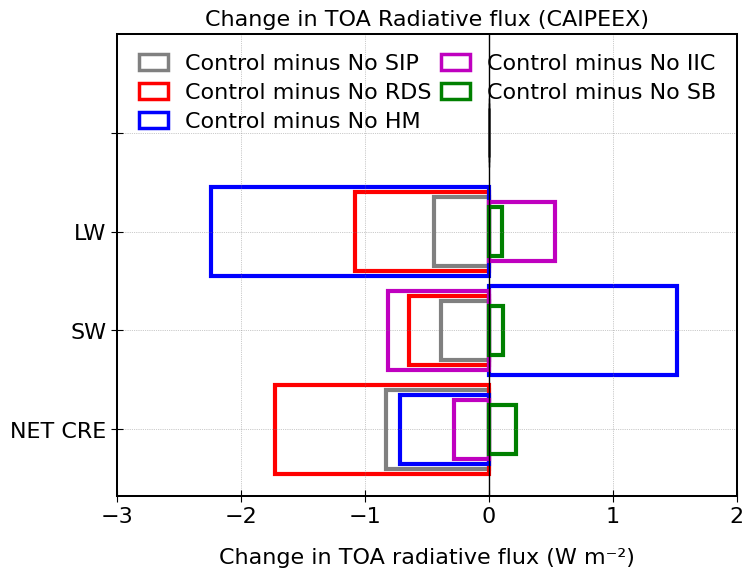

In [46]:
import matplotlib.pyplot as plt
import numpy as np

fnt = 16.0
ln=3;
x = np.array([1, 2, 3, 4])
#w1, w2, w3, w4, w5 = 0.9, 0.6, 0.7, 0.6, 0.5
w1, w2, w3, w4, w5 = 0.9, 0.8, 0.7, 0.6, 0.5

# Data for bars (assuming they are defined elsewhere in your code)
# Q_glc_lif_acm, Q_mix_lif_acm, Q_ice_lif_acm, etc.

#plt.figure('AIE CLOUDS', figsize=(12, 12))

# Plotting
#plt.figure('AIE CLOUDS')
plt.figure(figsize=(8,6))
plt.style.use('default')

plt.gca().tick_params(axis='both', which='major', labelsize=fnt)
plt.gca().tick_params(axis='both', which='minor', labelsize=fnt)
plt.gca().tick_params(axis='both', direction='inout')
plt.gca().tick_params(axis='both', length=8)


plt.barh(x[0], 0., height=w3, color='g', edgecolor='black')
plt.barh(x[0], 0., height=w4, color='b', edgecolor='black')
plt.barh(x[0], 0., height=w5, color='m', edgecolor='black')
plt.barh(x[0], 0., height=w5, color='g', edgecolor='black')
plt.barh(x[0], 0., height=w5, color='c', edgecolor='black')

# Total CLOUD AIE

plt.barh(x[1], del_mean_toa_lw_cre_nosip, height=w3, color='k', linewidth=ln, facecolor='none', edgecolor='grey')
plt.barh(x[1], del_mean_toa_lw_cre_norf, height=w2, color='r', linewidth=ln, facecolor='none', edgecolor='r')
plt.barh(x[1], del_mean_toa_lw_cre_nohm, height=w1, color='b', linewidth=ln, facecolor='none', edgecolor='b')
plt.barh(x[1], del_mean_toa_lw_cre_nobr, height=w4, color='m', linewidth=ln, facecolor='none', edgecolor='m')
plt.barh(x[1], del_mean_toa_lw_cre_nosb, height=w5, color='g', linewidth=ln, facecolor='none', edgecolor='g')


plt.barh(x[2], del_mean_toa_sw_cre_nosip, height=w4, color='k', linewidth=ln, facecolor='none', edgecolor='grey')
plt.barh(x[2], del_mean_toa_sw_cre_norf, height=w3, color='r', linewidth=ln, facecolor='none', edgecolor='r')
plt.barh(x[2], del_mean_toa_sw_cre_nohm, height=w1, color='b', linewidth=ln, facecolor='none', edgecolor='b')
plt.barh(x[2], del_mean_toa_sw_cre_nobr, height=w2, color='m', linewidth=ln, facecolor='none', edgecolor='m')
plt.barh(x[2], del_mean_toa_sw_cre_nosb, height=w5, color='g', linewidth=ln, facecolor='none', edgecolor='g')


plt.barh(x[3], del_mean_toa_net_cre_nosip, height=w2, color='k', linewidth=ln, facecolor='none', edgecolor='grey')
plt.barh(x[3], del_mean_toa_net_cre_norf, height=w1, color='r', linewidth=ln, facecolor='none', edgecolor='r')
plt.barh(x[3], del_mean_toa_net_cre_nohm, height=w3, color='b', linewidth=ln, facecolor='none', edgecolor='b')
plt.barh(x[3], del_mean_toa_net_cre_nobr, height=w4, color='m', linewidth=ln, facecolor='none', edgecolor='m')
plt.barh(x[3], del_mean_toa_net_cre_nosb, height=w5, color='g', linewidth=ln, facecolor='none', edgecolor='g')

plt.axvline(x=0, color='k', linewidth=ln-2, linestyle='-')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.xlim([-3.0, 2.0])
plt.yticks(x,['', 'LW', 'SW', 'NET CRE'], fontsize=fnt, rotation=0.)
plt.xlabel('Change in TOA radiative flux (W m⁻²)', fontsize=fnt, labelpad=15)
plt.gca().invert_yaxis()

colors = ['grey', 'r', 'b', 'm', 'g']
#labels = ['Total clouds', 'Glaciated clouds', 'Liquid-only clouds', 'Mixed-phase clouds', 'Ice-only clouds']
labels = ['Control minus No SIP', 'Control minus No RDS', 'Control minus No HM', 'Control minus No IIC', 'Control minus No SB']
hBLG = [plt.bar([0, 0], [0, 0], color=colors[i]) for i in range(len(colors))]
legend=plt.legend(hBLG, labels, loc='best', fontsize=fnt, ncol=2, frameon=False, facecolor='none', 
                  handlelength=1.3, labelspacing=0.4, columnspacing=0.4)
for patch, color in zip(legend.get_patches(), colors):
    patch.set_facecolor('none')      # Transparent fill
    patch.set_edgecolor(color)       # Colored edge
    patch.set_linewidth(ln-0.5) 
    
#plt.tight_layout(pad=-1.0)

plt.title('Change in TOA Radiative flux (CAIPEEX)', fontsize=fnt)
#plt.grid(False)
plt.gca().spines['top'].set_linewidth(1.45)
plt.gca().spines['right'].set_linewidth(1.45)
plt.gca().spines['bottom'].set_linewidth(1.45)
plt.gca().spines['left'].set_linewidth(1.45)

plt.show()


## Web plot of TOA radiative fluxes 

In [12]:
import xarray as xr
import numpy as np
import pandas as pd

# List of storm datasets and a standard prefix map
storm_datasets = {
    #'Control': ds_4sip,
    'No SIP': ds_nosip,
    'No RDS': ds_norf,
    'No HM': ds_nohm,
    'No IIC': ds_nobr,
    'No SB': ds_nosb
}

def extract_features(ds, prefix):
    def safe_stat(var, func):
        return func(ds[var].values[np.isfinite(ds[var].values)])
    
    return {
        'SW$_{min}$': safe_stat(f'del_toa_sw_cre', np.min),
        'SW$_{max}$': safe_stat(f'del_toa_sw_cre', np.max),
        'SW$_{mean}$': safe_stat(f'del_toa_sw_cre', np.mean),
        'LW$_{min}$': safe_stat(f'del_toa_lw_cre', np.min),
        'LW$_{max}$': safe_stat(f'del_toa_lw_cre', np.max),
        'LW$_{mean}$': safe_stat(f'del_toa_lw_cre', np.mean),
        'NET CRE$_{min}$': safe_stat(f'del_toa_net_cre', np.min),
        'NET CRE$_{mean}$': safe_stat(f'del_toa_net_cre', np.mean)#,
        #'PEAK_SW_time': np.nanargmin(ds[f'toa_sw_cre_4sip'].values),
        #'PEAK_LW_time': np.nanargmax(ds[f'toa_lw_cre_4sip'].values)
    }

features = []
labels = []

for name, ds in storm_datasets.items():
    feats = extract_features(ds, name)
    features.append(feats)
    labels.append(name.upper())

df = pd.DataFrame(features, index=labels)


In [8]:
df

,SW$_{min}$,SW$_{max}$,SW$_{mean}$,LW$_{min}$,LW$_{max}$,LW$_{mean}$,NET CRE$_{min}$,NET CRE$_{mean}$
NO SIP,-15.879761,10.095795,-0.386790,-8.550308,13.216141,-0.441322,-10.567932,-0.828111
NO RDS,-8.596741,1.011536,-0.642579,-4.438354,2.291931,-1.078156,-6.304810,-1.720736
NO HM,-1.738464,12.782745,1.519870,-7.213730,1.077576,-2.236931,-7.002930,-0.717061
NO IIC,-17.816040,12.123718,-0.812306,-8.584854,16.055740,0.536412,-12.176819,-0.275894
NO SB,-1.774963,1.707947,0.114196,-2.539093,5.388702,0.106405,-2.471695,0.220602


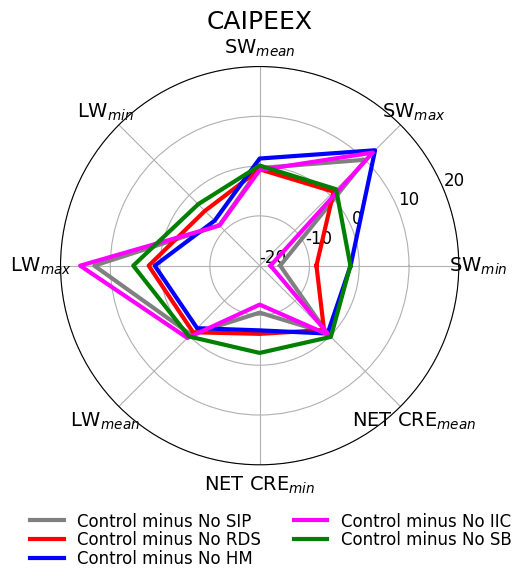

In [44]:
import matplotlib.pyplot as plt
import numpy as np
from math import pi

label_map = {
    "NO SIP": "Control minus No SIP",
    "NO RDS": "Control minus No RDS",
    "NO HM": "Control minus No HM",
    "NO IIC": "Control minus No IIC",
    "NO SB": "Control minus No SB"
}

fnt=14;
ln=3;
def multi_radar_plot(df):#, title="Storm Radiative properties"):
    labels = df.columns
    num_vars = len(labels)

    # Compute angles
    angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
    angles += [angles[0]]  # to close the loop

    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw=dict(polar=True))
    plt.style.use('default')
    # Plot each storm
    #colors = plt.cm.tab10.colors  # 10 distinct colors
    custom_colors = {
    #"CONTROL": "black",
    "NO SIP": "grey",
    "NO RDS": "red",
    "NO HM": "blue",
    "NO IIC": "magenta",
    "NO SB": "green"
    }
    for i, (storm_name, row) in enumerate(df.iterrows()):
        values = row.values
        values = np.concatenate([values, [values[0]]])
        color = custom_colors.get(storm_name, "gray")
        #ax.plot(angles, values, label=storm_name, color=colors[i % len(colors)], linewidth=ln)
        #ax.fill(angles, values, alpha=0.0, color=colors[i % len(colors)])
        #print(storm_name)
        label = label_map.get(storm_name, storm_name)
        ax.plot(angles, values, label=label, color=color, linewidth=ln)
        ax.fill(angles, values, alpha=0.0, color=color)

    # Axis settings
    ax.set_xticks(angles[:-1])
    ax.tick_params(axis='y', labelsize=fnt)
    #ax.set_rgrids(fontsize=fnt)
    ax.set_xticklabels(labels, fontsize=fnt)
    ax.set_ylim(-20, 20)
    ax.set_yticks([-20, -10, 0, 10, 20])
    ax.set_yticklabels(['-20', '-10', '0', '10', '20'], fontsize=fnt-2)
    #ax.set_ylim(200, -800)
    #ax.set_yticks([200, 0, -200, -400, -600, -800])
    #ax.set_yticklabels(['-600', '-400', '-200', '0'], fontsize=fnt)
    ax.set_title('CAIPEEX', fontsize=fnt+4)
    ax.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt-2, bbox_to_anchor=(1.17, -0.08), ncols=2, loc='best')#frameon=False, loc='best', ncols=1, fontsize=fnt, bbox_to_anchor=(1.2, 1.05))
    plt.tight_layout()
    plt.show()


multi_radar_plot(df)

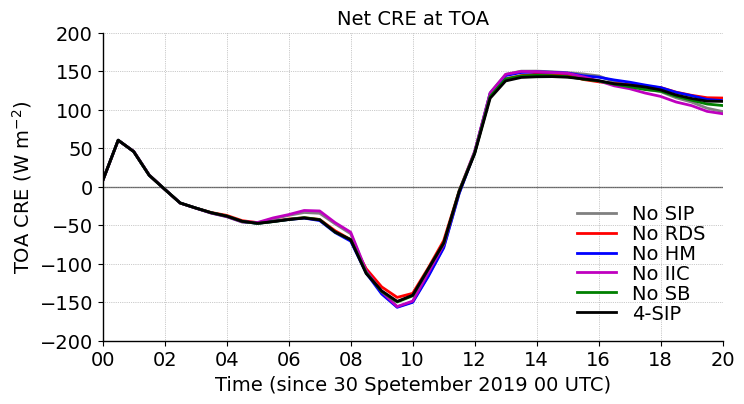

In [25]:
plt.figure(figsize=(8, 4))

lnwdth=2
fontsize=14

plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, toa_net_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, toa_net_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, toa_net_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, toa_net_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, toa_net_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, toa_net_cre_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#+4, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(-200, 200)
plt.yticks(fontsize=fontsize)
plt.ylabel('TOA CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Net CRE at TOA', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)
plt.show()


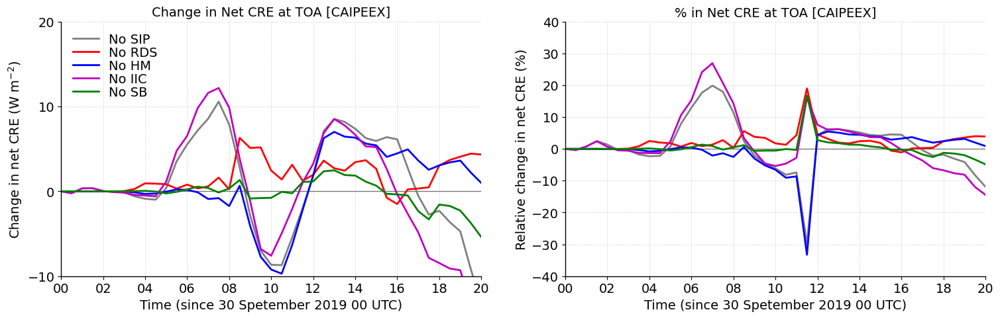

In [27]:
plt.figure(figsize=(18, 5))

lnwdth=2
fontsize=14

plt.subplot(1,2,1)

plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, del_toa_net_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, del_toa_net_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, del_toa_net_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, del_toa_net_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, del_toa_net_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(-10,20)
plt.yticks([-10, 0, 10, 20], fontsize=fontsize)
plt.ylabel('Change in net CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Change in Net CRE at TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.6)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)


plt.subplot(1,2,2)

plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, per_del_toa_net_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, per_del_toa_net_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, per_del_toa_net_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, per_del_toa_net_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, per_del_toa_net_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(-40,40)
plt.yticks([-40, -30, -20, -10, 0, 10, 20, 30, 40], fontsize=fontsize)
plt.ylabel('Relative change in net CRE (%)', fontsize=fontsize)#, fontweight='bold')
plt.title('% in Net CRE at TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.6)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1)
plt.gca().spines['bottom'].set_linewidth(1)

plt.show()


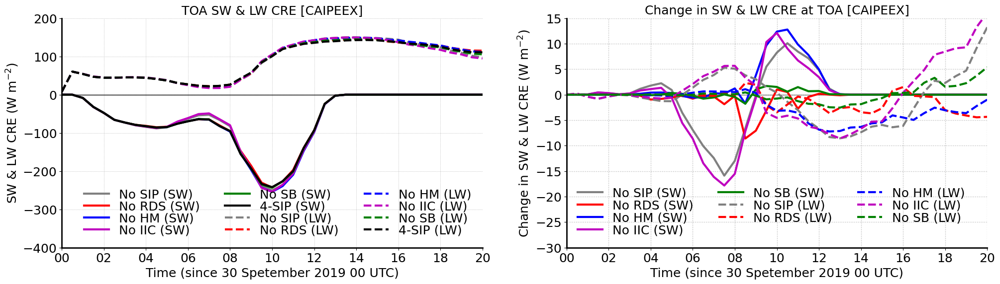

In [28]:


plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, toa_sw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP (SW)')
plt.plot(ds_norf.time, toa_sw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS (SW)')
plt.plot(ds_nohm.time, toa_sw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM (SW)')
plt.plot(ds_nobr.time, toa_sw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC (SW)')
plt.plot(ds_nosb.time, toa_sw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB (SW)')
plt.plot(ds_4sip.time, toa_sw_cre_4sip, 'k-', linewidth=lnwdth, label='4-SIP (SW)')

plt.plot(ds_nosip.time, toa_lw_cre_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP (LW)')
plt.plot(ds_norf.time, toa_lw_cre_norf, 'r--', linewidth=lnwdth, label='No RDS (LW)')
plt.plot(ds_nohm.time, toa_lw_cre_nohm, 'b--', linewidth=lnwdth, label='No HM (LW)')
plt.plot(ds_nobr.time, toa_lw_cre_nobr, 'm--', linewidth=lnwdth, label='No IIC (LW)')
plt.plot(ds_nosb.time, toa_lw_cre_nosb, 'g--', linewidth=lnwdth, label='No SB (LW)')
plt.plot(ds_4sip.time, toa_lw_cre_4sip, 'k--', linewidth=lnwdth, label='4-SIP (LW)')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.ylim(-400,200)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('SW & LW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('TOA SW & LW CRE [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.01, ncols=3, fontsize=fontsize, loc='lower right')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, del_toa_sw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP (SW)')
plt.plot(ds_norf.time, del_toa_sw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS (SW)')
plt.plot(ds_nohm.time, del_toa_sw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM (SW)')
plt.plot(ds_nobr.time, del_toa_sw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC (SW)')
plt.plot(ds_nosb.time, del_toa_sw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB (SW)')

plt.plot(ds_nosip.time, del_toa_lw_cre_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP (LW)')
plt.plot(ds_norf.time, del_toa_lw_cre_norf, 'r--', linewidth=lnwdth, label='No RDS (LW)')
plt.plot(ds_nohm.time, del_toa_lw_cre_nohm, 'b--', linewidth=lnwdth, label='No HM (LW)')
plt.plot(ds_nobr.time, del_toa_lw_cre_nobr, 'm--', linewidth=lnwdth, label='No IIC (LW)')
plt.plot(ds_nosb.time, del_toa_lw_cre_nosb, 'g--', linewidth=lnwdth, label='No SB (LW)')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.ylim(-30, 15)
#plt.yticks([-8, -6, -4, -2, 0, 2, 4, 6, 8], fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.ylabel('Change in SW & LW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Change in SW & LW CRE at TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, ncols=3, loc='best')

plt.grid(True, linestyle=':', linewidth=1, color='grey',alpha=0.6)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.show()


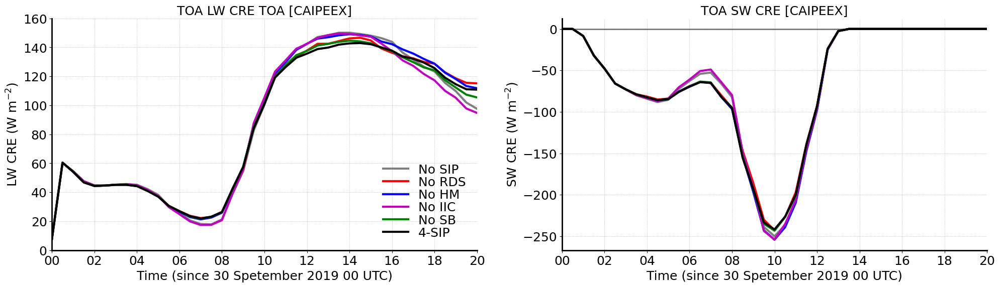

In [29]:


plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, toa_lw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, toa_lw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, toa_lw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, toa_lw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, toa_lw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, toa_lw_cre_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(0,160)
plt.yticks(fontsize=fontsize)
plt.ylabel('LW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('TOA LW CRE TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, toa_sw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, toa_sw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, toa_sw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, toa_sw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, toa_sw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time, toa_sw_cre_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(-200,20)
plt.yticks(fontsize=fontsize)
plt.ylabel('SW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('TOA SW CRE [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()


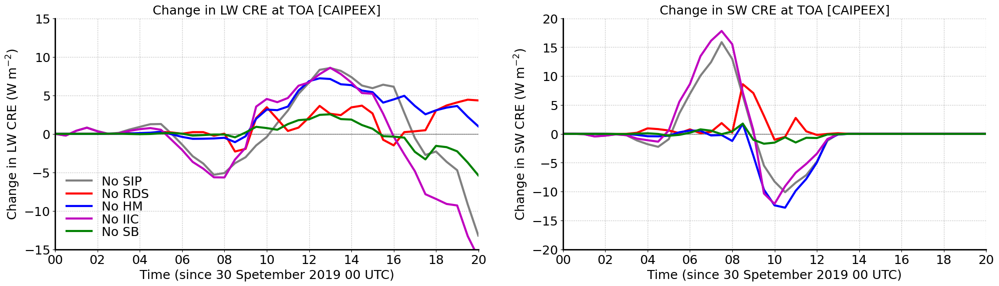

In [32]:

plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, del_toa_lw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, del_toa_lw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, del_toa_lw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, del_toa_lw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, del_toa_lw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(-15, 15)
plt.yticks([-15, -10, -5, 0, 5, 10, 15], fontsize=fontsize)
plt.ylabel('Change in LW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Change in LW CRE at TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower left')

plt.grid(True, linestyle=':', linewidth=1, color='grey',alpha=0.6)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=1, alpha=0.5)

plt.plot(ds_nosip.time, del_toa_sw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, del_toa_sw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, del_toa_sw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, del_toa_sw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, del_toa_sw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
plt.ylim(-20,20)
plt.yticks([-20, -15, -10, -5, 0, 5, 10, 15, 20], fontsize=fontsize)
plt.ylabel('Change in SW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('Change in SW CRE at TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')

#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower left')

plt.grid(True, linestyle=':', linewidth=1, color='grey',alpha=0.6)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()

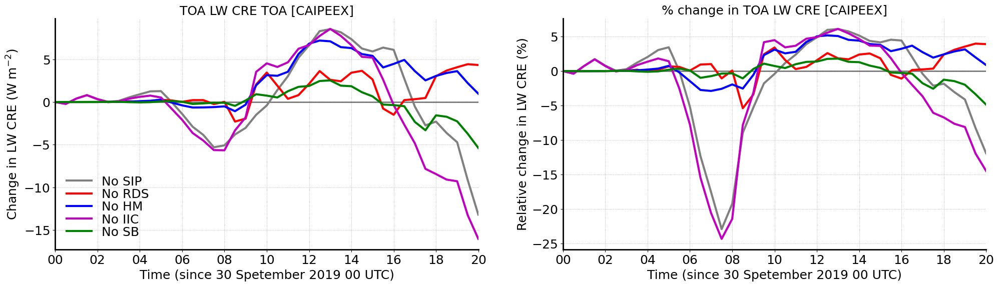

In [33]:


plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, del_toa_lw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, del_toa_lw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, del_toa_lw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, del_toa_lw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, del_toa_lw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(-12,6)
plt.yticks(fontsize=fontsize)
plt.ylabel('Change in LW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('TOA LW CRE TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, per_del_toa_lw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, per_del_toa_lw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, per_del_toa_lw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, per_del_toa_lw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, per_del_toa_lw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(-15,10)
plt.yticks(fontsize=fontsize)
plt.ylabel('Relative change in LW CRE (%)', fontsize=fontsize)#, fontweight='bold')
plt.title('% change in TOA LW CRE [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()


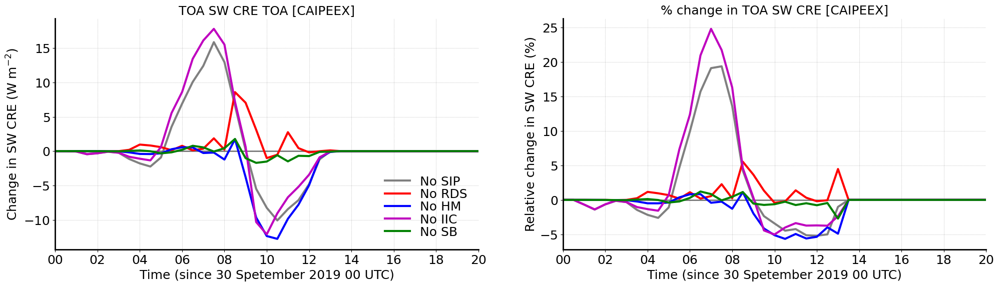

In [34]:


plt.figure(figsize=(24, 6))

lnwdth=3
fontsize=18

plt.subplot(1,2,1)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, del_toa_sw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, del_toa_sw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, del_toa_sw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, del_toa_sw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, del_toa_sw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(-10,12)
plt.yticks(fontsize=fontsize)
plt.ylabel('Change in SW CRE (W m$^{-2}$)', fontsize=fontsize)#, fontweight='bold')
plt.title('TOA SW CRE TOA [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt.axhline(y=0, color='k', linestyle='-', linewidth=2, alpha=0.5)

plt.plot(ds_nosip.time, per_del_toa_sw_cre_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time, per_del_toa_sw_cre_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt.plot(ds_nohm.time, per_del_toa_sw_cre_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time, per_del_toa_sw_cre_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time, per_del_toa_sw_cre_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlabel('Time (since 30 Spetember 2019 00 UTC)', fontsize=fontsize)#, fontweight='bold')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
start_date = datetime(2019, 9, 30, 0, 0) 
end_date = datetime(2019, 9, 30, 20, 0)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fontsize)
#plt.ylim(-10,10)
plt.yticks(fontsize=fontsize)
plt.ylabel('Relative change in SW CRE (%)', fontsize=fontsize)#, fontweight='bold')
plt.title('% change in TOA SW CRE [CAIPEEX]', fontsize=fontsize)#, fontweight='bold')
#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey',alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()


## Radiative Heating Rates

In [48]:


#mean_ht_nosip = 1.e-3*ds_nosip.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nosip = ds_nosip.tempc.mean(dim=('time','ncells'))

#mean_ht_4sip = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
#mean_tempc_4sip = ds_4sip.tempc.mean(dim=('time','ncells'))

#mean_ht_norf = 1.e-3*ds_norf.z_mc.mean(dim=('time','ncells'))
#mean_tempc_norf = ds_norf.tempc.mean(dim=('time','ncells'))

#mean_ht_nohm = 1.e-3*ds_nohm.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nohm = ds_nohm.tempc.mean(dim=('time','ncells'))

#mean_ht_nobr = 1.e-3*ds_nobr.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nobr = ds_nobr.tempc.mean(dim=('time','ncells'))

#mean_ht_nosb = 1.e-3*ds_nosb.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nosb = ds_nosb.tempc.mean(dim=('time','ncells'))

w_thres = 2.
# LW/SW heating rate with No SIP
mean_lwr_kperd_nosip = 86400.*ds_nosip.ddt_temp_radlw.mean(dim=('time','ncells'))
mean_swr_kperd_nosip = 86400.*ds_nosip.ddt_temp_radsw.mean(dim=('time','ncells'))
mean_tot_rad_kperd_nosip = mean_lwr_kperd_nosip + mean_swr_kperd_nosip

# LW/SW heating rate with 4 SIP
mean_lwr_kperd_4sip = 86400.*ds_4sip.ddt_temp_radlw.mean(dim=('time','ncells'))
mean_swr_kperd_4sip = 86400.*ds_4sip.ddt_temp_radsw.mean(dim=('time','ncells'))
mean_tot_rad_kperd_4sip = mean_lwr_kperd_4sip + mean_swr_kperd_4sip

# LW/SW heating rate with No RF
mean_lwr_kperd_norf = 86400.*ds_norf.ddt_temp_radlw.mean(dim=('time','ncells'))
mean_swr_kperd_norf = 86400.*ds_norf.ddt_temp_radsw.mean(dim=('time','ncells'))
mean_tot_rad_kperd_norf = mean_lwr_kperd_norf + mean_swr_kperd_norf

# LW/SW heating rate with No HM
mean_lwr_kperd_nohm = 86400.*ds_nohm.ddt_temp_radlw.mean(dim=('time','ncells'))
mean_swr_kperd_nohm = 86400.*ds_nohm.ddt_temp_radsw.mean(dim=('time','ncells'))
mean_tot_rad_kperd_nohm = mean_lwr_kperd_nohm + mean_swr_kperd_nohm

# LW/SW heating rate with No IIC
mean_lwr_kperd_nobr = 86400.*ds_nobr.ddt_temp_radlw.mean(dim=('time','ncells'))
mean_swr_kperd_nobr = 86400.*ds_nobr.ddt_temp_radsw.mean(dim=('time','ncells'))
mean_tot_rad_kperd_nobr = mean_lwr_kperd_nobr + mean_swr_kperd_nobr

# LW/SW heating rate with No SB
mean_lwr_kperd_nosb = 86400.*ds_nosb.ddt_temp_radlw.mean(dim=('time','ncells'))
mean_swr_kperd_nosb = 86400.*ds_nosb.ddt_temp_radsw.mean(dim=('time','ncells'))
mean_tot_rad_kperd_nosb = mean_lwr_kperd_nosb + mean_swr_kperd_nosb

# Change in tot rad. heating w.r.t. control
del_tot_rad_kperd_norf = mean_tot_rad_kperd_4sip-mean_tot_rad_kperd_norf
del_tot_rad_kperd_nohm = mean_tot_rad_kperd_4sip-mean_tot_rad_kperd_nohm
del_tot_rad_kperd_nobr = mean_tot_rad_kperd_4sip-mean_tot_rad_kperd_nobr
del_tot_rad_kperd_nosb = mean_tot_rad_kperd_4sip-mean_tot_rad_kperd_nosb
del_tot_rad_kperd_nosip = mean_tot_rad_kperd_4sip-mean_tot_rad_kperd_nosip

# Change in LW rad. heating w.r.t. control
del_lwr_kperd_norf = mean_lwr_kperd_4sip-mean_lwr_kperd_norf
del_lwr_kperd_nohm = mean_lwr_kperd_4sip-mean_lwr_kperd_nohm
del_lwr_kperd_nobr = mean_lwr_kperd_4sip-mean_lwr_kperd_nobr
del_lwr_kperd_nosb = mean_lwr_kperd_4sip-mean_lwr_kperd_nosb
del_lwr_kperd_nosip = mean_lwr_kperd_4sip-mean_lwr_kperd_nosip

# Change in SW rad. heating w.r.t. control
del_swr_kperd_norf = mean_swr_kperd_4sip-mean_swr_kperd_norf
del_swr_kperd_nohm = mean_swr_kperd_4sip-mean_swr_kperd_nohm
del_swr_kperd_nobr = mean_swr_kperd_4sip-mean_swr_kperd_nobr
del_swr_kperd_nosb = mean_swr_kperd_4sip-mean_swr_kperd_nosb
del_swr_kperd_nosip = mean_swr_kperd_4sip-mean_swr_kperd_nosip

mean_tot_rad_kperd_nosip = mean_tot_rad_kperd_nosip.where(mean_tempc_nosip > -70)
mean_tot_rad_kperd_4sip = mean_tot_rad_kperd_4sip.where(mean_tempc_4sip > -70)
mean_tot_rad_kperd_norf = mean_tot_rad_kperd_norf.where(mean_tempc_norf > -70)
mean_tot_rad_kperd_nohm = mean_tot_rad_kperd_nohm.where(mean_tempc_nohm > -70)
mean_tot_rad_kperd_nobr = mean_tot_rad_kperd_nobr.where(mean_tempc_nobr > -70)
mean_tot_rad_kperd_nosb = mean_tot_rad_kperd_nosb.where(mean_tempc_nosb > -70)


In [49]:
# xarrays takes longer time to plot, convert them to numpy instead

variables = [mean_tot_rad_kperd_nosip, mean_tot_rad_kperd_4sip, mean_tot_rad_kperd_norf, mean_tot_rad_kperd_nohm, 
             mean_tot_rad_kperd_nobr, mean_tot_rad_kperd_nosb]
numpy_variables = [var.values for var in variables]

mean_tot_rad_kperd_nosip = numpy_variables[0]
mean_tot_rad_kperd_4sip = numpy_variables[1]
mean_tot_rad_kperd_norf = numpy_variables[2]
mean_tot_rad_kperd_nohm = numpy_variables[3]
mean_tot_rad_kperd_nobr = numpy_variables[4]
mean_tot_rad_kperd_nosb = numpy_variables[5]


In [37]:
variables = [mean_lwr_kperd_nosip, mean_lwr_kperd_4sip, mean_lwr_kperd_norf, mean_lwr_kperd_nohm, 
             mean_lwr_kperd_nobr, mean_lwr_kperd_nosb]
numpy_variables = [var.values for var in variables]

mean_lwr_kperd_nosip = numpy_variables[0]
mean_lwr_kperd_4sip = numpy_variables[1]
mean_lwr_kperd_norf = numpy_variables[2]
mean_lwr_kperd_nohm = numpy_variables[3]
mean_lwr_kperd_nobr = numpy_variables[4]
mean_lwr_kperd_nosb = numpy_variables[5]

variables = [mean_swr_kperd_nosip, mean_swr_kperd_4sip, mean_swr_kperd_norf, mean_swr_kperd_nohm, 
             mean_swr_kperd_nobr, mean_swr_kperd_nosb]
numpy_variables = [var.values for var in variables]

mean_swr_kperd_nosip = numpy_variables[0]
mean_swr_kperd_4sip = numpy_variables[1]
mean_swr_kperd_norf = numpy_variables[2]
mean_swr_kperd_nohm = numpy_variables[3]
mean_swr_kperd_nobr = numpy_variables[4]
mean_swr_kperd_nosb = numpy_variables[5]

In [20]:
mean_tot_rad_kperd_nosip

array([ 3.0731630e-01,            nan,            nan,            nan,
                  nan,            nan,  4.5168361e-01,  6.3938564e-01,
        8.3761001e-01,  9.3306684e-01,  9.9193084e-01,  9.0771151e-01,
        7.1301144e-01,  3.9487171e-01, -1.4104843e-02, -2.7762985e-01,
       -4.6414363e-01, -5.7777584e-01, -6.0831380e-01, -6.4950335e-01,
       -6.2091780e-01, -6.0579526e-01, -5.5618286e-01, -5.3594506e-01,
       -5.1290810e-01, -4.6663141e-01, -4.2008066e-01, -4.1251147e-01,
       -4.3897378e-01, -4.7222352e-01, -3.2439590e-01, -3.6341929e-01,
       -2.9180193e-01, -3.3737242e-01, -4.2290223e-01, -5.4395986e-01,
       -5.4374552e-01, -4.1136241e-01, -4.4602919e-01, -4.7955275e-01,
       -5.5144036e-01, -6.3185298e-01, -8.1128824e-01, -9.9921274e-01,
       -1.1415999e+00, -1.2470275e+00, -1.2065197e+00, -1.0790690e+00,
       -9.1043377e-01, -7.2613108e-01, -6.1161709e-01, -5.5607808e-01,
       -5.6082702e-01, -6.0279644e-01, -6.8303752e-01, -7.4806261e-01,
      

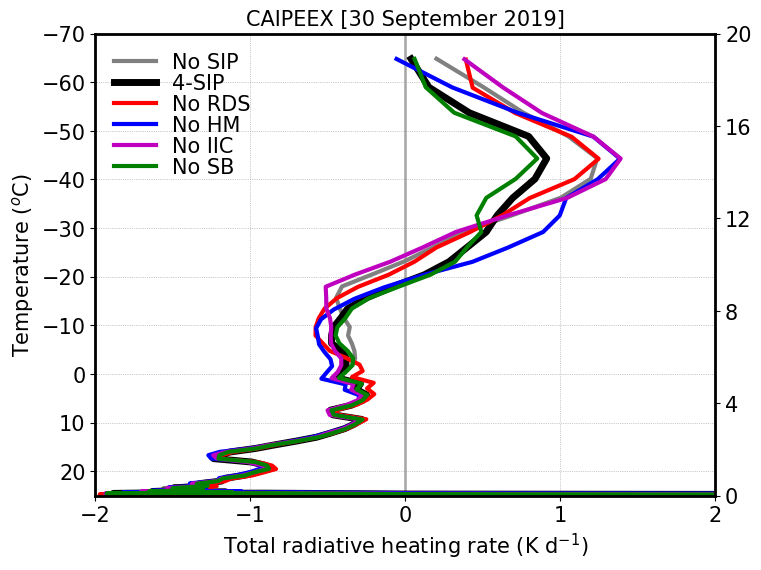

In [50]:
fontsize=15; lnwdth=3; alpha=0.6;

plt.figure(figsize=(8, 6)) 

plt1=plt.gca() 
plt2=plt1.twinx() 

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6) 

plt1.plot(mean_tot_rad_kperd_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP') 
plt1.plot(mean_tot_rad_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth+2, label='4-SIP') 
plt1.plot(mean_tot_rad_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS') 
plt1.plot(mean_tot_rad_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM') 
plt1.plot(mean_tot_rad_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC') 
plt1.plot(mean_tot_rad_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(mean_tot_rad_kperd_nosb, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(-2, 2) 
plt1.set_ylim(25, -70) 
plt2.set_ylim(0.5, 20)

plt1.set_xticks([-2, -1, 0, 1, 2]) 
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70]) 
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize) 
plt1.tick_params(axis='y', labelsize=fontsize) 
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total radiative heating rate (K d$^{-1}$)', fontsize=fontsize) 
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.legend() 
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [30 September 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1) 
plt1.spines['right'].set_linewidth(1) 
plt1.spines['left'].set_linewidth(1) 
plt1.spines['bottom'].set_linewidth(1) 
plt.show()

#### The above plot should be the other way round, cooling at the top and warming in the middle levels

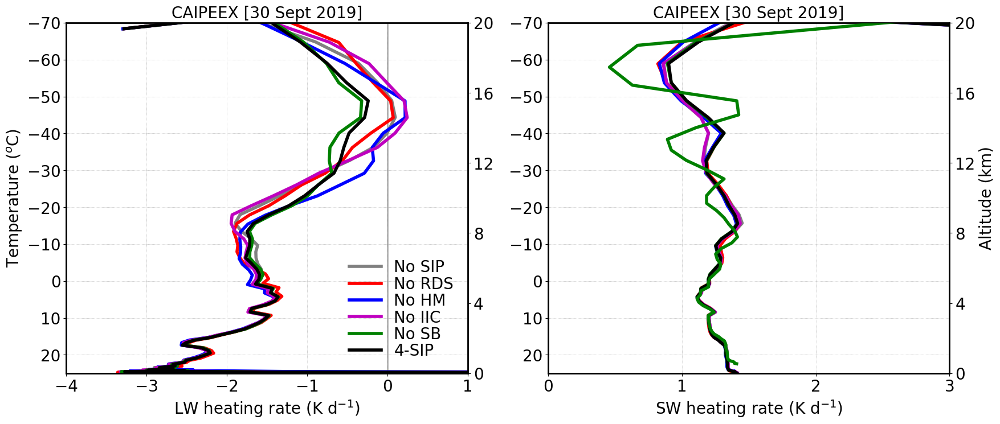

In [51]:

fontsize=20;
lnwdth=4;
alpha=0.8;

plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_lwr_kperd_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_lwr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_lwr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_lwr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_lwr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_lwr_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt2.plot(mean_lwr_kperd_nosb, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.set_xlim(-4., 1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([-4, -3, -2, -1, 0, 1])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt1.set_xlabel('LW heating rate (K d$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
#plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
#plt2.spines['top'].set_visible(False)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.subplot(1,2,2)
plt1 = plt.gca()
plt2 = plt1.twinx()

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_swr_kperd_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_swr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_swr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_swr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_swr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_swr_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt2.plot(mean_swr_kperd_nosb, mean_ht_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(0, 3)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([0, 1, 2, 3])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper right')

plt1.set_xlabel('SW heating rate (K d$^{-1}$)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
#plt2.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.show()


## Vertical velocity
### Change in updrafts and downdrafts

In [73]:
thres_q = 0.
#mean_ht_nosip = 1.e-3*ds_nosip.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nosip = ds_nosip.tempc.mean(dim=('time','ncells'))

#mean_ht_4sip = 1.e-3*ds_4sip.z_mc.mean(dim=('time','ncells'))
#mean_tempc_4sip = ds_4sip.tempc.mean(dim=('time','ncells'))

#mean_ht_norf = 1.e-3*ds_norf.z_mc.mean(dim=('time','ncells'))
#mean_tempc_norf = ds_norf.tempc.mean(dim=('time','ncells'))

#mean_ht_nohm = 1.e-3*ds_nohm.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nohm = ds_nohm.tempc.mean(dim=('time','ncells'))

#mean_ht_nobr = 1.e-3*ds_nobr.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nobr = ds_nobr.tempc.mean(dim=('time','ncells'))

#mean_ht_nosb = 1.e-3*ds_nosb.z_mc.mean(dim=('time','ncells'))
#mean_tempc_nosb = ds_nosb.tempc.mean(dim=('time','ncells'))

#mean_tot_w_nosip = ds_nosip.w_vel.where(abs(ds_nosip.w_vel) > 0.).mean(dim=('time','ncells'))
#mean_tot_w_4sip = ds_4sip.w_vel.where(abs(ds_4sip.w_vel) > 0.).mean(dim=('time','ncells'))
#mean_tot_w_norf = ds_norf.w_vel.where(abs(ds_norf.w_vel) > 0.).mean(dim=('time','ncells'))
#mean_tot_w_nohm = ds_nohm.w_vel.where(abs(ds_nohm.w_vel) > 0.).mean(dim=('time','ncells'))
#mean_tot_w_nobr = ds_nobr.w_vel.where(abs(ds_nobr.w_vel) > 0.).mean(dim=('time','ncells'))
#mean_tot_w_nosb = ds_nosb.w_vel.where(abs(ds_nosb.w_vel) > 0.).mean(dim=('time','ncells'))

#mean_tot_w_nosip = ds_nosip.w_vel.mean(dim=('time','ncells'))
#mean_tot_w_4sip = ds_4sip.w_vel.mean(dim=('time','ncells'))
#mean_tot_w_norf = ds_norf.w_vel.mean(dim=('time','ncells'))
#mean_tot_w_nohm = ds_nohm.w_vel.mean(dim=('time','ncells'))
#mean_tot_w_nobr = ds_nobr.w_vel.mean(dim=('time','ncells'))
#mean_tot_w_nosb = ds_nosb.w_vel.mean(dim=('time','ncells'))

mean_tot_w_nosip = xr.where(ds_nosip.tqi > thres_q, ds_nosip.w_vel, np.nan).mean(dim=('time','ncells'))
mean_tot_w_4sip = xr.where(ds_4sip.tqi > thres_q, ds_4sip.w_vel, np.nan).mean(dim=('time','ncells'))
mean_tot_w_norf = xr.where(ds_norf.tqi > thres_q, ds_norf.w_vel, np.nan).mean(dim=('time','ncells'))
mean_tot_w_nohm = xr.where(ds_nohm.tqi > thres_q, ds_nohm.w_vel, np.nan).mean(dim=('time','ncells'))
mean_tot_w_nobr = xr.where(ds_nobr.tqi > thres_q, ds_nobr.w_vel, np.nan).mean(dim=('time','ncells'))
mean_tot_w_nosb = xr.where(ds_nosb.tqi > thres_q, ds_nosb.w_vel, np.nan).mean(dim=('time','ncells'))

del_tot_w_nosip = mean_tot_w_4sip - mean_tot_w_nosip
del_tot_w_norf = mean_tot_w_4sip - mean_tot_w_norf
del_tot_w_nohm = mean_tot_w_4sip - mean_tot_w_nohm
del_tot_w_nobr = mean_tot_w_4sip - mean_tot_w_nobr
del_tot_w_nosb = mean_tot_w_4sip - mean_tot_w_nosb

#mean_tot_w_nosip = mean_tot_w_nosip.where(mean_tempc_nosip > -70)
#mean_tot_w_4sip = mean_tot_w_4sip.where(mean_tempc_4sip > -70)
#mean_tot_w_norf = mean_tot_w_norf.where(mean_tempc_norf > -70)
#mean_tot_w_nohm = mean_tot_w_nohm.where(mean_tempc_nohm > -70)
#mean_tot_w_nobr = mean_tot_w_nobr.where(mean_tempc_nobr > -70)
#mean_tot_w_nosb = mean_tot_w_nosb.where(mean_tempc_nosb > -70)

#del_tot_w_nosip = del_tot_w_nosip.where(mean_tempc_nosip > -70)
#del_tot_w_norf = del_tot_w_norf.where(mean_tempc_norf > -70)
#del_tot_w_nohm = del_tot_w_nohm.where(mean_tempc_nohm > -70)
#del_tot_w_nobr = del_tot_w_nobr.where(mean_tempc_nobr > -70)
#del_tot_w_nosb = del_tot_w_nosb.where(mean_tempc_nosb > -70)



In [74]:
# xarrays takes longer time to plot, convert them to numpy instead

variables = [mean_tot_w_nosip, mean_tot_w_4sip, mean_tot_w_norf, mean_tot_w_nohm, mean_tot_w_nobr, mean_tot_w_nosb]
numpy_variables = [var.values for var in variables]

mean_tot_w_nosip = numpy_variables[0]
mean_tot_w_4sip = numpy_variables[1]
mean_tot_w_norf = numpy_variables[2]
mean_tot_w_nohm = numpy_variables[3]
mean_tot_w_nobr = numpy_variables[4]
mean_tot_w_nosb = numpy_variables[5]


In [75]:

del_tot_w_nosip = mean_tot_w_4sip-mean_tot_w_nosip 
del_tot_w_norf = mean_tot_w_4sip-mean_tot_w_norf 
del_tot_w_nohm = mean_tot_w_4sip-mean_tot_w_nohm 
del_tot_w_nobr = mean_tot_w_4sip-mean_tot_w_nobr 
del_tot_w_nosb = mean_tot_w_4sip-mean_tot_w_nosb 

per_del_tot_w_nosip = 100*del_tot_w_nosip/mean_tot_w_4sip
per_del_tot_w_norf = 100*del_tot_w_norf/mean_tot_w_4sip
per_del_tot_w_nohm = 100*del_tot_w_nohm/mean_tot_w_4sip
per_del_tot_w_nobr = 100*del_tot_w_nobr/mean_tot_w_4sip
per_del_tot_w_nosb = 100*del_tot_w_nosb/mean_tot_w_4sip


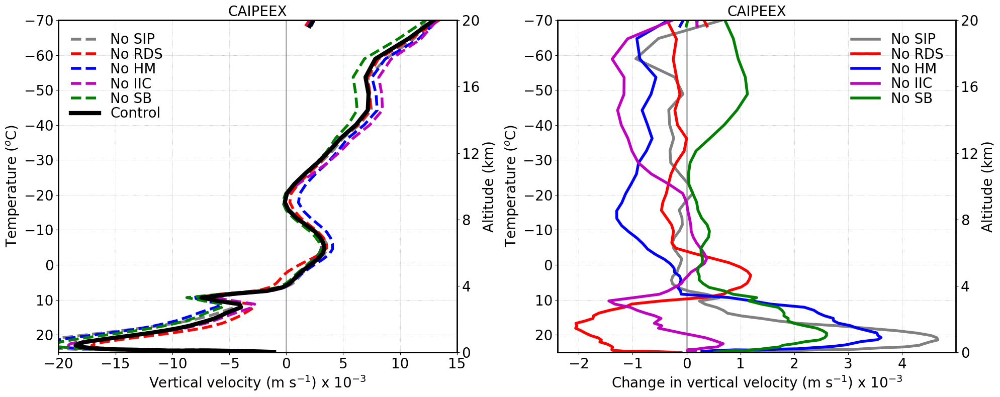

In [80]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.e3
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_w_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_w_norf*fact, mean_tempc_norf, 'r--', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_w_nohm*fact, mean_tempc_nohm, 'b--', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_w_nobr*fact, mean_tempc_nobr, 'm--', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_w_nosb*fact, mean_tempc_nosb, 'g--', linewidth=lnwdth, label='No SB')
plt1.plot(mean_tot_w_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth+2, label='Control')

plt2.plot(mean_tot_w_nosb*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(-20, 15)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([0, 2, 4, 6, 8, 10, 12, 14, 16, 18])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Vertical velocity (m s$^{-1}$) x 10$^{-3}$', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.e3

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(del_tot_w_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(del_tot_w_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(del_tot_w_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(del_tot_w_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(del_tot_w_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(del_tot_w_nosb*fact, mean_ht_nobr, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

#plt1.set_xlim(-6, 2)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-2, -1, 0, 1, 2])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Change in vertical velocity (m s$^{-1}$) x 10$^{-3}$', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.tight_layout()
plt.show()


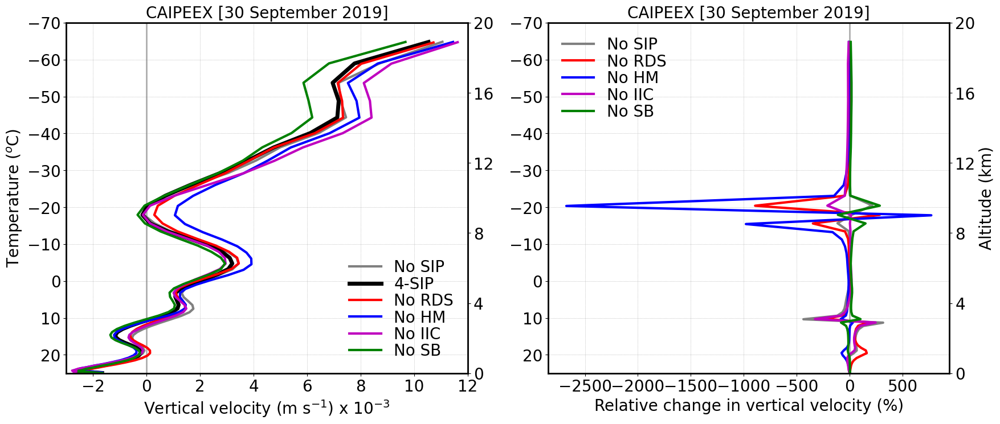

In [70]:


fontsize=20;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.e3
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_w_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_w_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth+2, label='4-SIP')
plt1.plot(mean_tot_w_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_w_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_w_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_w_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(mean_tot_w_nosb*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(-3, 12)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([0, 2, 4, 6, 8, 10, 12, 14, 16, 18])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Vertical velocity (m s$^{-1}$) x 10$^{-3}$', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX [30 September 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(per_del_tot_w_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(per_del_tot_w_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(per_del_tot_w_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(per_del_tot_w_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(per_del_tot_w_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(per_del_tot_w_nosb*fact, mean_ht_nobr, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

#plt1.set_xlim(-80, 20)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-80, -60, -40, -20, 0, 20])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Relative change in vertical velocity (%)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [30 September 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


## Cloud cover

In [21]:

mean_tot_cld_cover_nosip = ds_nosip.clc.where(ds_nosip.tq > 0.).mean(dim=('time','ncells'))
mean_tot_cld_cover_4sip = ds_4sip.clc.where(ds_4sip.tq > 0.).mean(dim=('time','ncells'))
mean_tot_cld_cover_norf = ds_norf.clc.where(ds_norf.tq > 0.).mean(dim=('time','ncells'))
mean_tot_cld_cover_nohm = ds_nohm.clc.where(ds_nohm.tq > 0.).mean(dim=('time','ncells'))
mean_tot_cld_cover_nobr = ds_nobr.clc.where(ds_nobr.tq > 0.).mean(dim=('time','ncells'))
mean_tot_cld_cover_nosb = ds_nosb.clc.where(ds_nosb.tq > 0.).mean(dim=('time','ncells'))


In [22]:
# xarrays takes longer time to plot, convert them to numpy instead

variables = [mean_tot_cld_cover_nosip, mean_tot_cld_cover_4sip, mean_tot_cld_cover_norf, mean_tot_cld_cover_nohm, 
             mean_tot_cld_cover_nobr, mean_tot_cld_cover_nosb]
numpy_variables = [var.values for var in variables]

mean_tot_cld_cover_nosip = numpy_variables[0]
mean_tot_cld_cover_4sip = numpy_variables[1]
mean_tot_cld_cover_norf = numpy_variables[2]
mean_tot_cld_cover_nohm = numpy_variables[3]
mean_tot_cld_cover_nobr = numpy_variables[4]
mean_tot_cld_cover_nosb = numpy_variables[5]


In [24]:

del_tot_cld_cover_nosip = mean_tot_cld_cover_4sip-mean_tot_cld_cover_nosip 
del_tot_cld_cover_norf = mean_tot_cld_cover_4sip-mean_tot_cld_cover_norf 
del_tot_cld_cover_nohm = mean_tot_cld_cover_4sip-mean_tot_cld_cover_nohm 
del_tot_cld_cover_nobr = mean_tot_cld_cover_4sip-mean_tot_cld_cover_nobr 
del_tot_cld_cover_nosb = mean_tot_cld_cover_4sip-mean_tot_cld_cover_nosb 

per_del_tot_cld_cover_nosip = 100*del_tot_cld_cover_nosip/mean_tot_cld_cover_4sip
per_del_tot_cld_cover_norf = 100*del_tot_cld_cover_norf/mean_tot_cld_cover_4sip
per_del_tot_cld_cover_nohm = 100*del_tot_cld_cover_nohm/mean_tot_cld_cover_4sip
per_del_tot_cld_cover_nobr = 100*del_tot_cld_cover_nobr/mean_tot_cld_cover_4sip
per_del_tot_cld_cover_nosb = 100*del_tot_cld_cover_nosb/mean_tot_cld_cover_4sip


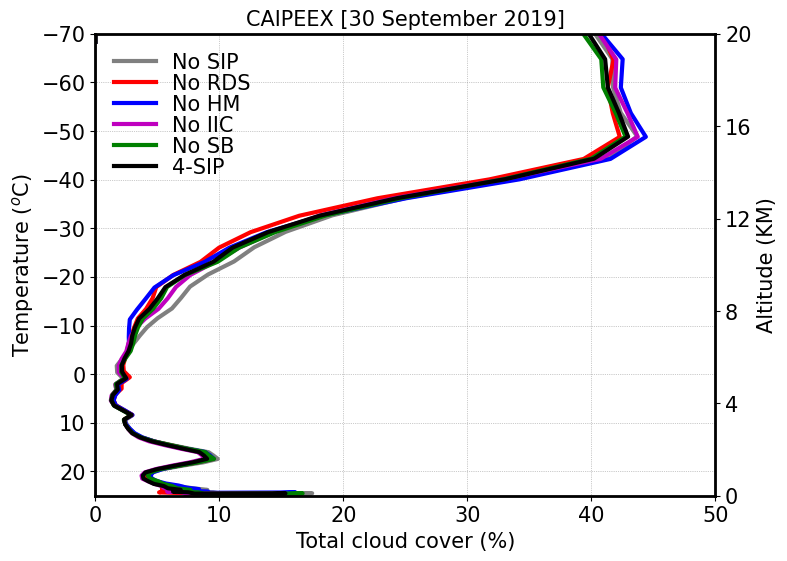

In [28]:
fontsize=15; lnwdth=3; alpha=0.6;

plt.figure(figsize=(8, 6)) 

plt1=plt.gca() 
plt2=plt1.twinx() 

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6) 

plt1.plot(mean_tot_cld_cover_nosip, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP') 
plt1.plot(mean_tot_cld_cover_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS') 
plt1.plot(mean_tot_cld_cover_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM') 
plt1.plot(mean_tot_cld_cover_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC') 
plt1.plot(mean_tot_cld_cover_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_tot_cld_cover_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP') 

plt2.plot(mean_tot_cld_cover_4sip, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(0, 50) 
plt1.set_ylim(25, -70) 
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-2, -1, 0, 1, 2]) 
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70]) 
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize) 
plt1.tick_params(axis='y', labelsize=fontsize) 
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total cloud cover (%)', fontsize=fontsize) 
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (KM)', fontsize=fontsize)

plt1.legend() 
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [30 September 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2) 
plt1.spines['right'].set_linewidth(2) 
plt1.spines['left'].set_linewidth(2) 
plt1.spines['bottom'].set_linewidth(2) 
plt.show()

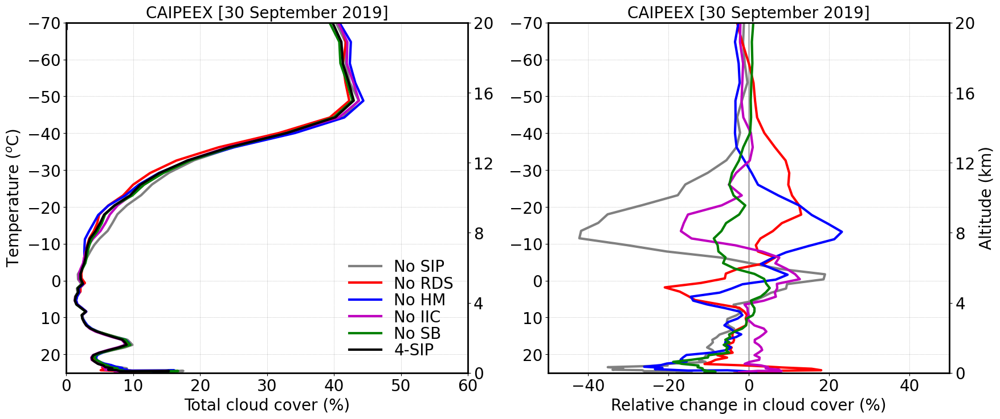

In [29]:


fontsize=20;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_cld_cover_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_cld_cover_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_cld_cover_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_cld_cover_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_cld_cover_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_tot_cld_cover_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt2.plot(mean_tot_w_nosb*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(0, 60)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([0, 10, 20, 30, 40, 50 ,60])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total cloud cover (%)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX [30 September 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(per_del_tot_cld_cover_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(per_del_tot_cld_cover_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(per_del_tot_cld_cover_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(per_del_tot_cld_cover_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(per_del_tot_cld_cover_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(per_del_tot_w_nosb*fact, mean_ht_nobr, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xlim(-50, 50)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([-80, -60, -40, -20, 0, 20])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Relative change in cloud cover (%)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [30 September 2019]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


### Surface rainfall

In [30]:
acc_precip_nosip = ds_nosip.tot_prec.mean('ncells')
acc_precip_4sip = ds_4sip.tot_prec.mean('ncells')
acc_precip_nohm = ds_nohm.tot_prec.mean('ncells')
acc_precip_nobr = ds_nobr.tot_prec.mean('ncells')
acc_precip_norf = ds_norf.tot_prec.mean('ncells')
acc_precip_nosb = ds_nosb.tot_prec.mean('ncells')

In [31]:
del_prec_nosip = ds_nosip.tot_prec.diff('time')
del_prec_4sip = ds_4sip.tot_prec.diff('time')
del_prec_norf = ds_norf.tot_prec.diff('time')
del_prec_nohm = ds_nohm.tot_prec.diff('time')
del_prec_nobr = ds_nobr.tot_prec.diff('time')
del_prec_nosb = ds_nosb.tot_prec.diff('time')

precip_rate_nosip = del_prec_nosip/0.5
precip_rate_4sip = del_prec_4sip/0.5
precip_rate_norf = del_prec_norf/0.5            # output is over 30 min
precip_rate_nohm = del_prec_nohm/0.5
precip_rate_nobr = del_prec_nobr/0.5
precip_rate_nosb = del_prec_nosb/0.5

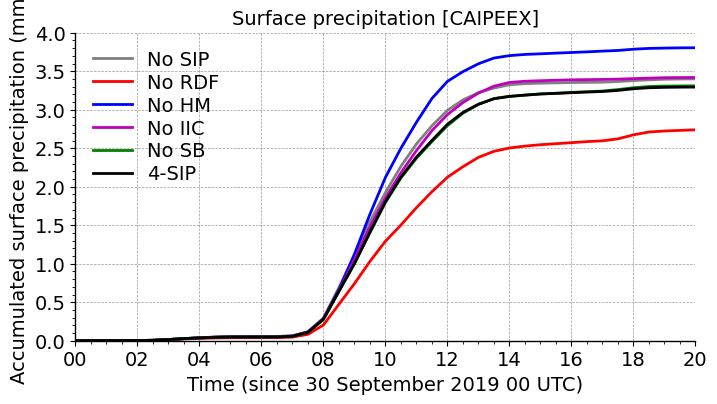

In [56]:
fontsize=14
linwdth = 2
plt.figure(figsize=(8, 4))

plt.plot(ds_nosip.time, acc_precip_nosip, "-", color='grey', label="No SIP", linewidth = linwdth)
plt.plot(ds_norf.time, acc_precip_norf, "r-", label="No RDF", linewidth = linwdth)
plt.plot(ds_nohm.time, acc_precip_nohm, "b-", label="No HM", linewidth = linwdth)
plt.plot(ds_nobr.time, acc_precip_nobr, "m-", label="No IIC", linewidth = linwdth)
plt.plot(ds_nosb.time, acc_precip_nosb, "g-", label="No SB", linewidth = linwdth)
plt.plot(ds_4sip.time, acc_precip_4sip, "k-", label="4-SIP", linewidth = linwdth)

plt.grid(True, linestyle='--', color='grey', linewidth=0.5, alpha=0.8)
plt.minorticks_on()
plt.ylim(0, 4)
plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fontsize)
plt.ylabel('Accumulated surface precipitation (mm)', fontsize=fontsize)
start_date = datetime(2019, 9, 30, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2019, 9, 30, 20, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.title('Surface precipitation [CAIPEEX]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.2, fontsize=fontsize, loc='upper left')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()

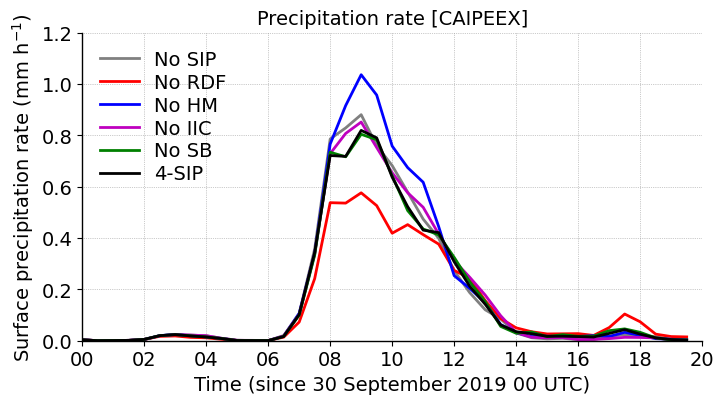

In [57]:
fontsize=14
linwdth = 2
plt.figure(figsize=(8, 4))

plt.plot(ds_nosip.time[:-1], precip_rate_nosip.mean('ncells'), '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time[:-1], precip_rate_norf.mean('ncells'), 'r-', linewidth=lnwdth, label='No RDF')
plt.plot(ds_nohm.time[:-1], precip_rate_nohm.mean('ncells'), 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time[:-1], precip_rate_nobr.mean('ncells'), 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time[:-1], precip_rate_nosb.mean('ncells'), 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time[:-1], precip_rate_4sip.mean('ncells'), 'k-', linewidth=lnwdth, label='4-SIP')

plt.ylim(0, 1.2)
plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fontsize)
plt.ylabel('Surface precipitation rate (mm h$^{-1}$)', fontsize=fontsize)
start_date = datetime(2019, 9, 30, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2019, 9, 30, 20, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.title('Precipitation rate [CAIPEEX]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.2, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()

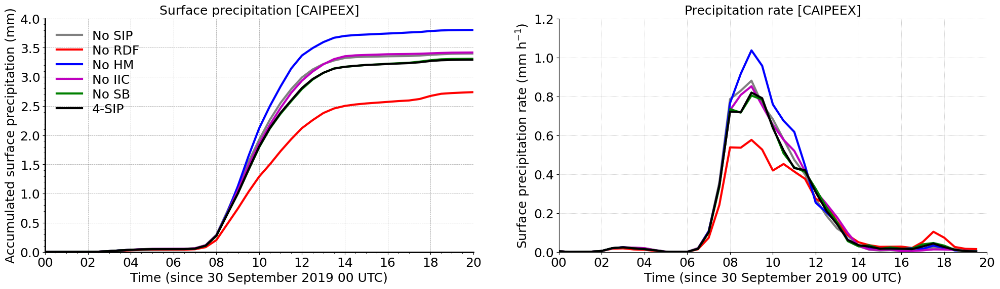

In [57]:


fontsize=18
linwdth = 3
plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
plt.plot(ds_nosip.time, acc_precip_nosip, "-", color='grey', label="No SIP", linewidth = linwdth)
plt.plot(ds_norf.time, acc_precip_norf, "r-", label="No RDF", linewidth = linwdth)
plt.plot(ds_nohm.time, acc_precip_nohm, "b-", label="No HM", linewidth = linwdth)
plt.plot(ds_nobr.time, acc_precip_nobr, "m-", label="No IIC", linewidth = linwdth)
plt.plot(ds_nosb.time, acc_precip_nosb, "g-", label="No SB", linewidth = linwdth)
plt.plot(ds_4sip.time, acc_precip_4sip, "k-", label="4-SIP", linewidth = linwdth)

plt.grid(True, linestyle='--', color='grey', linewidth=0.5, alpha=0.8)
plt.minorticks_on()
plt.ylim(0, 4)
plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fontsize)
plt.ylabel('Accumulated surface precipitation (mm)', fontsize=fontsize)
start_date = datetime(2019, 9, 30, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2019, 9, 30, 20, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.title('Surface precipitation [CAIPEEX]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.2, fontsize=fontsize, loc='upper left')#, ncol = 1, fontsize='16', bbox_to_anchor=(1.02, 1.02))
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(2)
plt.gca().spines['left'].set_linewidth(2)

plt.subplot(1,2,2)
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(ds_nosip.time[:-1], precip_rate_nosip.mean('ncells'), '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time[:-1], precip_rate_norf.mean('ncells'), 'r-', linewidth=lnwdth, label='No RDF')
plt.plot(ds_nohm.time[:-1], precip_rate_nohm.mean('ncells'), 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time[:-1], precip_rate_nobr.mean('ncells'), 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time[:-1], precip_rate_nosb.mean('ncells'), 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time[:-1], precip_rate_4sip.mean('ncells'), 'k-', linewidth=lnwdth, label='4-SIP')

plt.ylim(0, 1.2)
plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fontsize)
plt.ylabel('Surface precipitation rate (mm h$^{-1}$)', fontsize=fontsize)
start_date = datetime(2019, 9, 30, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2019, 9, 30, 20, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.title('Precipitation rate [CAIPEEX]', fontsize=fontsize)
#plt.legend()
#plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)
plt.show()


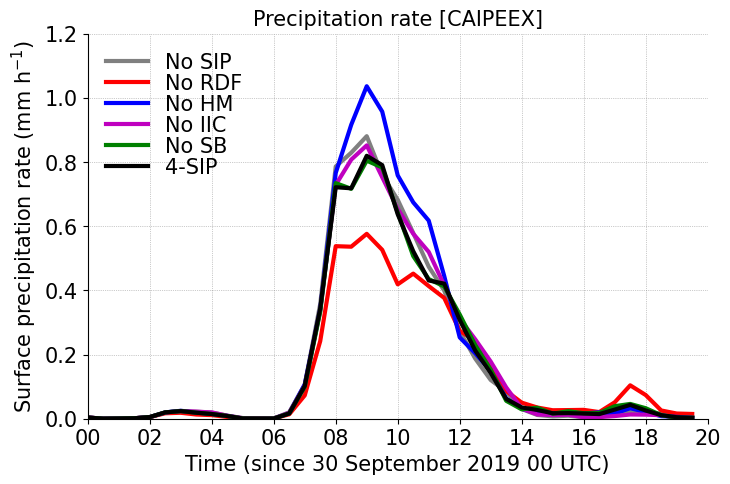

In [59]:
fontsize=15;
lnwdth=2;
alpha=0.6;

plt.figure(figsize=(8, 5))
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(ds_nosip.time[:-1], precip_rate_nosip.mean('ncells'), '-', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(ds_norf.time[:-1], precip_rate_norf.mean('ncells'), 'r-', linewidth=lnwdth, label='No RDF')
plt.plot(ds_nohm.time[:-1], precip_rate_nohm.mean('ncells'), 'b-', linewidth=lnwdth, label='No HM')
plt.plot(ds_nobr.time[:-1], precip_rate_nobr.mean('ncells'), 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(ds_nosb.time[:-1], precip_rate_nosb.mean('ncells'), 'g-', linewidth=lnwdth, label='No SB')
plt.plot(ds_4sip.time[:-1], precip_rate_4sip.mean('ncells'), 'k-', linewidth=lnwdth, label='4-SIP')

plt.ylim(0, 1.2)
plt.xlabel('Time (since 30 September 2019 00 UTC)', fontsize=fontsize)
plt.ylabel('Surface precipitation rate (mm h$^{-1}$)', fontsize=fontsize)
start_date = datetime(2019, 9, 30, 0, 0)  # Start at 00 UTC on 10 May 2011
end_date = datetime(2019, 9, 30, 20, 0)
plt.xlim(start_date, end_date)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H'))

plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.title('Precipitation rate [CAIPEEX]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)
plt.show()

## Ice number concentrations

In [36]:


thres_w = 2.
mean_tot_inc_up_nosip = ds_nosip.inc_perl.where(ds_nosip.w_vel > thres_w).mean(dim=('time','ncells'))
mean_tot_inc_up_4sip = ds_4sip.inc_perl.where(ds_4sip.w_vel > thres_w).mean(dim=('time','ncells'))
mean_tot_inc_up_norf = ds_norf.inc_perl.where(ds_norf.w_vel > thres_w).mean(dim=('time','ncells'))
mean_tot_inc_up_nohm = ds_nohm.inc_perl.where(ds_nohm.w_vel > thres_w).mean(dim=('time','ncells'))
mean_tot_inc_up_nobr = ds_nobr.inc_perl.where(ds_nobr.w_vel > thres_w).mean(dim=('time','ncells'))
mean_tot_inc_up_nosb = ds_nosb.inc_perl.where(ds_nosb.w_vel > thres_w).mean(dim=('time','ncells'))

mean_tot_inc_dn_nosip = ds_nosip.inc_perl.where(ds_nosip.w_vel < -1*thres_w).mean(dim=('time','ncells'))
mean_tot_inc_dn_4sip = ds_4sip.inc_perl.where(ds_4sip.w_vel < -1*thres_w).mean(dim=('time','ncells'))
mean_tot_inc_dn_norf = ds_norf.inc_perl.where(ds_norf.w_vel < -1*thres_w).mean(dim=('time','ncells'))
mean_tot_inc_dn_nohm = ds_nohm.inc_perl.where(ds_nohm.w_vel < -1*thres_w).mean(dim=('time','ncells'))
mean_tot_inc_dn_nobr = ds_nobr.inc_perl.where(ds_nobr.w_vel < -1*thres_w).mean(dim=('time','ncells'))
mean_tot_inc_dn_nosb = ds_nosb.inc_perl.where(ds_nosb.w_vel < -1*thres_w).mean(dim=('time','ncells'))



In [37]:
# xarrays takes longer time to plot, convert them to numpy instead

variables = [mean_tot_inc_up_nosip, mean_tot_inc_up_4sip, mean_tot_inc_up_norf, mean_tot_inc_up_nohm, 
             mean_tot_inc_up_nobr, mean_tot_inc_up_nosb]
numpy_variables = [var.values for var in variables]

mean_tot_inc_up_nosip = numpy_variables[0]
mean_tot_inc_up_4sip = numpy_variables[1]
mean_tot_inc_up_norf = numpy_variables[2]
mean_tot_inc_up_nohm = numpy_variables[3]
mean_tot_inc_up_nobr = numpy_variables[4]
mean_tot_inc_up_nosb = numpy_variables[5]


variables = [mean_tot_inc_dn_nosip, mean_tot_inc_dn_4sip, mean_tot_inc_dn_norf, mean_tot_inc_dn_nohm, 
             mean_tot_inc_dn_nobr, mean_tot_inc_dn_nosb]
numpy_variables = [var.values for var in variables]

mean_tot_inc_dn_nosip = numpy_variables[0]
mean_tot_inc_dn_4sip = numpy_variables[1]
mean_tot_inc_dn_norf = numpy_variables[2]
mean_tot_inc_dn_nohm = numpy_variables[3]
mean_tot_inc_dn_nobr = numpy_variables[4]
mean_tot_inc_dn_nosb = numpy_variables[5]


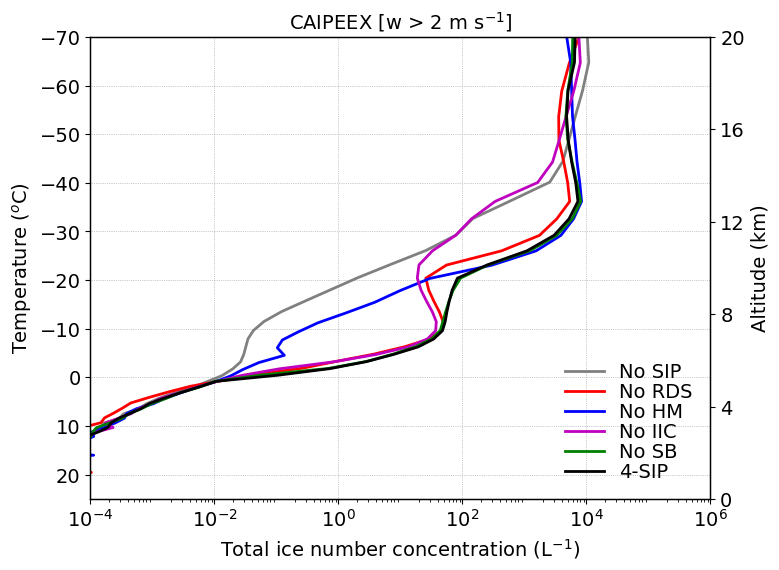

In [36]:
fontsize=14;
lnwdth=2;
alpha=0.6;

plt.figure(figsize=(8, 6))

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_inc_up_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_inc_up_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_inc_up_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_inc_up_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_inc_up_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_tot_inc_up_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt2.plot(mean_tot_inc_up_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt2.grid(True, linestyle='-', linewidth=0., color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX [w > 2 m s$^{-1}$]', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

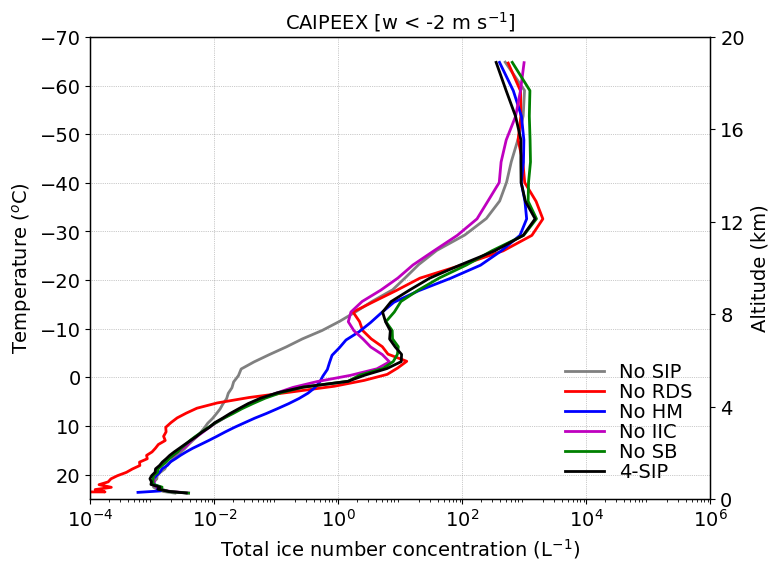

In [37]:
fontsize=14;
lnwdth=2;
alpha=0.6;

plt.figure(figsize=(8, 6))

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_inc_dn_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_inc_dn_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_inc_dn_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_inc_dn_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_inc_dn_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_tot_inc_dn_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt2.plot(mean_tot_inc_dn_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt2.grid(True, linestyle='-', linewidth=0., color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX [w < -2 m s$^{-1}$]', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

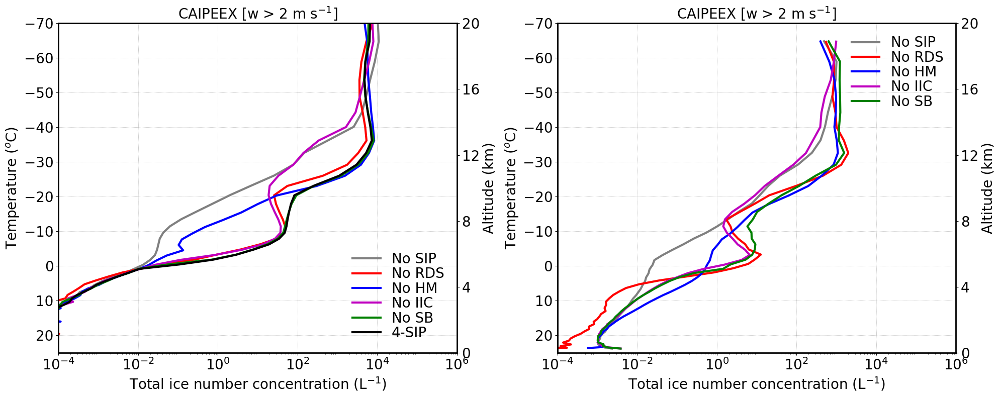

In [41]:


fontsize=20;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_inc_up_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_inc_up_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_inc_up_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_inc_up_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_inc_up_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')
plt1.plot(mean_tot_inc_up_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt2.plot(mean_tot_inc_up_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX [w > 2 m s$^{-1}$]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_tot_inc_dn_nosip*fact, mean_tempc_nosip, '-', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_tot_inc_dn_norf*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_tot_inc_dn_nohm*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt1.plot(mean_tot_inc_dn_nobr*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_tot_inc_dn_nosb*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt2.plot(mean_tot_inc_dn_nosb*fact, mean_ht_nobr, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e6)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX [w > 2 m s$^{-1}$]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.tight_layout()
plt.show()


### mass and number mixing ratios of hydrometeors

In [58]:

thres_q = 1.e-12

mean_qc_4sip = ds_4sip.qc.where(ds_4sip.qc > thres_q).mean(dim=('time','ncells'))
mean_qr_4sip = ds_4sip.qr.where(ds_4sip.qr > thres_q).mean(dim=('time','ncells'))
mean_qi_4sip = ds_4sip.qi.where(ds_4sip.qi > thres_q).mean(dim=('time','ncells'))
mean_qs_4sip = ds_4sip.qs.where(ds_4sip.qs > thres_q).mean(dim=('time','ncells'))
mean_qg_4sip = ds_4sip.qg.where(ds_4sip.qg > thres_q).mean(dim=('time','ncells'))
mean_qh_4sip = ds_4sip.qh.where(ds_4sip.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qc_4sip, mean_qr_4sip, mean_qi_4sip, mean_qs_4sip, mean_qg_4sip, mean_qh_4sip]
numpy_variables = [var.values for var in variables]

mean_qc_4sip = numpy_variables[0]
mean_qr_4sip = numpy_variables[1]
mean_qi_4sip = numpy_variables[2]
mean_qs_4sip = numpy_variables[3]
mean_qg_4sip = numpy_variables[4]
mean_qh_4sip = numpy_variables[5]

mean_qnc_4sip = ds_4sip.qnc.where(ds_4sip.qc > thres_q).mean(dim=('time','ncells'))
mean_qnr_4sip = ds_4sip.qnr.where(ds_4sip.qr > thres_q).mean(dim=('time','ncells'))
mean_qni_4sip = ds_4sip.qni.where(ds_4sip.qi > thres_q).mean(dim=('time','ncells'))
mean_qns_4sip = ds_4sip.qns.where(ds_4sip.qs > thres_q).mean(dim=('time','ncells'))
mean_qng_4sip = ds_4sip.qng.where(ds_4sip.qg > thres_q).mean(dim=('time','ncells'))
mean_qnh_4sip = ds_4sip.qnh.where(ds_4sip.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qnc_4sip, mean_qnr_4sip, mean_qni_4sip, mean_qns_4sip, mean_qng_4sip, mean_qnh_4sip]
numpy_variables = [var.values for var in variables]

mean_qnc_4sip = numpy_variables[0]
mean_qnr_4sip = numpy_variables[1]
mean_qni_4sip = numpy_variables[2]
mean_qns_4sip = numpy_variables[3]
mean_qng_4sip = numpy_variables[4]
mean_qnh_4sip = numpy_variables[5]


In [70]:
mean_tqi_4sip

np.float32(0.0048745167)

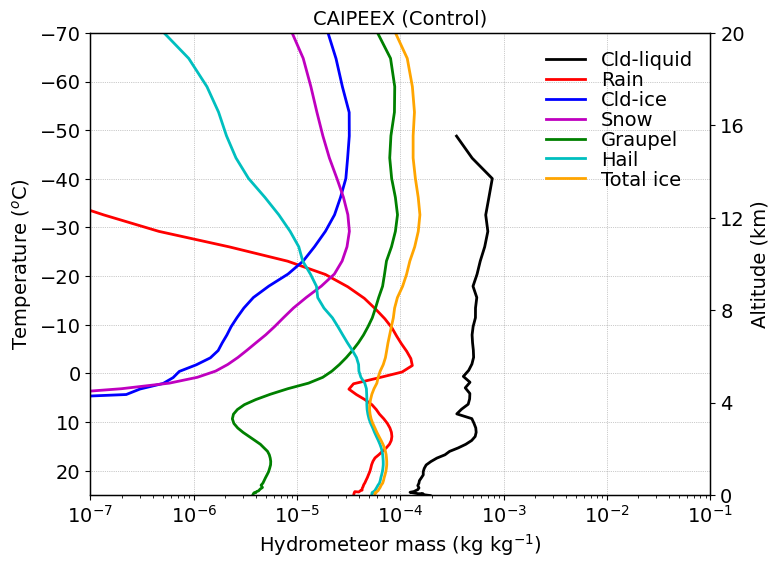

In [62]:

mean_tqi_4sip = np.nansum([mean_qi_4sip,mean_qs_4sip,mean_qg_4sip,mean_qh_4sip], axis=0)

fontsize=14;
lnwdth=2;
alpha=0.6;

plt.figure(figsize=(8, 6))

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_4sip*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_4sip*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_4sip*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_4sip*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_4sip*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_4sip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')
plt1.plot(mean_tqi_4sip*fact, mean_tempc_4sip, '-', color='orange', linewidth=lnwdth, label='Total ice')

plt2.plot(mean_qh_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt2.grid(True, linestyle='-', linewidth=0., color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-7, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX (Control)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

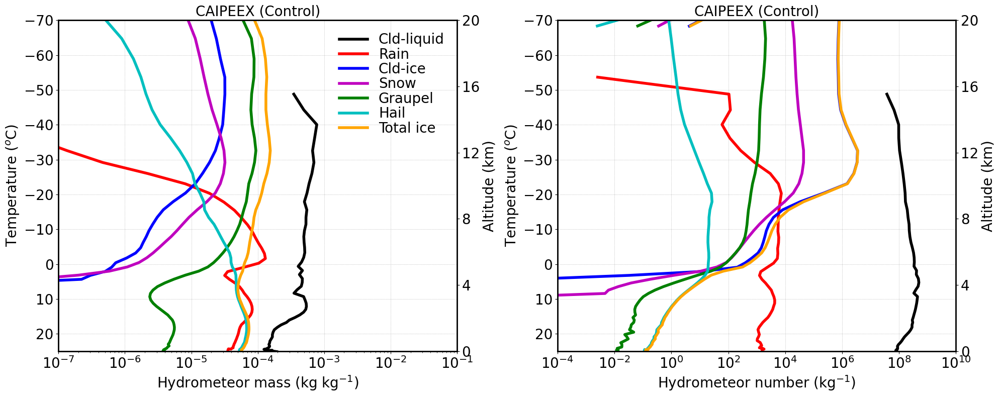

In [63]:

mean_tqi_4sip = np.nansum([mean_qi_4sip,mean_qs_4sip,mean_qg_4sip,mean_qh_4sip], axis=0)
mean_tqni_4sip = np.nansum([mean_qni_4sip,mean_qns_4sip,mean_qng_4sip,mean_qnh_4sip], axis=0)

fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_4sip*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_4sip*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_4sip*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_4sip*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_4sip*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_4sip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')
plt1.plot(mean_tqi_4sip*fact, mean_tempc_4sip, '-', color='orange', linewidth=lnwdth, label='Total ice')

plt2.plot(mean_qh_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-7, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX (Control)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qnc_4sip*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qnr_4sip*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qni_4sip*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qns_4sip*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qng_4sip*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qnh_4sip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')
plt1.plot(mean_tqni_4sip*fact, mean_tempc_4sip, '-', color='orange', linewidth=lnwdth, label='Total ice')

plt2.plot(mean_qnh_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor number (kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX (Control)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.tight_layout()
plt.show()


In [52]:

thres_q = 1.e-12

mean_qc_nosip = ds_nosip.qc.where(ds_nosip.qc > thres_q).mean(dim=('time','ncells'))
mean_qr_nosip = ds_nosip.qr.where(ds_nosip.qr > thres_q).mean(dim=('time','ncells'))
mean_qi_nosip = ds_nosip.qi.where(ds_nosip.qi > thres_q).mean(dim=('time','ncells'))
mean_qs_nosip = ds_nosip.qs.where(ds_nosip.qs > thres_q).mean(dim=('time','ncells'))
mean_qg_nosip = ds_nosip.qg.where(ds_nosip.qg > thres_q).mean(dim=('time','ncells'))
mean_qh_nosip = ds_nosip.qh.where(ds_nosip.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qc_nosip, mean_qr_nosip, mean_qi_nosip, mean_qs_nosip, mean_qg_nosip, mean_qh_nosip]
numpy_variables = [var.values for var in variables]

mean_qc_nosip = numpy_variables[0]
mean_qr_nosip = numpy_variables[1]
mean_qi_nosip = numpy_variables[2]
mean_qs_nosip = numpy_variables[3]
mean_qg_nosip = numpy_variables[4]
mean_qh_nosip = numpy_variables[5]

mean_qnc_nosip = ds_nosip.qnc.where(ds_nosip.qc > thres_q).mean(dim=('time','ncells'))
mean_qnr_nosip = ds_nosip.qnr.where(ds_nosip.qr > thres_q).mean(dim=('time','ncells'))
mean_qni_nosip = ds_nosip.qni.where(ds_nosip.qi > thres_q).mean(dim=('time','ncells'))
mean_qns_nosip = ds_nosip.qns.where(ds_nosip.qs > thres_q).mean(dim=('time','ncells'))
mean_qng_nosip = ds_nosip.qng.where(ds_nosip.qg > thres_q).mean(dim=('time','ncells'))
mean_qnh_nosip = ds_nosip.qnh.where(ds_nosip.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qnc_nosip, mean_qnr_nosip, mean_qni_nosip, mean_qns_nosip, mean_qng_nosip, mean_qnh_nosip]
numpy_variables = [var.values for var in variables]

mean_qnc_nosip = numpy_variables[0]
mean_qnr_nosip = numpy_variables[1]
mean_qni_nosip = numpy_variables[2]
mean_qns_nosip = numpy_variables[3]
mean_qng_nosip = numpy_variables[4]
mean_qnh_nosip = numpy_variables[5]


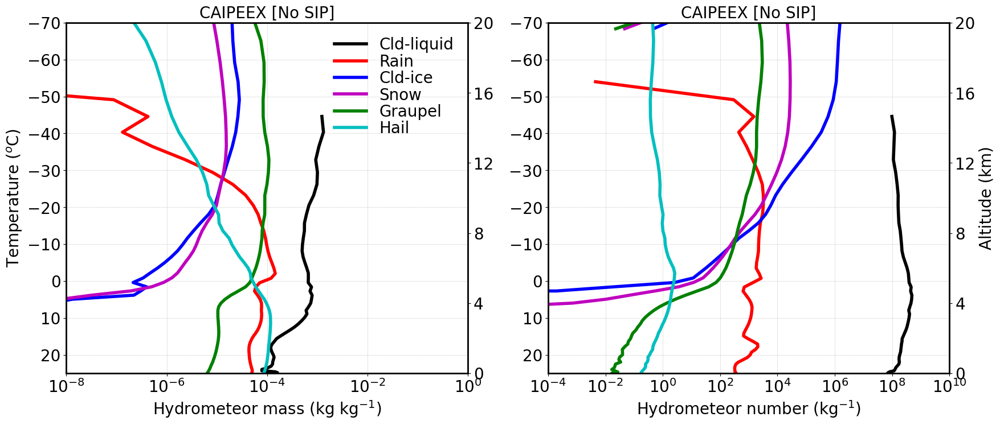

In [54]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_nosip*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_nosip*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_nosip*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_nosip*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_nosip*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_nosip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qh_nosip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-8, 1.e0)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX [No SIP]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qnc_nosip*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qnr_nosip*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qni_nosip*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qns_nosip*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qng_nosip*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qnh_nosip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qnh_nosip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor number (kg$^{-1}$)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [No SIP]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


In [73]:
thres_q = 1.e-12

mean_qc_norf = ds_norf.qc.where(ds_norf.qc > thres_q).mean(dim=('time','ncells'))
mean_qr_norf = ds_norf.qr.where(ds_norf.qr > thres_q).mean(dim=('time','ncells'))
mean_qi_norf = ds_norf.qi.where(ds_norf.qi > thres_q).mean(dim=('time','ncells'))
mean_qs_norf = ds_norf.qs.where(ds_norf.qs > thres_q).mean(dim=('time','ncells'))
mean_qg_norf = ds_norf.qg.where(ds_norf.qg > thres_q).mean(dim=('time','ncells'))
mean_qh_norf = ds_norf.qh.where(ds_norf.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qc_norf, mean_qr_norf, mean_qi_norf, mean_qs_norf, mean_qg_norf, mean_qh_norf]
numpy_variables = [var.values for var in variables]

mean_qc_norf = numpy_variables[0]
mean_qr_norf = numpy_variables[1]
mean_qi_norf = numpy_variables[2]
mean_qs_norf = numpy_variables[3]
mean_qg_norf = numpy_variables[4]
mean_qh_norf = numpy_variables[5]

mean_qnc_norf = ds_norf.qnc.where(ds_norf.qc > thres_q).mean(dim=('time','ncells'))
mean_qnr_norf = ds_norf.qnr.where(ds_norf.qr > thres_q).mean(dim=('time','ncells'))
mean_qni_norf = ds_norf.qni.where(ds_norf.qi > thres_q).mean(dim=('time','ncells'))
mean_qns_norf = ds_norf.qns.where(ds_norf.qs > thres_q).mean(dim=('time','ncells'))
mean_qng_norf = ds_norf.qng.where(ds_norf.qg > thres_q).mean(dim=('time','ncells'))
mean_qnh_norf = ds_norf.qnh.where(ds_norf.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qnc_norf, mean_qnr_norf, mean_qni_norf, mean_qns_norf, mean_qng_norf, mean_qnh_norf]
numpy_variables = [var.values for var in variables]

mean_qnc_norf = numpy_variables[0]
mean_qnr_norf = numpy_variables[1]
mean_qni_norf = numpy_variables[2]
mean_qns_norf = numpy_variables[3]
mean_qng_norf = numpy_variables[4]
mean_qnh_norf = numpy_variables[5]

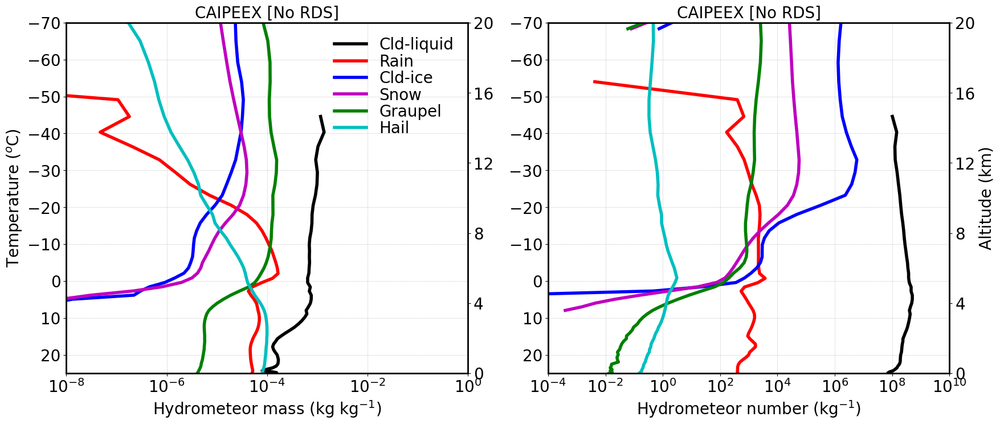

In [56]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_norf*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_norf*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_norf*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_norf*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_norf*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_norf*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qh_norf*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-8, 1.e0)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX [No RDS]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qnc_norf*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qnr_norf*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qni_norf*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qns_norf*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qng_norf*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qnh_norf*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qnh_norf*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor number (kg$^{-1}$)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [No RDS]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


In [55]:
thres_q = 1.e-12

mean_qc_nohm = ds_nohm.qc.where(ds_nohm.qc > thres_q).mean(dim=('time','ncells'))
mean_qr_nohm = ds_nohm.qr.where(ds_nohm.qr > thres_q).mean(dim=('time','ncells'))
mean_qi_nohm = ds_nohm.qi.where(ds_nohm.qi > thres_q).mean(dim=('time','ncells'))
mean_qs_nohm = ds_nohm.qs.where(ds_nohm.qs > thres_q).mean(dim=('time','ncells'))
mean_qg_nohm = ds_nohm.qg.where(ds_nohm.qg > thres_q).mean(dim=('time','ncells'))
mean_qh_nohm = ds_nohm.qh.where(ds_nohm.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qc_nohm, mean_qr_nohm, mean_qi_nohm, mean_qs_nohm, mean_qg_nohm, mean_qh_nohm]
numpy_variables = [var.values for var in variables]

mean_qc_nohm = numpy_variables[0]
mean_qr_nohm = numpy_variables[1]
mean_qi_nohm = numpy_variables[2]
mean_qs_nohm = numpy_variables[3]
mean_qg_nohm = numpy_variables[4]
mean_qh_nohm = numpy_variables[5]

mean_qnc_nohm = ds_nohm.qnc.where(ds_nohm.qc > thres_q).mean(dim=('time','ncells'))
mean_qnr_nohm = ds_nohm.qnr.where(ds_nohm.qr > thres_q).mean(dim=('time','ncells'))
mean_qni_nohm = ds_nohm.qni.where(ds_nohm.qi > thres_q).mean(dim=('time','ncells'))
mean_qns_nohm = ds_nohm.qns.where(ds_nohm.qs > thres_q).mean(dim=('time','ncells'))
mean_qng_nohm = ds_nohm.qng.where(ds_nohm.qg > thres_q).mean(dim=('time','ncells'))
mean_qnh_nohm = ds_nohm.qnh.where(ds_nohm.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qnc_nohm, mean_qnr_nohm, mean_qni_nohm, mean_qns_nohm, mean_qng_nohm, mean_qnh_nohm]
numpy_variables = [var.values for var in variables]

mean_qnc_nohm = numpy_variables[0]
mean_qnr_nohm = numpy_variables[1]
mean_qni_nohm = numpy_variables[2]
mean_qns_nohm = numpy_variables[3]
mean_qng_nohm = numpy_variables[4]
mean_qnh_nohm = numpy_variables[5]

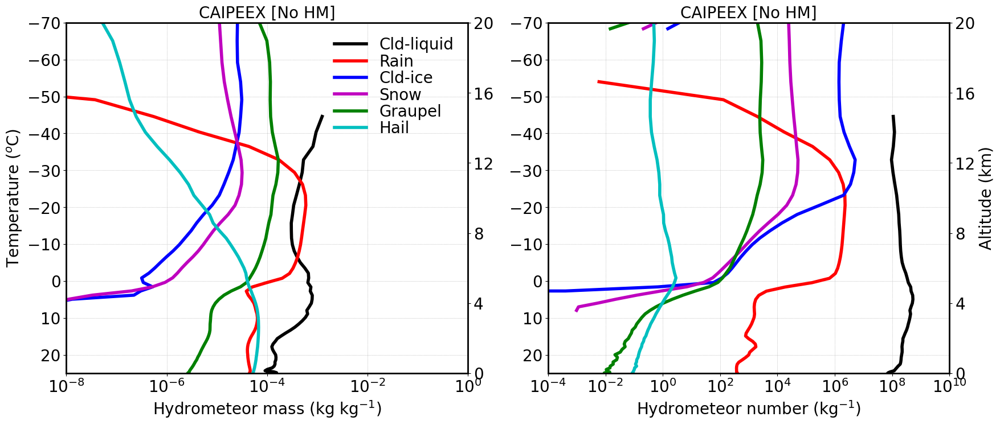

In [61]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_nohm*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_nohm*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_nohm*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_nohm*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_nohm*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_nohm*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qh_nohm*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-8, 1.e0)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX [No HM]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qnc_nohm*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qnr_nohm*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qni_nohm*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qns_nohm*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qng_nohm*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qnh_nohm*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qnh_nohm*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor number (kg$^{-1}$)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [No HM]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


In [57]:
thres_q = 1.e-12

mean_qc_nobr = ds_nobr.qc.where(ds_nobr.qc > thres_q).mean(dim=('time','ncells'))
mean_qr_nobr = ds_nobr.qr.where(ds_nobr.qr > thres_q).mean(dim=('time','ncells'))
mean_qi_nobr = ds_nobr.qi.where(ds_nobr.qi > thres_q).mean(dim=('time','ncells'))
mean_qs_nobr = ds_nobr.qs.where(ds_nobr.qs > thres_q).mean(dim=('time','ncells'))
mean_qg_nobr = ds_nobr.qg.where(ds_nobr.qg > thres_q).mean(dim=('time','ncells'))
mean_qh_nobr = ds_nobr.qh.where(ds_nobr.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qc_nobr, mean_qr_nobr, mean_qi_nobr, mean_qs_nobr, mean_qg_nobr, mean_qh_nobr]
numpy_variables = [var.values for var in variables]

mean_qc_nobr = numpy_variables[0]
mean_qr_nobr = numpy_variables[1]
mean_qi_nobr = numpy_variables[2]
mean_qs_nobr = numpy_variables[3]
mean_qg_nobr = numpy_variables[4]
mean_qh_nobr = numpy_variables[5]

mean_qnc_nobr = ds_nobr.qnc.where(ds_nobr.qc > thres_q).mean(dim=('time','ncells'))
mean_qnr_nobr = ds_nobr.qnr.where(ds_nobr.qr > thres_q).mean(dim=('time','ncells'))
mean_qni_nobr = ds_nobr.qni.where(ds_nobr.qi > thres_q).mean(dim=('time','ncells'))
mean_qns_nobr = ds_nobr.qns.where(ds_nobr.qs > thres_q).mean(dim=('time','ncells'))
mean_qng_nobr = ds_nobr.qng.where(ds_nobr.qg > thres_q).mean(dim=('time','ncells'))
mean_qnh_nobr = ds_nobr.qnh.where(ds_nobr.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qnc_nobr, mean_qnr_nobr, mean_qni_nobr, mean_qns_nobr, mean_qng_nobr, mean_qnh_nobr]
numpy_variables = [var.values for var in variables]

mean_qnc_nobr = numpy_variables[0]
mean_qnr_nobr = numpy_variables[1]
mean_qni_nobr = numpy_variables[2]
mean_qns_nobr = numpy_variables[3]
mean_qng_nobr = numpy_variables[4]
mean_qnh_nobr = numpy_variables[5]


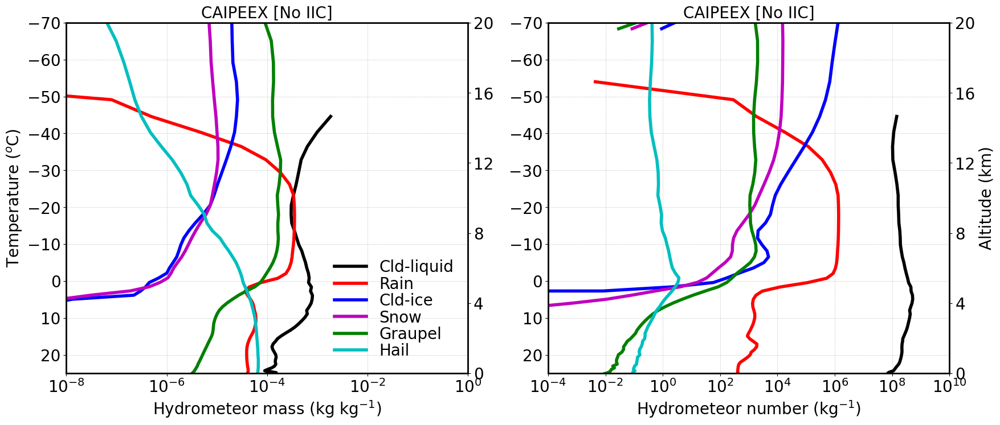

In [60]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_nobr*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_nobr*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_nobr*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_nobr*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_nobr*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_nobr*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qh_nobr*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-8, 1.e0)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX [No IIC]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qnc_nobr*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qnr_nobr*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qni_nobr*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qns_nobr*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qng_nobr*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qnh_nobr*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qnh_nobr*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor number (kg$^{-1}$)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [No IIC]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


In [58]:
thres_q = 1.e-12

mean_qc_nosb = ds_nosb.qc.where(ds_nosb.qc > thres_q).mean(dim=('time','ncells'))
mean_qr_nosb = ds_nosb.qr.where(ds_nosb.qr > thres_q).mean(dim=('time','ncells'))
mean_qi_nosb = ds_nosb.qi.where(ds_nosb.qi > thres_q).mean(dim=('time','ncells'))
mean_qs_nosb = ds_nosb.qs.where(ds_nosb.qs > thres_q).mean(dim=('time','ncells'))
mean_qg_nosb = ds_nosb.qg.where(ds_nosb.qg > thres_q).mean(dim=('time','ncells'))
mean_qh_nosb = ds_nosb.qh.where(ds_nosb.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qc_nosb, mean_qr_nosb, mean_qi_nosb, mean_qs_nosb, mean_qg_nosb, mean_qh_nosb]
numpy_variables = [var.values for var in variables]

mean_qc_nosb = numpy_variables[0]
mean_qr_nosb = numpy_variables[1]
mean_qi_nosb = numpy_variables[2]
mean_qs_nosb = numpy_variables[3]
mean_qg_nosb = numpy_variables[4]
mean_qh_nosb = numpy_variables[5]

mean_qnc_nosb = ds_nosb.qnc.where(ds_nosb.qc > thres_q).mean(dim=('time','ncells'))
mean_qnr_nosb = ds_nosb.qnr.where(ds_nosb.qr > thres_q).mean(dim=('time','ncells'))
mean_qni_nosb = ds_nosb.qni.where(ds_nosb.qi > thres_q).mean(dim=('time','ncells'))
mean_qns_nosb = ds_nosb.qns.where(ds_nosb.qs > thres_q).mean(dim=('time','ncells'))
mean_qng_nosb = ds_nosb.qng.where(ds_nosb.qg > thres_q).mean(dim=('time','ncells'))
mean_qnh_nosb = ds_nosb.qnh.where(ds_nosb.qh > thres_q).mean(dim=('time','ncells'))

variables = [mean_qnc_nosb, mean_qnr_nosb, mean_qni_nosb, mean_qns_nosb, mean_qng_nosb, mean_qnh_nosb]
numpy_variables = [var.values for var in variables]

mean_qnc_nosb = numpy_variables[0]
mean_qnr_nosb = numpy_variables[1]
mean_qni_nosb = numpy_variables[2]
mean_qns_nosb = numpy_variables[3]
mean_qng_nosb = numpy_variables[4]
mean_qnh_nosb = numpy_variables[5]

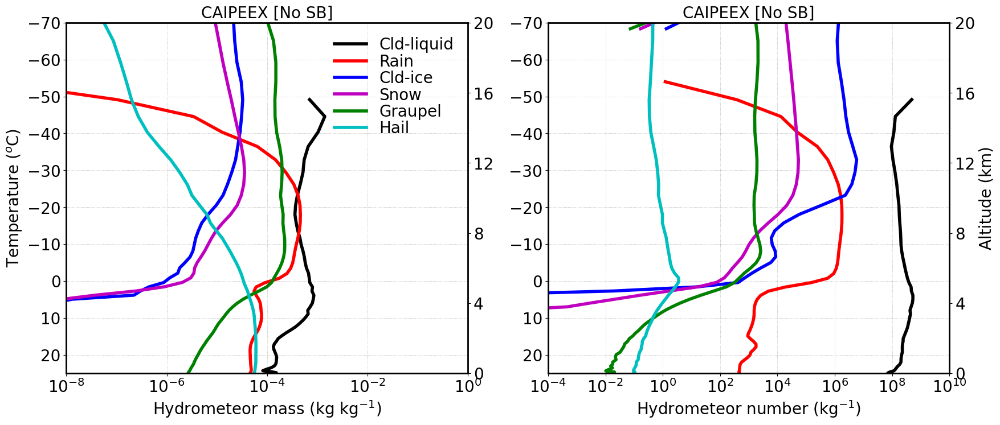

In [59]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qc_nosb*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qr_nosb*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qi_nosb*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qs_nosb*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qg_nosb*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qh_nosb*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qh_nosb*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-8, 1.e0)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor mass (kg kg$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('CAIPEEX [No SB]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qnc_nosb*fact, mean_tempc_norf, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt1.plot(mean_qnr_nosb*fact, mean_tempc_nohm, 'r-', linewidth=lnwdth, label='Rain')
plt1.plot(mean_qni_nosb*fact, mean_tempc_nobr, 'b-', linewidth=lnwdth, label='Cld-ice')
plt1.plot(mean_qns_nosb*fact, mean_tempc_nosb, 'm-', linewidth=lnwdth, label='Snow')
plt1.plot(mean_qng_nosb*fact, mean_tempc_4sip, 'g-', linewidth=lnwdth, label='Graupel')
plt1.plot(mean_qnh_nosb*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hail')

plt2.plot(mean_qnh_nosb*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Hydrometeor number (kg$^{-1}$)', fontsize=fontsize)
#plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX [No SB]', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)
plt.show()


## Process rates

### 1. Process rates of SIPs
#### mass and number mixing ratio 

In [66]:
ds_4sip

<xarray.Dataset> Size: 74GB
Dimensions:            (time: 41, ncells: 68960, vertices: 3, height: 65,
                        bnds: 2, plev: 1, plev_2: 1, plev_3: 1, height_2: 66)
Coordinates:
  * time               (time) datetime64[ns] 328B 2019-09-30 ... 2019-09-30T2...
    clon               (ncells) float64 552kB dask.array<chunksize=(68960,), meta=np.ndarray>
    clat               (ncells) float64 552kB dask.array<chunksize=(68960,), meta=np.ndarray>
  * height             (height) float64 520B 1.0 2.0 3.0 4.0 ... 63.0 64.0 65.0
  * height_2           (height_2) float64 528B 1.0 2.0 3.0 ... 64.0 65.0 66.0
  * plev               (plev) float64 8B 800.0
  * plev_2             (plev_2) float64 8B 400.0
  * plev_3             (plev_3) float64 8B 0.0
Dimensions without coordinates: ncells, vertices, bnds
Data variables: (12/121)
    clon_bnds          (time, ncells, vertices) float64 68MB dask.array<chunksize=(1, 68960, 3), meta=np.ndarray>
    clat_bnds          (time, ncells, vertices) float64 68MB dask.array<chunksize=(1, 68960, 3), meta=np.ndarray>
    height_bnds        (time, height, bnds) float64 43kB dask.array<chunksize=(1, 65, 2), meta=np.ndarray>
    plev_bnds          (time, plev, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_2_bnds        (time, plev_2, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_3_bnds        (time, plev_3, bnds) float64 656B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    ...                 ...
    tqi                (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    tq                 (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    ciwc_gperm3        (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    tiwc_gperm3        (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    cdnc_percm3        (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
    inc_perl           (time, height, ncells) float32 735MB dask.array<chunksize=(1, 65, 68960), meta=np.ndarray>
Attributes:
    CDI:                  Climate Data Interface version 2.4.0 (https://mpime...
    Conventions:          CF-1.6
    number_of_grid_used:  99
    uuidOfHGrid:          3eb4f381-adbd-e79a-b32f-6e1ff3ba2860
    uuidOfVGrid:          acbf7b33-d4a3-b631-6ecd-012f775e2bc0
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    title:                ICON simulation
    source:               version: 2024.10; revision: f3f9a5624ca4223a7fe2f0c...
    history:              /home/b/b382718/continental_cases/4sip/icon-oct2024...
    references:           see MPIM/DWD publications
    comment:              Deepak Waman (b382718) on l20442 (Linux 4.18.0-513....

In [45]:

thres_q = 1.e-14

mean_qi_homhet_4sip = ds_4sip.d_qi_homhet.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))
mean_qi_hom_4sip = ds_4sip.d_qi_hom.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))
mean_qi_het_4sip = ds_4sip.d_qi_het.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))

variables = [mean_qi_homhet_4sip, mean_qi_hom_4sip, mean_qi_het_4sip]
numpy_variables = [var.values for var in variables]

mean_qi_homhet_4sip = numpy_variables[0]
mean_qi_hom_4sip = numpy_variables[1]
mean_qi_het_4sip = numpy_variables[2]

mean_qni_homhet_4sip = ds_4sip.d_qni_homhet.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))
mean_qni_hom_4sip = ds_4sip.d_qni_hom.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))

variables = [mean_qni_homhet_4sip, mean_qni_hom_4sip]
numpy_variables = [var.values for var in variables]
mean_qni_homhet_4sip = numpy_variables[0]
mean_qni_hom_4sip = numpy_variables[1]

mean_qi_tot_sec_4sip = ds_4sip.dqi_sec.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qi_rf_4sip = ds_4sip.dqi_ds.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qi_hm_4sip = ds_4sip.dqi_rs.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qi_br_4sip = ds_4sip.dqi_br.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qi_sb_snow_4sip = ds_4sip.dqi_snow_sbf.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qi_sb_graup_4sip = ds_4sip.dqi_graup_sbf.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qi_sb_4sip = mean_qi_sb_snow_4sip + mean_qi_sb_graup_4sip

mean_qni_tot_sec_4sip = ds_4sip.dqni_sec.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qni_rf_4sip = ds_4sip.dqni_ds.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qni_hm_4sip = ds_4sip.dqni_rs.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qni_br_4sip = ds_4sip.dqni_br.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qni_sb_snow_4sip = ds_4sip.dqni_snow_sbf.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qni_sb_graup_4sip = ds_4sip.dqni_graup_sbf.where(ds_4sip.dqi_sec > thres_q).mean(dim=('time','ncells'))
mean_qni_sb_4sip = mean_qni_sb_snow_4sip + mean_qni_sb_graup_4sip

variables = [mean_qi_tot_sec_4sip, mean_qi_rf_4sip, mean_qi_hm_4sip, mean_qi_br_4sip, mean_qi_sb_4sip]
numpy_variables = [var.values for var in variables]

mean_qi_tot_sec_4sip = numpy_variables[0]
mean_qi_rf_4sip = numpy_variables[1]
mean_qi_hm_4sip = numpy_variables[2]
mean_qi_br_4sip = numpy_variables[3]
mean_qi_sb_4sip = numpy_variables[4]

variables = [mean_qni_tot_sec_4sip, mean_qni_rf_4sip, mean_qni_hm_4sip, mean_qni_br_4sip, mean_qni_sb_4sip]
numpy_variables = [var.values for var in variables]

mean_qni_tot_sec_4sip = numpy_variables[0]
mean_qni_rf_4sip = numpy_variables[1]
mean_qni_hm_4sip = numpy_variables[2]
mean_qni_br_4sip = numpy_variables[3]
mean_qni_sb_4sip = numpy_variables[4]

In [67]:
mean_qni_homhet_4sip = ds_4sip.d_qni_homhet.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))
mean_qni_hom_4sip = ds_4sip.d_qni_hom.where(ds_4sip.tqi > thres_q).mean(dim=('time','ncells'))

variables = [mean_qni_homhet_4sip, mean_qni_hom_4sip]
numpy_variables = [var.values for var in variables]
mean_qni_homhet_4sip = numpy_variables[0]
mean_qni_hom_4sip = numpy_variables[1]

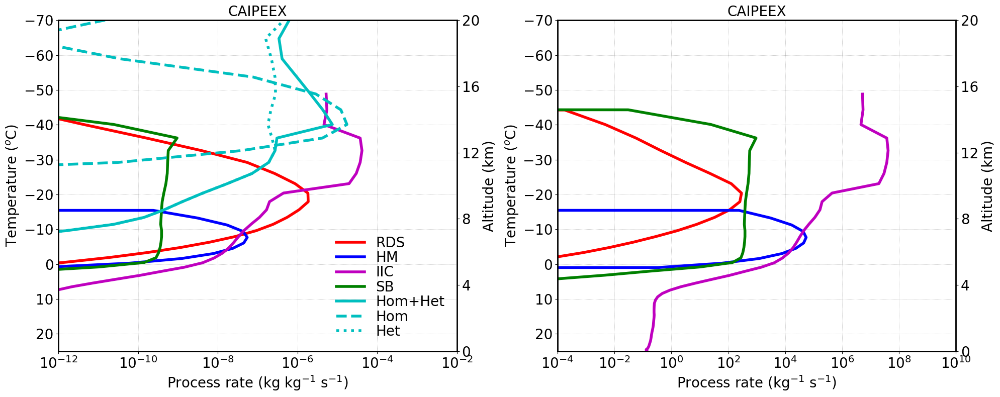

In [50]:


fontsize=20;
lnwdth=4;
alpha=0.6;

plt.figure(figsize=(20, 8))

plt.subplot(1,2,1)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qi_rf_4sip*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='RDS')
plt1.plot(mean_qi_hm_4sip*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='HM')
plt1.plot(mean_qi_br_4sip*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='IIC')
plt1.plot(mean_qi_sb_4sip*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='SB')
#plt1.plot(mean_qi_tot_sec_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')


plt1.plot(mean_qi_homhet_4sip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hom+Het')
plt1.plot(mean_qi_hom_4sip*fact, mean_tempc_4sip, 'c--', linewidth=lnwdth, label='Hom')
plt1.plot(mean_qi_het_4sip*fact, mean_tempc_4sip, 'c:', linewidth=lnwdth, label='Het')
#plt1.plot(mean_qi_hom*fact, mean_tempc_4sip, 'c--', linewidth=lnwdth, label='Hom')

plt2.plot(mean_qi_tot_sec_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-12, 1.e-2)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Process rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)


plt.subplot(1,2,2)

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qni_rf_4sip*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='RDS')
plt1.plot(mean_qni_hm_4sip*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='HM')
plt1.plot(mean_qni_br_4sip*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='IIC')
plt1.plot(mean_qni_sb_4sip*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='SB')
#plt1.plot(mean_qni_tot_sec_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')

plt2.plot(mean_qni_tot_sec_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-4, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Process rate (kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
#plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX', fontsize=fontsize)

plt1.spines['top'].set_linewidth(2)
plt1.spines['right'].set_linewidth(2)
plt1.spines['left'].set_linewidth(2)
plt1.spines['bottom'].set_linewidth(2)

plt.tight_layout()
plt.show()


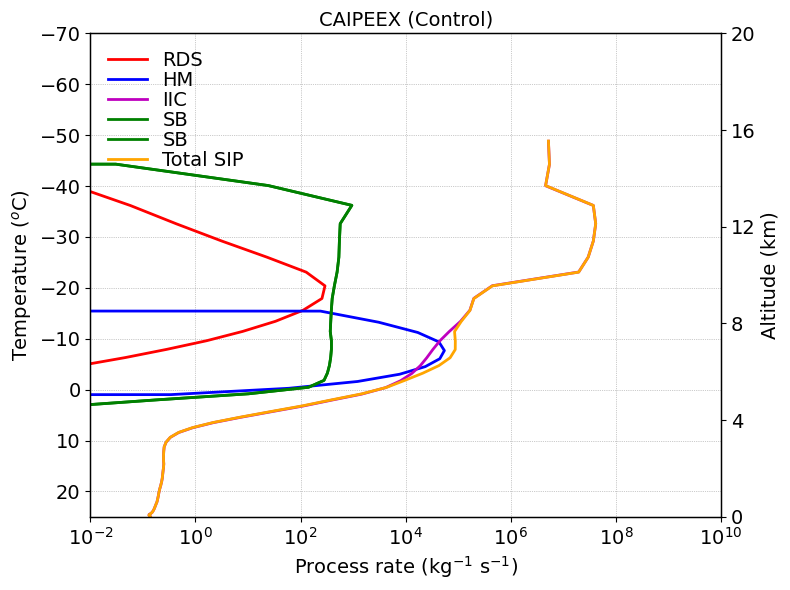

In [71]:

#mean_qni_tot_homhet_4sip = mean_qni_homhet_4sip + mean_qni_hom_4sip 
#mean_qni_het_4sip = mean_qni_homhet_4sip-mean_tot_qi_hom_4sip

mean_qni_tot_sec_4sip = mean_qni_rf_4sip+mean_qni_hm_4sip+mean_qni_br_4sip+mean_qni_sb_4sip

fontsize=14;
lnwdth=2;
alpha=0.6;

plt.figure(figsize=(8, 6))

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.

plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qni_rf_4sip*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='RDS')
plt1.plot(mean_qni_hm_4sip*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='HM')
plt1.plot(mean_qni_br_4sip*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='IIC')
plt1.plot(mean_qni_sb_4sip*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='SB')
plt1.plot(mean_qni_sb_4sip*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='SB')
plt1.plot(mean_qni_tot_sec_4sip*fact, mean_tempc_4sip, '-', color='orange', linewidth=lnwdth, label='Total SIP')

plt2.plot(mean_qni_tot_sec_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)


plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-2, 1.e10)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Process rate (kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

#plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')

plt.title('CAIPEEX (Control)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.tight_layout()
plt.show()


(25.0, -70.0)

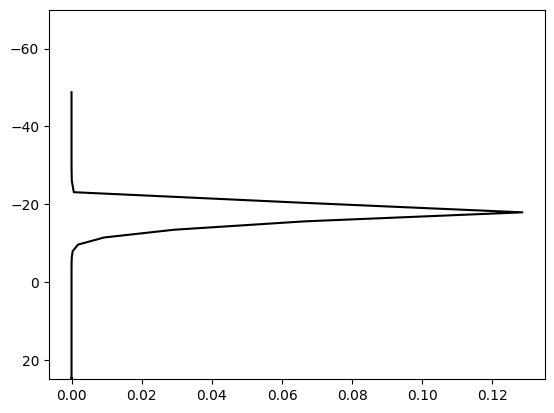

In [75]:

plt.plot(per_qni_rf_4sip, mean_tempc_norf, 'k-')
#plt.xlim(0, 1.e2)
plt.ylim(25, -70)

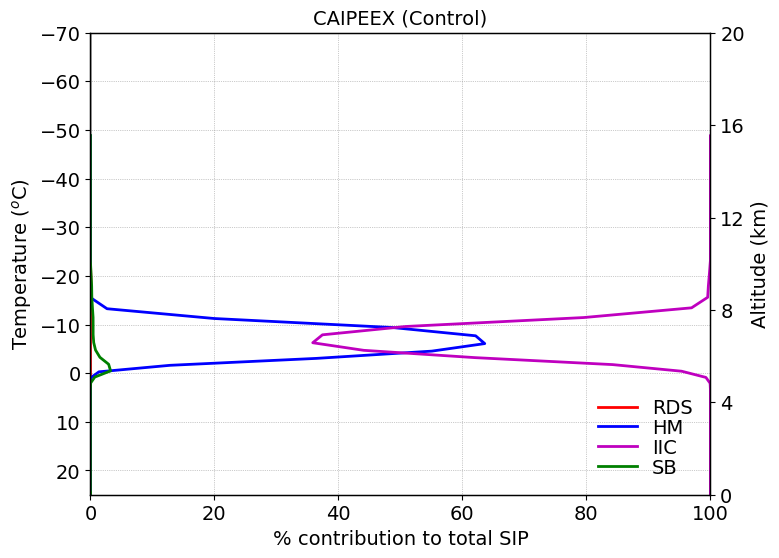

In [70]:
fontsize=14;
lnwdth=2;
alpha=0.6;

mean_qni_tot_sec_4sip = mean_qni_rf_4sip+mean_qni_hm_4sip+mean_qni_br_4sip+mean_qni_sb_4sip

per_qni_rf_4sip = 100*mean_qni_rf_4sip/mean_qni_tot_sec_4sip
per_qni_hm_4sip = 100*mean_qni_hm_4sip/mean_qni_tot_sec_4sip
per_qni_br_4sip = 100*mean_qni_br_4sip/mean_qni_tot_sec_4sip
per_qni_sb_4sip = 100*mean_qni_sb_4sip/mean_qni_tot_sec_4sip

plt.figure(figsize=(8, 6))


plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(per_qni_rf_4sip, mean_tempc_norf, 'r-', linewidth=lnwdth, label='RDS')
plt1.plot(per_qni_hm_4sip, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='HM')
plt1.plot(per_qni_br_4sip, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='IIC')
plt1.plot(per_qni_sb_4sip, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='SB')


#plt1.plot(mean_qi_hom*fact, mean_tempc_4sip, 'c--', linewidth=lnwdth, label='Hom')

plt2.plot(per_qni_sb_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

#plt1.set_xscale('log')
plt1.set_xlim(0, 1.e2)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('% contribution to total SIP', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX (Control)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)

plt.show()

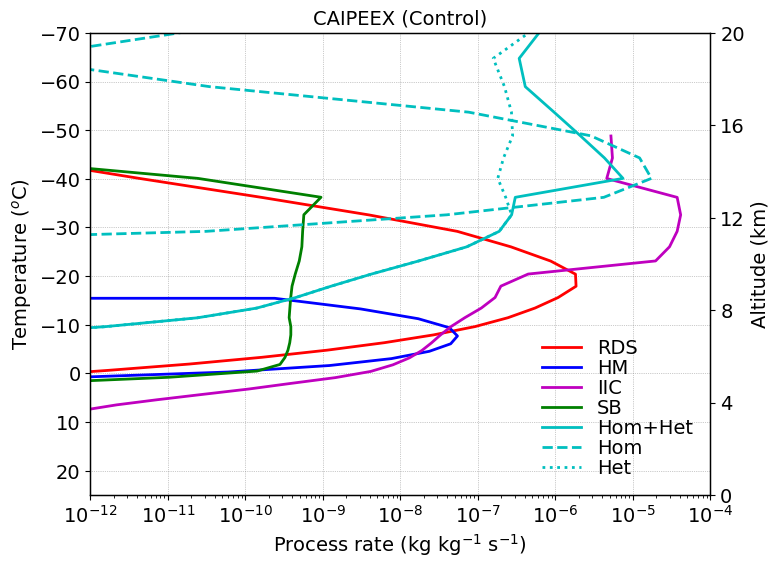

In [69]:


fontsize=14;
lnwdth=2;
alpha=0.6;

plt.figure(figsize=(8, 6))

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_qi_rf_4sip*fact, mean_tempc_norf, 'r-', linewidth=lnwdth, label='RDS')
plt1.plot(mean_qi_hm_4sip*fact, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='HM')
plt1.plot(mean_qi_br_4sip*fact, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='IIC')
plt1.plot(mean_qi_sb_4sip*fact, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='SB')
#plt1.plot(mean_qi_tot_sec_4sip*fact, mean_tempc_4sip, 'k-', linewidth=lnwdth, label='4-SIP')


plt1.plot(mean_qi_homhet_4sip*fact, mean_tempc_4sip, 'c-', linewidth=lnwdth, label='Hom+Het')
plt1.plot(mean_qi_hom_4sip*fact, mean_tempc_4sip, 'c--', linewidth=lnwdth, label='Hom')
plt1.plot(mean_qi_het_4sip*fact, mean_tempc_4sip, 'c:', linewidth=lnwdth, label='Het')
#plt1.plot(mean_qi_hom*fact, mean_tempc_4sip, 'c--', linewidth=lnwdth, label='Hom')

plt2.plot(mean_qi_tot_sec_4sip*fact, mean_ht_nosb, '-', color='none', linewidth=lnwdth)#, label='No SB')

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-12, 1.e-4)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Process rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')

plt.title('CAIPEEX (Control)', fontsize=fontsize)

plt1.spines['top'].set_linewidth(1)
plt1.spines['right'].set_linewidth(1)
plt1.spines['left'].set_linewidth(1)
plt1.spines['bottom'].set_linewidth(1)


plt.show()


## Process rates of riming, deposition, nucleation, freezing

In [10]:

thres_q = 1.e-8

# Riming
mean_dq_tot_rime_4sip = xr.where(ds_4sip.d_qx_riming > thres_q, ds_4sip.d_qx_riming, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_rime_nosip = xr.where(ds_nosip.d_qx_riming > thres_q, ds_nosip.d_qx_riming, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_rime_norf = xr.where(ds_norf.d_qx_riming > thres_q, ds_norf.d_qx_riming, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_rime_nohm = xr.where(ds_nohm.d_qx_riming > thres_q, ds_nohm.d_qx_riming, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_rime_nobr = xr.where(ds_nobr.d_qx_riming > thres_q, ds_nobr.d_qx_riming, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_rime_nosb = xr.where(ds_nosb.d_qx_riming > thres_q, ds_nosb.d_qx_riming, np.nan).mean(dim=('time','ncells'))

# Deposition 
mean_dq_tot_dep_4sip = ds_4sip.d_qi_dep+ds_4sip.d_qs_dep+ds_4sip.d_qg_dep+ds_4sip.d_qh_dep
mean_dq_tot_dep_nosip = ds_nosip.d_qi_dep+ds_nosip.d_qs_dep+ds_nosip.d_qg_dep+ds_nosip.d_qh_dep
mean_dq_tot_dep_norf = ds_norf.d_qi_dep+ds_norf.d_qs_dep+ds_norf.d_qg_dep+ds_norf.d_qh_dep
mean_dq_tot_dep_nohm = ds_nohm.d_qi_dep+ds_nohm.d_qs_dep+ds_nohm.d_qg_dep+ds_nohm.d_qh_dep
mean_dq_tot_dep_nobr = ds_nobr.d_qi_dep+ds_nobr.d_qs_dep+ds_nobr.d_qg_dep+ds_nobr.d_qh_dep
mean_dq_tot_dep_nosb = ds_nosb.d_qi_dep+ds_nosb.d_qs_dep+ds_nosb.d_qg_dep+ds_nosb.d_qh_dep

mean_dq_tot_dep_4sip = xr.where(mean_dq_tot_dep_4sip > thres_q, mean_dq_tot_dep_4sip, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_dep_nosip = xr.where(mean_dq_tot_dep_nosip > thres_q, mean_dq_tot_dep_nosip, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_dep_norf = xr.where(mean_dq_tot_dep_norf > thres_q, mean_dq_tot_dep_norf, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_dep_nohm = xr.where(mean_dq_tot_dep_nohm > thres_q, mean_dq_tot_dep_nohm, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_dep_nobr = xr.where(mean_dq_tot_dep_nobr > thres_q, mean_dq_tot_dep_nobr, np.nan).mean(dim=('time','ncells'))
mean_dq_tot_dep_nosb = xr.where(mean_dq_tot_dep_nosb > thres_q, mean_dq_tot_dep_nosb, np.nan).mean(dim=('time','ncells'))

# Saturation adjustment
mean_dq_satad1_4sip = xr.where(ds_4sip.d_satad > thres_q, ds_4sip.d_satad, np.nan).mean(dim=('time','ncells'))
mean_dq_satad1_nosip = xr.where(ds_nosip.d_satad > thres_q, ds_nosip.d_satad, np.nan).mean(dim=('time','ncells'))
mean_dq_satad1_norf = xr.where(ds_norf.d_satad > thres_q, ds_norf.d_satad, np.nan).mean(dim=('time','ncells'))
mean_dq_satad1_nohm = xr.where(ds_nohm.d_satad > thres_q, ds_nohm.d_satad, np.nan).mean(dim=('time','ncells'))
mean_dq_satad1_nobr = xr.where(ds_nobr.d_satad > thres_q, ds_nobr.d_satad, np.nan).mean(dim=('time','ncells'))
mean_dq_satad1_nosb = xr.where(ds_nosb.d_satad > thres_q, ds_nosb.d_satad, np.nan).mean(dim=('time','ncells'))

mean_dq_satad2_4sip = xr.where(ds_4sip.d_satad2 > thres_q, ds_4sip.d_satad2, np.nan).mean(dim=('time','ncells'))
mean_dq_satad2_nosip = xr.where(ds_nosip.d_satad2 > thres_q, ds_nosip.d_satad2, np.nan).mean(dim=('time','ncells'))
mean_dq_satad2_norf = xr.where(ds_norf.d_satad2 > thres_q, ds_norf.d_satad2, np.nan).mean(dim=('time','ncells'))
mean_dq_satad2_nohm = xr.where(ds_nohm.d_satad2 > thres_q, ds_nohm.d_satad2, np.nan).mean(dim=('time','ncells'))
mean_dq_satad2_nobr = xr.where(ds_nobr.d_satad2 > thres_q, ds_nobr.d_satad2, np.nan).mean(dim=('time','ncells'))
mean_dq_satad2_nosb = xr.where(ds_nosb.d_satad2 > thres_q, ds_nosb.d_satad2, np.nan).mean(dim=('time','ncells'))

# Hom+het ice nucleation
mean_dq_homhet_4sip = xr.where(ds_4sip.d_qi_homhet > thres_q, ds_4sip.d_qi_homhet, np.nan).mean(dim=('time','ncells'))
mean_dq_homhet_nosip = xr.where(ds_nosip.d_qi_homhet > thres_q, ds_nosip.d_qi_homhet, np.nan).mean(dim=('time','ncells'))
mean_dq_homhet_norf = xr.where(ds_norf.d_qi_homhet > thres_q, ds_norf.d_qi_homhet, np.nan).mean(dim=('time','ncells'))
mean_dq_homhet_nohm = xr.where(ds_nohm.d_qi_homhet > thres_q, ds_nohm.d_qi_homhet, np.nan).mean(dim=('time','ncells'))
mean_dq_homhet_nobr = xr.where(ds_nobr.d_qi_homhet > thres_q, ds_nobr.d_qi_homhet, np.nan).mean(dim=('time','ncells'))
mean_dq_homhet_nosb = xr.where(ds_nosb.d_qi_homhet > thres_q, ds_nosb.d_qi_homhet, np.nan).mean(dim=('time','ncells'))

# Hom ice nucleation
mean_dq_hom_4sip = xr.where(ds_4sip.d_qi_hom > thres_q, ds_4sip.d_qi_hom, np.nan).mean(dim=('time','ncells'))
mean_dq_hom_nosip = xr.where(ds_nosip.d_qi_hom > thres_q, ds_nosip.d_qi_hom, np.nan).mean(dim=('time','ncells'))
mean_dq_hom_norf = xr.where(ds_norf.d_qi_hom > thres_q, ds_norf.d_qi_hom, np.nan).mean(dim=('time','ncells'))
mean_dq_hom_nohm = xr.where(ds_nohm.d_qi_hom > thres_q, ds_nohm.d_qi_hom, np.nan).mean(dim=('time','ncells'))
mean_dq_hom_nobr = xr.where(ds_nobr.d_qi_hom > thres_q, ds_nobr.d_qi_hom, np.nan).mean(dim=('time','ncells'))
mean_dq_hom_nosb = xr.where(ds_nosb.d_qi_hom > thres_q, ds_nosb.d_qi_hom, np.nan).mean(dim=('time','ncells'))

# het ice nucleation
mean_dq_het_4sip = xr.where(ds_4sip.d_qi_het > thres_q, ds_4sip.d_qi_het, np.nan).mean(dim=('time','ncells'))
mean_dq_het_nosip = xr.where(ds_nosip.d_qi_het > thres_q, ds_nosip.d_qi_het, np.nan).mean(dim=('time','ncells'))
mean_dq_het_norf = xr.where(ds_norf.d_qi_het > thres_q, ds_norf.d_qi_het, np.nan).mean(dim=('time','ncells'))
mean_dq_het_nohm = xr.where(ds_nohm.d_qi_het > thres_q, ds_nohm.d_qi_het, np.nan).mean(dim=('time','ncells'))
mean_dq_het_nobr = xr.where(ds_nobr.d_qi_het > thres_q, ds_nobr.d_qi_het, np.nan).mean(dim=('time','ncells'))
mean_dq_het_nosb = xr.where(ds_nosb.d_qi_het > thres_q, ds_nosb.d_qi_het, np.nan).mean(dim=('time','ncells'))

# Rain freezing
mean_dq_rainfreez_4sip = ds_4sip.d_qr_rf+ds_4sip.d_qs_rf+ds_4sip.d_qg_rf+ds_4sip.d_qh_rf
mean_dq_rainfreez_nosip = ds_nosip.d_qr_rf+ds_nosip.d_qs_rf+ds_nosip.d_qg_rf+ds_nosip.d_qh_rf
mean_dq_rainfreez_norf = ds_norf.d_qr_rf+ds_norf.d_qs_rf+ds_norf.d_qg_rf+ds_norf.d_qh_rf
mean_dq_rainfreez_nohm = ds_nohm.d_qr_rf+ds_nohm.d_qs_rf+ds_nohm.d_qg_rf+ds_nohm.d_qh_rf
mean_dq_rainfreez_nobr = ds_nobr.d_qr_rf+ds_nobr.d_qs_rf+ds_nobr.d_qg_rf+ds_nobr.d_qh_rf
mean_dq_rainfreez_nosb = ds_nosb.d_qr_rf+ds_nosb.d_qs_rf+ds_nosb.d_qg_rf+ds_nosb.d_qh_rf

mean_dq_rainfreez_4sip = xr.where(mean_dq_rainfreez_4sip > thres_q, mean_dq_rainfreez_4sip, np.nan).mean(dim=('time','ncells'))
mean_dq_rainfreez_nosip = xr.where(mean_dq_rainfreez_nosip > thres_q, mean_dq_rainfreez_nosip, np.nan).mean(dim=('time','ncells'))
mean_dq_rainfreez_norf = xr.where(mean_dq_rainfreez_norf > thres_q, mean_dq_rainfreez_norf, np.nan).mean(dim=('time','ncells'))
mean_dq_rainfreez_nohm = xr.where(mean_dq_rainfreez_nohm > thres_q, mean_dq_rainfreez_nohm, np.nan).mean(dim=('time','ncells'))
mean_dq_rainfreez_nobr = xr.where(mean_dq_rainfreez_nobr > thres_q, mean_dq_rainfreez_nobr, np.nan).mean(dim=('time','ncells'))
mean_dq_rainfreez_nosb = xr.where(mean_dq_rainfreez_nosb > thres_q, mean_dq_rainfreez_nosb, np.nan).mean(dim=('time','ncells'))

# Evaporation
mean_dq_evap_4sip = ds_4sip.d_qr_evap+ds_4sip.d_qsgh_evap
mean_dq_evap_nosip = ds_nosip.d_qr_evap+ds_nosip.d_qsgh_evap
mean_dq_evap_norf = ds_norf.d_qr_evap+ds_norf.d_qsgh_evap
mean_dq_evap_nohm = ds_nohm.d_qr_evap+ds_nohm.d_qsgh_evap
mean_dq_evap_nobr = ds_nobr.d_qr_evap+ds_nobr.d_qsgh_evap
mean_dq_evap_nosb = ds_nosb.d_qr_evap+ds_nosb.d_qsgh_evap

mean_dq_evap_4sip = xr.where(mean_dq_evap_4sip > thres_q, mean_dq_evap_4sip, np.nan).mean(dim=('time','ncells'))
mean_dq_evap_nosip = xr.where(mean_dq_evap_nosip > thres_q, mean_dq_evap_nosip, np.nan).mean(dim=('time','ncells'))
mean_dq_evap_norf = xr.where(mean_dq_evap_norf > thres_q, mean_dq_evap_norf, np.nan).mean(dim=('time','ncells'))
mean_dq_evap_nohm = xr.where(mean_dq_evap_nohm > thres_q, mean_dq_evap_nohm, np.nan).mean(dim=('time','ncells'))
mean_dq_evap_nobr = xr.where(mean_dq_evap_nobr > thres_q, mean_dq_evap_nobr, np.nan).mean(dim=('time','ncells'))
mean_dq_evap_nosb = xr.where(mean_dq_evap_nosb > thres_q, mean_dq_evap_nosb, np.nan).mean(dim=('time','ncells'))

# Melting
mean_dq_melt_4sip = ds_4sip.d_qc_melt+ds_4sip.d_qr_melt
mean_dq_melt_nosip = ds_nosip.d_qc_melt+ds_nosip.d_qr_melt
mean_dq_melt_norf = ds_norf.d_qc_melt+ds_norf.d_qr_melt
mean_dq_melt_nohm = ds_nohm.d_qc_melt+ds_nohm.d_qr_melt
mean_dq_melt_nobr = ds_nobr.d_qc_melt+ds_nobr.d_qr_melt
mean_dq_melt_nosb = ds_nosb.d_qc_melt+ds_nosb.d_qr_melt

mean_dq_melt_4sip = xr.where(mean_dq_melt_4sip > thres_q, mean_dq_melt_4sip, np.nan).mean(dim=('time','ncells'))
mean_dq_melt_nosip = xr.where(mean_dq_melt_nosip > thres_q, mean_dq_melt_nosip, np.nan).mean(dim=('time','ncells'))
mean_dq_melt_norf = xr.where(mean_dq_melt_norf > thres_q, mean_dq_melt_norf, np.nan).mean(dim=('time','ncells'))
mean_dq_melt_nohm = xr.where(mean_dq_melt_nohm > thres_q, mean_dq_melt_nohm, np.nan).mean(dim=('time','ncells'))
mean_dq_melt_nobr = xr.where(mean_dq_melt_nobr > thres_q, mean_dq_melt_nobr, np.nan).mean(dim=('time','ncells'))
mean_dq_melt_nosb = xr.where(mean_dq_melt_nosb > thres_q, mean_dq_melt_nosb, np.nan).mean(dim=('time','ncells'))

# Nucleation

mean_dq_nuc_4sip = xr.where(ds_4sip.d_qc_nuc > thres_q, ds_4sip.d_qc_nuc, np.nan).mean(dim=('time','ncells'))
mean_dq_nuc_nosip = xr.where(ds_nosip.d_qc_nuc > thres_q, ds_nosip.d_qc_nuc, np.nan).mean(dim=('time','ncells'))
mean_dq_nuc_norf = xr.where(ds_norf.d_qc_nuc > thres_q, ds_norf.d_qc_nuc, np.nan).mean(dim=('time','ncells'))
mean_dq_nuc_nohm = xr.where(ds_nohm.d_qc_nuc > thres_q, ds_nohm.d_qc_nuc, np.nan).mean(dim=('time','ncells'))
mean_dq_nuc_nobr = xr.where(ds_nobr.d_qc_nuc > thres_q, ds_nobr.d_qc_nuc, np.nan).mean(dim=('time','ncells'))
mean_dq_nuc_nosb = xr.where(ds_nosb.d_qc_nuc > thres_q, ds_nosb.d_qc_nuc, np.nan).mean(dim=('time','ncells'))


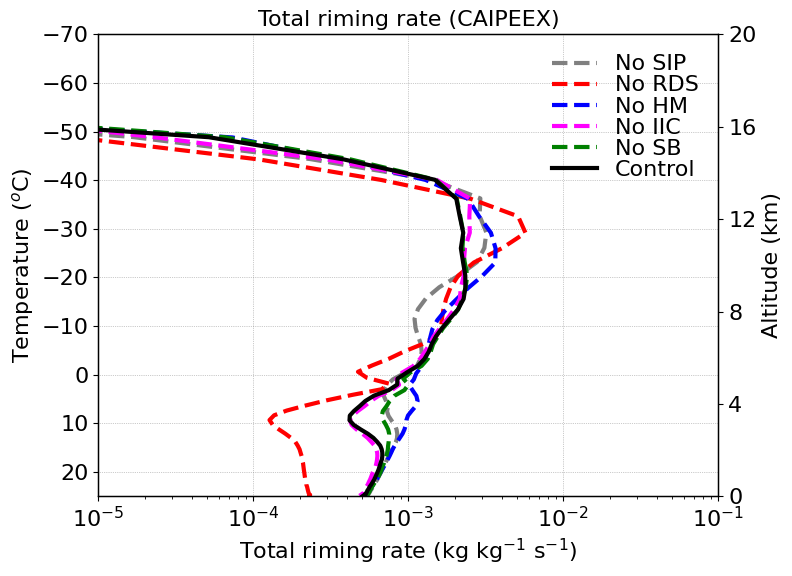

In [11]:

fontsize=16;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.style.use('default')

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_dq_tot_rime_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_dq_tot_rime_norf*fact, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_dq_tot_rime_nohm*fact, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='No HM')
plt1.plot(mean_dq_tot_rime_nobr*fact, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_dq_tot_rime_nosb*fact, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='No SB')
plt1.plot(mean_dq_tot_rime_4sip*fact, mean_tempc_4sip, '-', color='black', linewidth=lnwdth, label='Control')

plt2.plot(mean_dq_tot_rime_4sip*fact, mean_ht_4sip, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-5, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total riming rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('Total riming rate (CAIPEEX)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

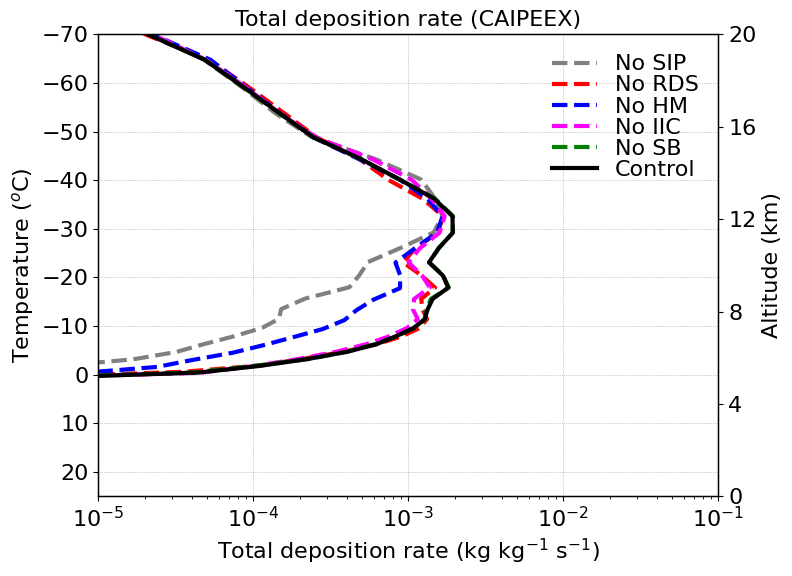

In [12]:

fontsize=16;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.style.use('default')

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_dq_tot_dep_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_dq_tot_dep_norf*fact, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_dq_tot_dep_nohm*fact, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='No HM')
plt1.plot(mean_dq_tot_dep_nobr*fact, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_dq_tot_dep_nosb*fact, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='No SB')
plt1.plot(mean_dq_tot_dep_4sip*fact, mean_tempc_4sip, '-', color='black', linewidth=lnwdth, label='Control')

plt2.plot(mean_dq_tot_dep_4sip*fact, mean_ht_4sip, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-5, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total deposition rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('Total deposition rate (CAIPEEX)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

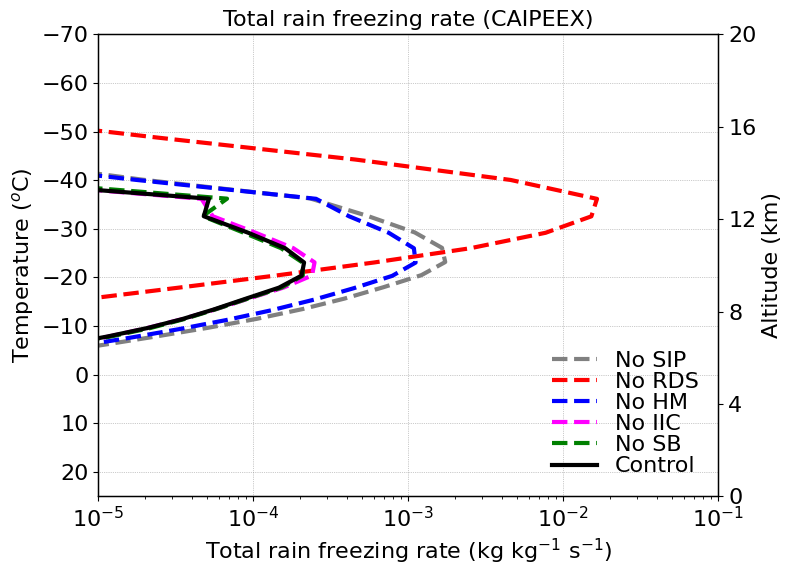

In [13]:

fontsize=16;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.style.use('default')

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_dq_rainfreez_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_dq_rainfreez_norf*fact, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_dq_rainfreez_nohm*fact, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='No HM')
plt1.plot(mean_dq_rainfreez_nobr*fact, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_dq_rainfreez_nosb*fact, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='No SB')
plt1.plot(mean_dq_rainfreez_4sip*fact, mean_tempc_4sip, '-', color='black', linewidth=lnwdth, label='Control')

plt2.plot(mean_dq_rainfreez_4sip*fact, mean_ht_4sip, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-5, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total rain freezing rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('Total rain freezing rate (CAIPEEX)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

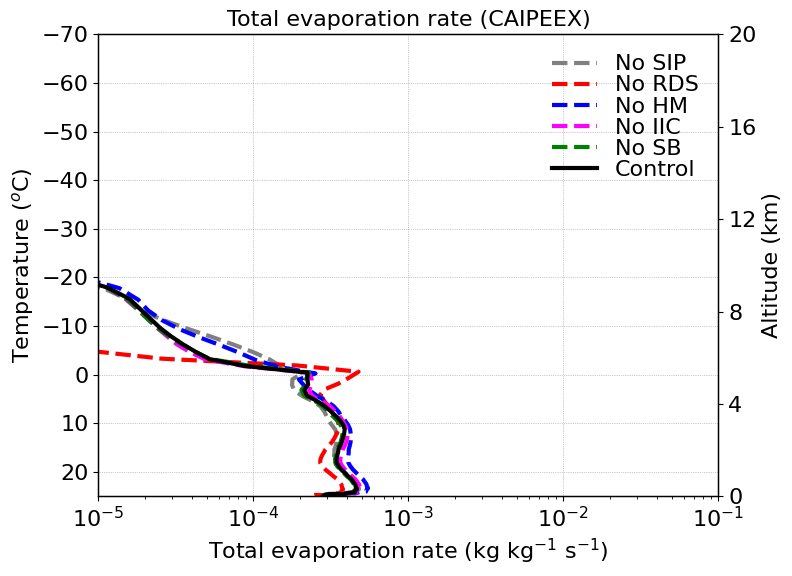

In [14]:

fontsize=16;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.style.use('default')

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_dq_evap_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_dq_evap_norf*fact, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_dq_evap_nohm*fact, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='No HM')
plt1.plot(mean_dq_evap_nobr*fact, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_dq_evap_nosb*fact, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='No SB')
plt1.plot(mean_dq_evap_4sip*fact, mean_tempc_4sip, '-', color='black', linewidth=lnwdth, label='Control')

plt2.plot(mean_dq_evap_4sip*fact, mean_ht_4sip, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-5, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 16)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total evaporation rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('Total evaporation rate (CAIPEEX)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

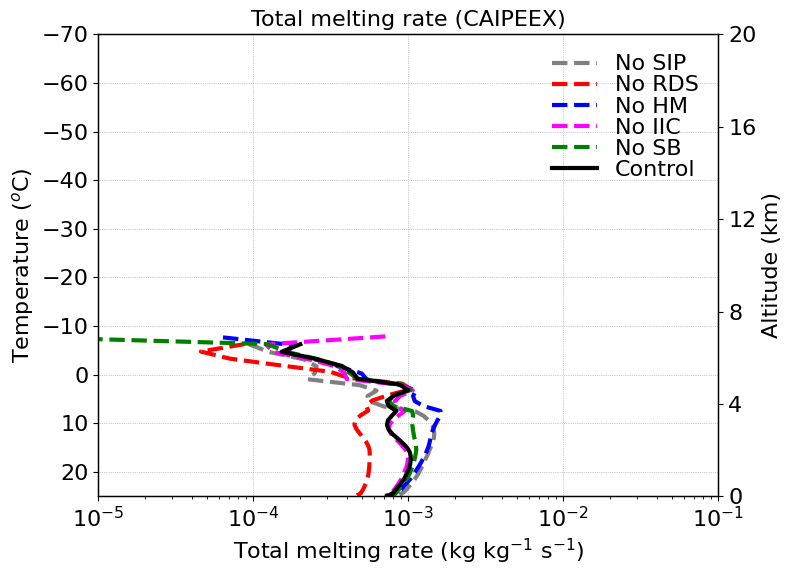

In [15]:

fontsize=16;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.style.use('default')

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_dq_melt_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_dq_melt_norf*fact, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_dq_melt_nohm*fact, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='No HM')
plt1.plot(mean_dq_melt_nobr*fact, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_dq_melt_nosb*fact, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='No SB')
plt1.plot(mean_dq_melt_4sip*fact, mean_tempc_4sip, '-', color='black', linewidth=lnwdth, label='Control')

plt2.plot(mean_dq_melt_4sip*fact, mean_ht_4sip, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt1.set_xscale('log')
plt1.set_xlim(1.e-5, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Total melting rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('Total melting rate (CAIPEEX)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

In [ ]:

#mean_lhr_kperd_4sip_mc3e[mean_tempc_4sip_mc3e > 18.] = np.nan

fontsize=16;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.style.use('default')

plt1=plt.gca()
plt2=plt1.twinx()

fact = 1.
plt1.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt1.plot(mean_dq_homhet_nosip*fact, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt1.plot(mean_dq_homhet_norf*fact, mean_tempc_norf, '--', color='red', linewidth=lnwdth, label='No RDS')
plt1.plot(mean_dq_homhet_nohm*fact, mean_tempc_nohm, '--', color='blue', linewidth=lnwdth, label='No HM')
plt1.plot(mean_dq_homhet_nobr*fact, mean_tempc_nobr, '--', color='magenta', linewidth=lnwdth, label='No IIC')
plt1.plot(mean_dq_homhet_nosb*fact, mean_tempc_nosb, '--', color='green', linewidth=lnwdth, label='No SB')
plt1.plot(mean_dq_homhet_4sip*fact, mean_tempc_4sip, '-', color='black', linewidth=lnwdth, label='Control')

plt2.plot(mean_dq_homhet_4sip*fact, mean_ht_4sip, '-', color='none', linewidth=lnwdth)#, label='Control')

#plt2.plot(mean_tot_inc_up_caipeex*fact, mean_ht_4sip_caipeex, '-', color='none', linewidth=lnwdth)#, label='No SB')
#plt2.plot(mean_tot_inc_up_dcmex*fact, mean_ht_4sip_dcmex, '-', color='none', linewidth=lnwdth)
#plt2.plot(mean_tot_inc_up_mc3e*fact, mean_ht_4sip_mc3e, '-', color='none', linewidth=lnwdth)
#plt2.plot(mean_tot_inc_up_orcestra*fact, mean_ht_4sip_orcestra, '-', color='none', linewidth=lnwdth)
#plt2.plot(mean_tot_inc_up_steps*fact, mean_ht_4sip_steps, '-', color='none', linewidth=lnwdth)

plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
#plt2.grid(True, linestyle='-', linewidth=0., color='grey', alpha=0.8)

plt1.set_xscale('log')
#plt1.set_xlim(1.e-5, 1.e-1)
plt1.set_ylim(25, -70)
plt2.set_ylim(0.5, 20)

#plt1.set_xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
plt2.set_yticks([0, 4, 8, 12, 16, 20])

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)

plt1.set_xlabel('Homogeneous and heterogeneous nucleation rate (kg kg$^{-1}$ s$^{-1}$)', fontsize=fontsize)
plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt2.set_ylabel('Altitude (km)', fontsize=fontsize)

plt1.tick_params(axis='x', labelsize=fontsize)
plt1.tick_params(axis='y', labelsize=fontsize)
plt2.tick_params(axis='y', labelsize=fontsize)


plt1.legend()
plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.title('Homogeneous and heterogeneous nucleation rate (CAIPEEX)', fontsize=fontsize)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

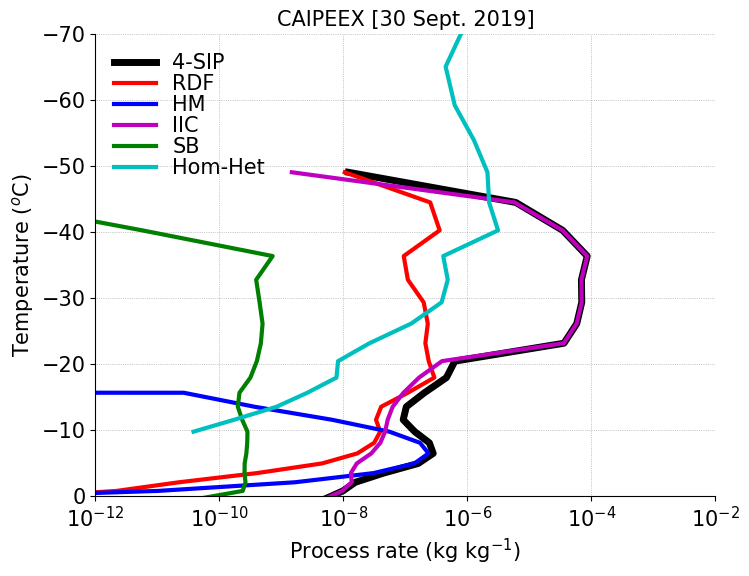

In [7]:

thres_q = 1.e-12
qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqi_sec, np.nan)
dqi_sec_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqi_ds, np.nan)
dqi_rf_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqi_rs, np.nan)
dqi_hm_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqi_br, np.nan)
dqi_br_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqi_snow_sbf, np.nan)
dqi_snow_sb = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqi_graup_sbf, np.nan)
dqi_graup_sb = qi_filt.mean(dim=('time','ncells'))

dqi_tot_sb = dqi_snow_sb + dqi_graup_sb

qi_filt = xr.where(ds_4sip.d_qi_homhet > thres_q, ds_4sip.d_qi_homhet, np.nan)
dqi_homhet_tot = qi_filt.mean(dim=('time', 'ncells'))


avg_tempc = ds_4sip.tempc.mean(dim=('time','ncells'))


dqi_sec_tot = dqi_sec_tot.where(avg_tempc > -50)
dqi_rf_tot = dqi_rf_tot.where(avg_tempc > -50)
dqi_hm_tot = dqi_hm_tot.where(avg_tempc > -50)
dqi_br_tot = dqi_br_tot.where(avg_tempc > -50)
dqi_tot_sb = dqi_tot_sb.where(avg_tempc > -50)

dqi_sec_tot = dqi_sec_tot.values #where(avg_tempc > -50)
dqi_rf_tot = dqi_rf_tot.values   #where(avg_tempc > -50)
dqi_hm_tot = dqi_hm_tot.values   #where(avg_tempc > -50)
dqi_br_tot = dqi_br_tot.values   #where(avg_tempc > -50)
dqi_tot_sb = dqi_tot_sb.values   #where(avg_tempc > -50)
dqi_homhet_tot = dqi_homhet_tot.values
avg_tempc = avg_tempc.values

fontsize=15;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(dqi_sec_tot, avg_tempc, 'k-', linewidth=lnwdth+2, label='4-SIP')
plt.plot(dqi_rf_tot, avg_tempc, 'r-', linewidth=lnwdth, label='RDF')
plt.plot(dqi_hm_tot, avg_tempc, 'b-', linewidth=lnwdth, label='HM')
plt.plot(dqi_br_tot, avg_tempc, 'm-', linewidth=lnwdth, label='IIC')
plt.plot(dqi_tot_sb, avg_tempc, 'g-', linewidth=lnwdth, label='SB')
plt.plot(dqi_homhet_tot, avg_tempc, 'c-', linewidth=lnwdth, label='Hom-Het')

plt.xscale('log')
plt.xlim(1.e-12, 1.e-2)
plt.ylim(0, -70)
#plt.xticks([-4, -2, 0, 2, 4, 6, 8, 10], fontsize=fontsize)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70], fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Process rate (kg kg$^{-1}$)', fontsize=fontsize)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept. 2019]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)
plt.show()


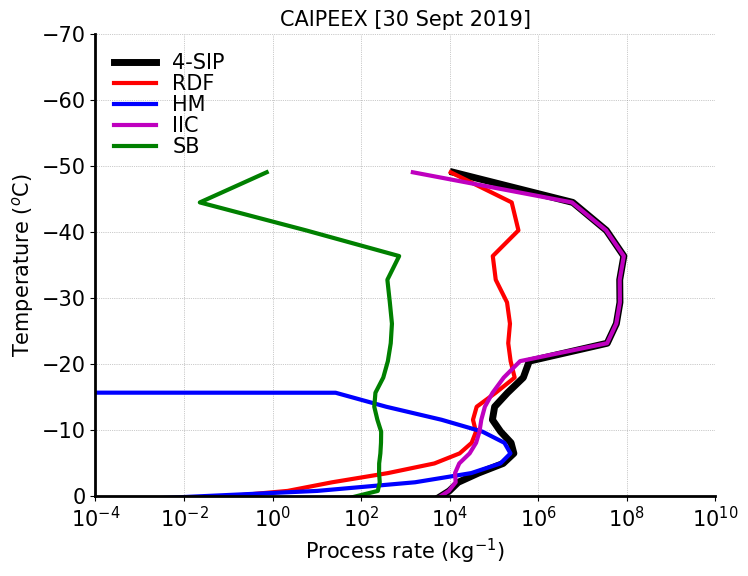

In [12]:

thres_q = 1.e-12
qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqni_sec, np.nan)
dqi_sec_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqni_ds, np.nan)
dqi_rf_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqni_rs, np.nan)
dqi_hm_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqni_br, np.nan)
dqi_br_tot = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqni_snow_sbf, np.nan)
dqi_snow_sb = qi_filt.mean(dim=('time','ncells'))

qi_filt = xr.where(ds_4sip.dqi_sec > thres_q, ds_4sip.dqni_graup_sbf, np.nan)
dqi_graup_sb = qi_filt.mean(dim=('time','ncells'))

dqi_tot_sb = dqi_snow_sb + dqi_graup_sb

qi_filt = xr.where(ds_4sip.d_qi_homhet > thres_q, ds_4sip.d_qi_homhet, np.nan)
dqi_homhet_tot = qi_filt.mean(dim=('time', 'ncells'))


avg_tempc = ds_4sip.tempc.mean(dim=('time','ncells'))


dqi_sec_tot = dqi_sec_tot.where(avg_tempc > -50)
dqi_rf_tot = dqi_rf_tot.where(avg_tempc > -50)
dqi_hm_tot = dqi_hm_tot.where(avg_tempc > -50)
dqi_br_tot = dqi_br_tot.where(avg_tempc > -50)
dqi_tot_sb = dqi_tot_sb.where(avg_tempc > -50)

dqi_sec_tot = dqi_sec_tot.values #where(avg_tempc > -50)
dqi_rf_tot = dqi_rf_tot.values   #where(avg_tempc > -50)
dqi_hm_tot = dqi_hm_tot.values   #where(avg_tempc > -50)
dqi_br_tot = dqi_br_tot.values   #where(avg_tempc > -50)
dqi_tot_sb = dqi_tot_sb.values   #where(avg_tempc > -50)
dqi_homhet_tot = dqi_homhet_tot.values
avg_tempc = avg_tempc.values

fontsize=15;
lnwdth=3;
alpha=0.6;
st = 3
plt.figure(figsize=(8, 6))
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(dqi_sec_tot, avg_tempc, 'k-', linewidth=lnwdth+2, label='4-SIP')
plt.plot(dqi_rf_tot, avg_tempc, 'r-', linewidth=lnwdth, label='RDF')
plt.plot(dqi_hm_tot, avg_tempc, 'b-', linewidth=lnwdth, label='HM')
plt.plot(dqi_br_tot, avg_tempc, 'm-', linewidth=lnwdth, label='IIC')
plt.plot(dqi_tot_sb, avg_tempc, 'g-', linewidth=lnwdth, label='SB')
#plt.plot(dqi_homhet_tot, avg_tempc, 'c-', linewidth=lnwdth, label='Hom-Het')

plt.xscale('log')
plt.xlim(1.e-4, 1.e10)
plt.ylim(0, -70)
#plt.xticks([-4, -2, 0, 2, 4, 6, 8, 10], fontsize=fontsize)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70], fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Process rate (kg$^{-1}$)', fontsize=fontsize)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper left')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(2)
plt.gca().spines['bottom'].set_linewidth(2)
plt.show()


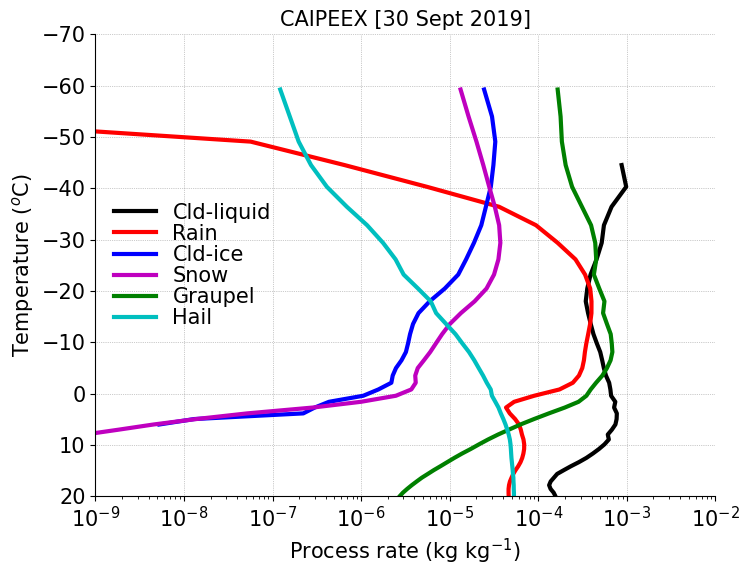

In [9]:

thres_q = 1.e-12
filt_q = xr.where(ds_4sip.qr > thres_q, ds_4sip.qr, np.nan)
avg_qr = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qc > thres_q, ds_4sip.qc, np.nan)
avg_qc = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qi > thres_q, ds_4sip.qi, np.nan)
avg_qi = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qs > thres_q, ds_4sip.qs, np.nan)
avg_qs = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qh > thres_q, ds_4sip.qg, np.nan)
avg_qg = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qh > thres_q, ds_4sip.qh, np.nan)
avg_qh = filt_q.mean(dim=('time','ncells'))

avg_tempc = ds_4sip.tempc.mean(dim=('time','ncells'))

avg_qr = avg_qr.where(avg_tempc > -60)
avg_qc = avg_qc.where(avg_tempc > -60)
avg_qi = avg_qi.where(avg_tempc > -60)
avg_qs = avg_qs.where(avg_tempc > -60)
avg_qg = avg_qg.where(avg_tempc > -60)
avg_qh = avg_qh.where(avg_tempc > -60)

avg_qr = avg_qr.values
avg_qc = avg_qc.values
avg_qi = avg_qi.values
avg_qs = avg_qs.values
avg_qg = avg_qg.values
avg_qh = avg_qh.values

avg_tempc = avg_tempc.values

fontsize=15;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(avg_qc, avg_tempc, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt.plot(avg_qr, avg_tempc, 'r-', linewidth=lnwdth, label='Rain')
plt.plot(avg_qi, avg_tempc, 'b-', linewidth=lnwdth, label='Cld-ice')
plt.plot(avg_qs, avg_tempc, 'm-', linewidth=lnwdth, label='Snow')
plt.plot(avg_qg, avg_tempc, 'g-', linewidth=lnwdth, label='Graupel')
plt.plot(avg_qh, avg_tempc, 'c-', linewidth=lnwdth, label='Hail')

plt.xscale('log')
plt.xlim(1.e-9, 1.e-2)
plt.ylim(20, -70)
#plt.xticks([-4, -2, 0, 2, 4, 6, 8, 10], fontsize=fontsize)
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70], fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Process rate (kg kg$^{-1}$)', fontsize=fontsize)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)
plt.show()

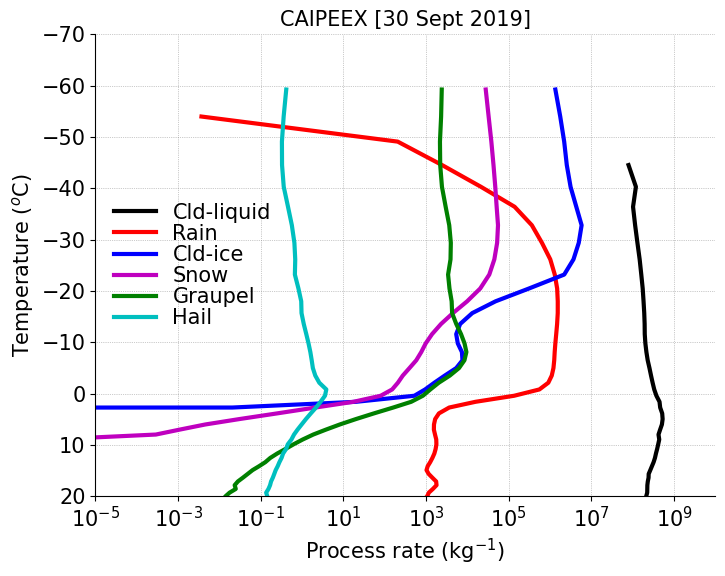

In [11]:

thres_q = 1.e-12
filt_q = xr.where(ds_4sip.qr > thres_q, ds_4sip.qnr, np.nan)
avg_qnr = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qc > thres_q, ds_4sip.qnc, np.nan)
avg_qnc = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qi > thres_q, ds_4sip.qni, np.nan)
avg_qni = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qs > thres_q, ds_4sip.qns, np.nan)
avg_qns = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qh > thres_q, ds_4sip.qng, np.nan)
avg_qng = filt_q.mean(dim=('time','ncells'))

filt_q = xr.where(ds_4sip.qh > thres_q, ds_4sip.qnh, np.nan)
avg_qnh = filt_q.mean(dim=('time','ncells'))

avg_tempc = ds_4sip.tempc.mean(dim=('time','ncells'))

avg_qnr = avg_qnr.where(avg_tempc > -60)
avg_qnc = avg_qnc.where(avg_tempc > -60)
avg_qni = avg_qni.where(avg_tempc > -60)
avg_qns = avg_qns.where(avg_tempc > -60)
avg_qng = avg_qng.where(avg_tempc > -60)
avg_qnh = avg_qnh.where(avg_tempc > -60)

avg_qnr = avg_qnr.values
avg_qnc = avg_qnc.values
avg_qni = avg_qni.values
avg_qns = avg_qns.values
avg_qng = avg_qng.values
avg_qnh = avg_qnh.values

avg_tempc = avg_tempc.values

fontsize=15;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(8, 6))
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(avg_qnc, avg_tempc, 'k-', linewidth=lnwdth, label='Cld-liquid')
plt.plot(avg_qnr, avg_tempc, 'r-', linewidth=lnwdth, label='Rain')
plt.plot(avg_qni, avg_tempc, 'b-', linewidth=lnwdth, label='Cld-ice')
plt.plot(avg_qns, avg_tempc, 'm-', linewidth=lnwdth, label='Snow')
plt.plot(avg_qng, avg_tempc, 'g-', linewidth=lnwdth, label='Graupel')
plt.plot(avg_qnh, avg_tempc, 'c-', linewidth=lnwdth, label='Hail')

plt.xscale('log')
plt.xlim(1.e-2, 1.e10)
plt.ylim(20, -70)
#plt.xticks([-4, -2, 0, 2, 4, 6, 8, 10], fontsize=fontsize)
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70], fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('Process rate (kg$^{-1}$)', fontsize=fontsize)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)
plt.show()


In [ ]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing
import dask.array as da
import time

thres_q = 1.e-12

start = time.time()

avg_ht = 1.e-3*ds_4sip.z_mc.mean(dim=('time', 'ncells'))

def process_variable(var, ref_var, ds):
    """Processes variable with dask-backed operations"""
    avg_tempc = ds.tempc.mean(dim=('time', 'ncells'))
    filt_q = xr.where(ref_var > thres_q, var, np.nan).mean(dim=('time', 'ncells'))
    return filt_q.where(avg_tempc > -60)

if __name__ == '__main__':
    variable_pairs = [
        (ds_4sip.qnr, ds_4sip.qr),  # Rain
        (ds_4sip.qnc, ds_4sip.qc),  # Cloud-liquid
        (ds_4sip.qni, ds_4sip.qi),  # Cloud-ice
        (ds_4sip.qns, ds_4sip.qs),  # Snow
        (ds_4sip.qng, ds_4sip.qh),  # Graupel
        (ds_4sip.qnh, ds_4sip.qh)   # Hail
    ]
    
    results = [process_variable(var, ref, ds_4sip) for var, ref in variable_pairs]
    
    # Compute results correctly
    avg_qnr, avg_qnc, avg_qni, avg_qns, avg_qng, avg_qnh = [r.compute() for r in results]


    # Plotting
    fontsize = 15
    lnwdth = 3
    alpha = 0.6

    plt.figure(figsize=(8, 6))
    plt1 = plt.gca()
    plt2 = plt1.twinx()
    fact = 1.
    #plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
    plt1.plot(avg_qnc*fact, avg_tempc, 'k-', linewidth=lnwdth, label='Cld-liquid')
    plt1.plot(avg_qnr*fact, avg_tempc, 'r-', linewidth=lnwdth, label='Rain')
    plt1.plot(avg_qni*fact, avg_tempc, 'b-', linewidth=lnwdth, label='Cld-ice')
    plt1.plot(avg_qns*fact, avg_tempc, 'm-', linewidth=lnwdth, label='Snow')
    plt1.plot(avg_qng*fact, avg_tempc, 'g-', linewidth=lnwdth, label='Graupel')
    plt1.plot(avg_qnh*fact, avg_tempc, 'c-', linewidth=lnwdth, label='Hail')

    plt2.plot(avg_qnh, mean_ht, '-', color='none', linewidth=lnwdth)

    plt1.set_xscale('log')
    plt1.set_xlim(1.e-2, 1.e12)
    plt1.set_ylim(25, -70)
    plt2.set_ylim(0.5, 20)

    plt1.tick_params(axis='x', labelsize=fontsize)
    plt1.tick_params(axis='y', labelsize=fontsize)
    plt2.tick_params(axis='y', labelsize=fontsize) 
    
    
    plt1.set_xticks([1.e-2, 1.e0, 1.e2, 1.e4, 1.e6, 1.e8, 1.e10, 1.e12])
    plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
    plt2.set_yticks([0, 4, 8, 12, 16, 20])
    
    plt1.set_xlabel('Process rate (kg$^{-1}$)', fontsize=fontsize)
    plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
    plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
    plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
    plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper right')
    plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
    plt1.spines['top'].set_visible(False)
    plt2.spines['top'].set_visible(False)
    plt1.spines['left'].set_linewidth(1)
    plt1.spines['bottom'].set_linewidth(1)
    plt1.spines['right'].set_linewidth(1)
    plt.show()

end = time.time()
print('Time :: ', end-start)

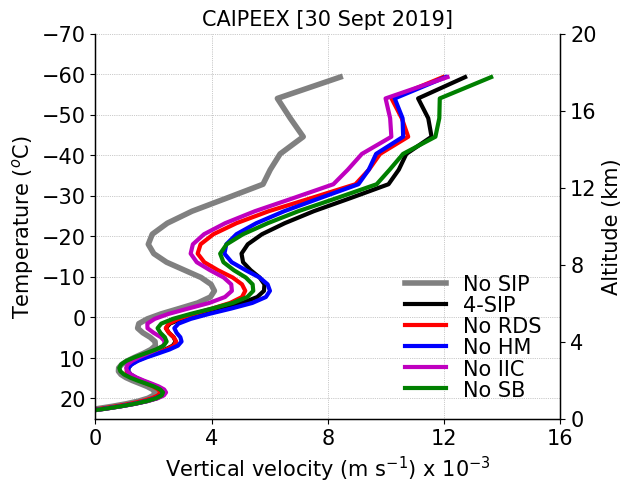

Time taken ::  34.382598876953125


In [11]:
import multiprocessing
import xarray as xr
import matplotlib.pyplot as plt
import time



start = time.time()

def process_dataset(args):
    """Parallel processing of each dataset"""
    ds, mean_tempc = args
    return ds.w_vel.mean(dim=('time', 'ncells')).where(mean_tempc > -60).compute().values

if __name__ == '__main__':
    mean_tempc = ds_4sip.tempc.mean(dim=('time', 'ncells')).compute()
    mean_ht = 1.e-3 * ds_4sip.z_mc.mean(dim=('time', 'ncells')).compute()

    datasets = [ds_nosip, ds_4sip, ds_norf, ds_nohm, ds_nobr, ds_nosb]

    # Parallel processing using multiprocessing
    with multiprocessing.Pool(processes=6) as pool:  # Use 6 workers
        results = pool.map(process_dataset, [(ds, mean_tempc) for ds in datasets])

    (mean_w_net_nosip, mean_w_net_4sip, mean_w_net_norf, mean_w_net_nohm, mean_w_net_nobr, mean_w_net_nosb) = results
    

    # Plotting 
    fontsize = 15
    lnwdth = 3
    alpha = 0.6

    plt.figure(figsize=(6, 5))
    plt1 = plt.gca()
    plt2 = plt1.twinx()
    plt1.plot(mean_w_net_nosip*1.e3, mean_tempc, '-', color='grey', linewidth=lnwdth+1, label='No SIP')
    plt1.plot(mean_w_net_4sip*1.e3, mean_tempc, 'k-', linewidth=lnwdth, label='4-SIP')
    plt1.plot(mean_w_net_norf*1.e3, mean_tempc, 'r-', linewidth=lnwdth, label='No RDS')
    plt1.plot(mean_w_net_nohm*1.e3, mean_tempc, 'b-', linewidth=lnwdth, label='No HM')
    plt1.plot(mean_w_net_nobr*1.e3, mean_tempc, 'm-', linewidth=lnwdth, label='No IIC')
    plt1.plot(mean_w_net_nosb*1.e3, mean_tempc, 'g-', linewidth=lnwdth, label='No SB')

    plt2.plot(mean_w_net_nosip*1.e3, mean_ht, '-', color='none', linewidth=lnwdth+1)#, label='No SIP')

    plt1.set_xlim(0., 16)
    plt1.set_ylim(25, -70)
    plt2.set_ylim(0.5, 20)

    plt1.tick_params(axis='x', labelsize=fontsize)
    plt1.tick_params(axis='y', labelsize=fontsize)
    plt2.tick_params(axis='y', labelsize=fontsize) 
    
    
    plt1.set_xticks([0, 4, 8, 12, 16])
    plt1.set_yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70])
    plt2.set_yticks([0, 4, 8, 12, 16, 20])
    
    plt1.set_xlabel('Vertical velocity (m s$^{-1}$) x 10$^{-3}$', fontsize=fontsize)
    plt1.set_ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
    plt2.set_ylabel('Altitude (km)', fontsize=fontsize)
    plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
    plt1.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='lower right')
    plt1.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
    plt1.spines['top'].set_visible(False)
    plt2.spines['top'].set_visible(False)
    #plt.spines['right'].set_visible(False)
    plt1.spines['left'].set_linewidth(1)
    plt1.spines['bottom'].set_linewidth(1)
    plt1.spines['right'].set_linewidth(1)
    plt.show()
    
    end = time.time()
    print('Time taken :: ', end-start)

In [66]:
print(ds_4sip.tempc[1,0,1].values)
print(ds_4sip.z_mc[1,0,1].values)

-67.23299
20700.926


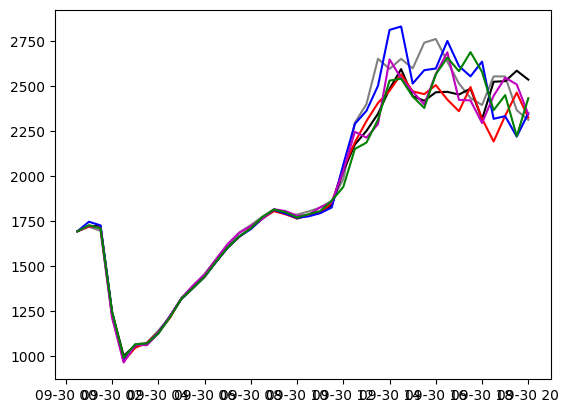

In [14]:


hbas_filt = xr.where(ds_nosip.hbas_con > 0., ds_nosip.hbas_con, np.nan)
htop_filt = xr.where(ds_nosip.htop_con > 0., ds_nosip.htop_con, np.nan)

cld_base_nosip = hbas_filt.mean('ncells')
cld_top_nosip = htop_filt.mean('ncells')

hbas_filt = xr.where(ds_4sip.hbas_con > 0., ds_4sip.hbas_con, np.nan)
htop_filt = xr.where(ds_4sip.htop_con > 0., ds_4sip.htop_con, np.nan)

cld_base_4sip = hbas_filt.mean('ncells')
cld_top_4sip = htop_filt.mean('ncells')

hbas_filt = xr.where(ds_norf.hbas_con > 0., ds_norf.hbas_con, np.nan)
htop_filt = xr.where(ds_norf.htop_con > 0., ds_norf.htop_con, np.nan)

cld_base_norf = hbas_filt.mean('ncells')
cld_top_norf = htop_filt.mean('ncells')

hbas_filt = xr.where(ds_nohm.hbas_con > 0., ds_nohm.hbas_con, np.nan)
htop_filt = xr.where(ds_nohm.htop_con > 0., ds_nohm.htop_con, np.nan)

cld_base_nohm = hbas_filt.mean('ncells')
cld_top_nohm = htop_filt.mean('ncells')


hbas_filt = xr.where(ds_nobr.hbas_con > 0., ds_nobr.hbas_con, np.nan)
htop_filt = xr.where(ds_nobr.htop_con > 0., ds_nobr.htop_con, np.nan)

cld_base_nobr = hbas_filt.mean('ncells')
cld_top_nobr = htop_filt.mean('ncells')


hbas_filt = xr.where(ds_nosb.hbas_con > 0., ds_nosb.hbas_con, np.nan)
htop_filt = xr.where(ds_nosb.htop_con > 0., ds_nosb.htop_con, np.nan)

cld_base_nosb = hbas_filt.mean('ncells')
cld_top_nosb = htop_filt.mean('ncells')



plt.plot(ds_nosip.time, cld_base_nosip, '-', color='grey')
plt.plot(ds_4sip.time, cld_base_4sip, 'k-')
plt.plot(ds_norf.time, cld_base_norf, 'r-')
plt.plot(ds_nohm.time, cld_base_nohm, 'b-')
plt.plot(ds_nobr.time, cld_base_nobr, 'm-')
plt.plot(ds_nosb.time, cld_base_nosb, 'g-')

In [7]:

mean_ht_nosip = ds_nosip.z_mc.mean(dim=('time','ncells'))
mean_tempc_nosip = ds_nosip.tempc.mean(dim=('time','ncells'))

mean_ht_4sip = ds_4sip.z_mc.mean(dim=('time','ncells'))
mean_tempc_4sip = ds_4sip.tempc.mean(dim=('time','ncells'))

mean_ht_norf = ds_norf.z_mc.mean(dim=('time','ncells'))
mean_tempc_norf = ds_norf.tempc.mean(dim=('time','ncells'))

mean_ht_nohm = ds_nohm.z_mc.mean(dim=('time','ncells'))
mean_tempc_nohm = ds_nohm.tempc.mean(dim=('time','ncells'))

mean_ht_nobr = ds_nobr.z_mc.mean(dim=('time','ncells'))
mean_tempc_nobr = ds_nobr.tempc.mean(dim=('time','ncells'))

mean_ht_nosb = ds_nosb.z_mc.mean(dim=('time','ncells'))
mean_tempc_nosb = ds_nosb.tempc.mean(dim=('time','ncells'))

w_thres = 2.
# Latent heating rate with No SIP
filt_lhr = xr.where((ds_nosip.tq > 1.e-6) & (ds_nosip.w_vel > w_thres), ds_nosip.d_lhr, np.nan)
lhr_kpers_nosip = (1./1800.) * np.gradient(ds_nosip.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nosip = lhr_kpers_nosip * 86400.
mean_lhr_kperd_nosip = np.mean(lhr_kperd_nosip, axis=(0,2))

# Latent heating rate with 4-SIP
filt_lhr = xr.where((ds_4sip.tq > 1.e-6) & (ds_4sip.w_vel > w_thres), ds_4sip.d_lhr, np.nan)
lhr_kpers_4sip = (1./1800.) * np.gradient(ds_4sip.d_lhr, axis=0) # w.r.t. time
lhr_kperd_4sip = lhr_kpers_4sip * 86400.
mean_lhr_kperd_4sip = np.mean(lhr_kperd_4sip, axis=(0,2))

# Latent heating rate with No Raindrop Shattering (RF)
filt_lhr = xr.where((ds_norf.tq > 1.e-6) & (ds_norf.w_vel > w_thres), ds_norf.d_lhr, np.nan)
lhr_kpers_norf = (1./1800.) * np.gradient(ds_norf.d_lhr, axis=0) # w.r.t. time
lhr_kperd_norf = lhr_kpers_norf * 86400.
mean_lhr_kperd_norf = np.mean(lhr_kperd_norf, axis=(0,2))

# Latent heating rate with No Hallett-Mossop (HM)
filt_lhr = xr.where((ds_nohm.tq > 1.e-6) & (ds_nohm.w_vel > w_thres), ds_nohm.d_lhr, np.nan)
lhr_kpers_nohm = (1./1800.) * np.gradient(ds_nohm.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nohm = lhr_kpers_nohm * 86400.
mean_lhr_kperd_nohm = np.mean(lhr_kperd_nohm, axis=(0,2))

# Latent heating rate with No ice-ice collision breakup (BR)
filt_lhr = xr.where((ds_nobr.tq > 1.e-6) & (ds_nobr.w_vel > w_thres), ds_nobr.d_lhr, np.nan)
lhr_kpers_nobr = (1./1800.) * np.gradient(ds_nobr.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nobr = lhr_kpers_nobr * 86400.
mean_lhr_kperd_nobr = np.mean(lhr_kperd_nobr, axis=(0,2))

# Latent heating rate with No Sublimation (SB)
filt_lhr = xr.where((ds_nosb.tq > 1.e-6) & (ds_nosb.w_vel > w_thres), ds_nosb.d_lhr, np.nan)
lhr_kpers_nosb = (1./1800.) * np.gradient(ds_nosb.d_lhr, axis=0) # w.r.t. time
lhr_kperd_nosb = lhr_kpers_nosb * 86400.
mean_lhr_kperd_nosb = np.mean(lhr_kperd_nosb, axis=(0,2))


# Change in lhr w.r.t. control
del_lhr_kperd_norf = mean_lhr_kperd_4sip-mean_lhr_kperd_norf
del_lhr_kperd_nohm = mean_lhr_kperd_4sip-mean_lhr_kperd_nohm
del_lhr_kperd_nobr = mean_lhr_kperd_4sip-mean_lhr_kperd_nobr
del_lhr_kperd_nosb = mean_lhr_kperd_4sip-mean_lhr_kperd_nosb
del_lhr_kperd_nosip = mean_lhr_kperd_4sip-mean_lhr_kperd_nosip


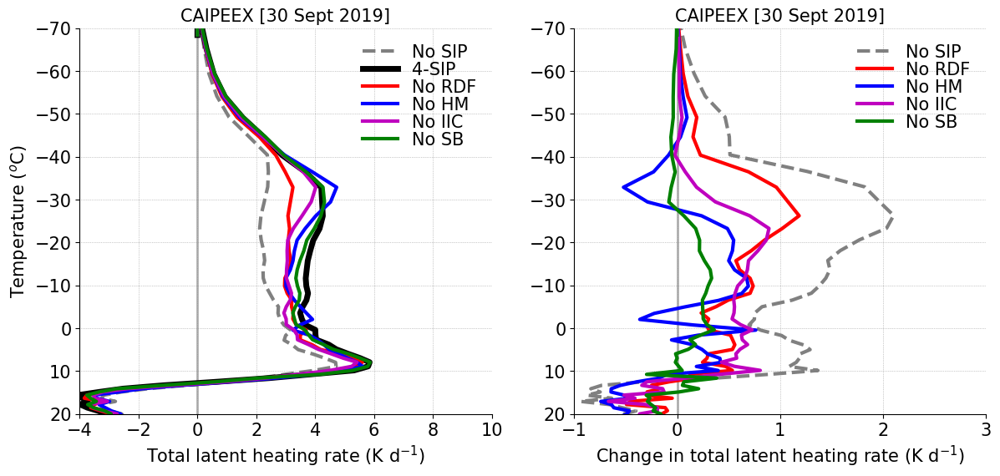

In [8]:

fontsize=15;
lnwdth=3;
alpha=0.6;

plt.figure(figsize=(14, 6))
plt.subplot(1,2,1)
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(mean_lhr_kperd_nosip, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(mean_lhr_kperd_4sip, mean_tempc_4sip, 'k-', linewidth=lnwdth+2, label='4-SIP')
plt.plot(mean_lhr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDF')
plt.plot(mean_lhr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(mean_lhr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(mean_lhr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlim(-4, 10)
plt.ylim(20, -70)
plt.xticks([-4, -2, 0, 2, 4, 6, 8, 10], fontsize=fontsize)
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70], fontsize=fontsize)
plt.xlabel('Total latent heating rate (K d$^{-1}$)', fontsize=fontsize)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper right')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)

plt.subplot(1,2,2)
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(del_lhr_kperd_nosip, mean_tempc_nosip, '--', color='grey', linewidth=lnwdth, label='No SIP')
plt.plot(del_lhr_kperd_norf, mean_tempc_norf, 'r-', linewidth=lnwdth, label='No RDF')
plt.plot(del_lhr_kperd_nohm, mean_tempc_nohm, 'b-', linewidth=lnwdth, label='No HM')
plt.plot(del_lhr_kperd_nobr, mean_tempc_nobr, 'm-', linewidth=lnwdth, label='No IIC')
plt.plot(del_lhr_kperd_nosb, mean_tempc_nosb, 'g-', linewidth=lnwdth, label='No SB')

plt.xlim(-1, 3)
plt.ylim(20, -70)
plt.xticks([-1, 0, 1, 2, 3], fontsize=fontsize)
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50, -60, -70], fontsize=fontsize)
plt.xlabel('Change in total latent heating rate (K d$^{-1}$)', fontsize=fontsize)
#plt.ylabel('Temperature ($^{o}$C)', fontsize=fontsize)
plt.title('CAIPEEX [30 Sept 2019]', fontsize=fontsize)
plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='upper right')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['right'].set_linewidth(3)
plt.gca().spines['right'].set_linewidth(3)
plt.show()


In [25]:

#######
min_tempc_sip = ds_4sip.tempc.min().values
max_tempc_sip = ds_4sip.tempc.max().values

min_wvel_sip = ds_4sip.w_vel.min().values
max_wvel_sip = ds_4sip.w_vel.max().values

num_temp_bin = 20; num_w_bin = 20;

temp_bin = np.linspace(min_tempc_sip, max_tempc_sip, num_temp_bin+1)
wvel_bin = np.linspace(min_wvel_sip, max_wvel_sip, num_w_bin+1)
#######

#######
tempc_sip_flat = ds_4sip.tempc.values.flatten()
wvel_sip_flat = ds_4sip.w_vel.values.flatten()

qc_sip_flat = ds_4sip.qc.values.flatten()
qi_sip_flat = ds_4sip.qi.values.flatten()
qs_sip_flat = ds_4sip.qs.values.flatten()
qg_sip_flat = ds_4sip.qg.values.flatten()
qh_sip_flat = ds_4sip.qh.values.flatten()
tqi_sip_flat = ds_4sip.tqi.values.flatten()
#######

hist_sip, temp_edges_sip, wvel_edges_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin))

#######
qc_sum_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin), weights = qc_sip_flat)[0]
qi_sum_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin), weights = qi_sip_flat)[0]
qs_sum_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin), weights = qs_sip_flat)[0]
qg_sum_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin), weights = qg_sip_flat)[0]
qh_sum_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin), weights = qh_sip_flat)[0]
tqi_sum_sip = np.histogram2d(tempc_sip_flat, wvel_sip_flat, bins=(temp_bin, wvel_bin), weights = tqi_sip_flat)[0]
#######

#######
avg_qc_temp_w_sip = qc_sum_sip/hist_sip
avg_qc_temp_w_sip[avg_qc_temp_w_sip < 1.e-9] = np.nan

avg_qi_temp_w_sip = qi_sum_sip/hist_sip
avg_qi_temp_w_sip[avg_qi_temp_w_sip < 1.e-9] = np.nan

avg_qs_temp_w_sip = qs_sum_sip/hist_sip
avg_qs_temp_w_sip[avg_qs_temp_w_sip < 1.e-9] = np.nan

avg_qg_temp_w_sip = qg_sum_sip/hist_sip
avg_qg_temp_w_sip[avg_qg_temp_w_sip < 1.e-9] = np.nan

avg_qh_temp_w_sip = qh_sum_sip/hist_sip
avg_qh_temp_w_sip[avg_qh_temp_w_sip < 1.e-9] = np.nan

avg_tqi_temp_w_sip = tqi_sum_sip/hist_sip
avg_tqi_temp_w_sip[avg_tqi_temp_w_sip < 1.e-9] = np.nan
#######


/tmp/ipykernel_1917976/3900975349.py:8: RuntimeWarning: invalid value encountered in divide
  avg_qc_temp_w_sip = qc_sum_sip/hist_sip
/tmp/ipykernel_1917976/3900975349.py:11: RuntimeWarning: invalid value encountered in divide
  avg_qi_temp_w_sip = qi_sum_sip/hist_sip
/tmp/ipykernel_1917976/3900975349.py:14: RuntimeWarning: invalid value encountered in divide
  avg_qs_temp_w_sip = qs_sum_sip/hist_sip
/tmp/ipykernel_1917976/3900975349.py:17: RuntimeWarning: invalid value encountered in divide
  avg_qg_temp_w_sip = qg_sum_sip/hist_sip
/tmp/ipykernel_1917976/3900975349.py:20: RuntimeWarning: invalid value encountered in divide
  avg_qh_temp_w_sip = qh_sum_sip/hist_sip
/tmp/ipykernel_1917976/3900975349.py:23: RuntimeWarning: invalid value encountered in divide
  avg_tqi_temp_w_sip = tqi_sum_sip/hist_sip


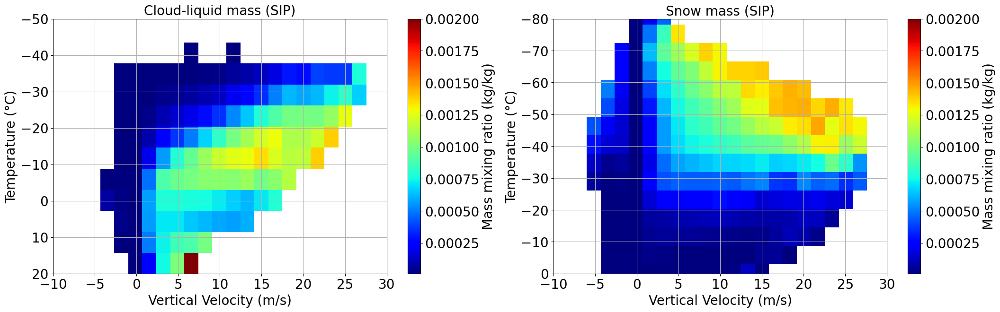

In [37]:

fontsize = 20;

plt.figure(figsize=(25, 7))
plt.subplot(1,2,1)
contour=plt.imshow(avg_qc_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=2.e-3, aspect='auto', origin='lower',cmap='jet')

plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(20, -50)
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Cloud-liquid mass (SIP)', fontsize=fontsize)

plt.subplot(1,2,2)
contour=plt.imshow(avg_qi_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=2.e-3, aspect='auto', origin='lower',cmap='jet')

plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(0, -80)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70, -80], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Snow mass (SIP)', fontsize=fontsize)
plt.show()

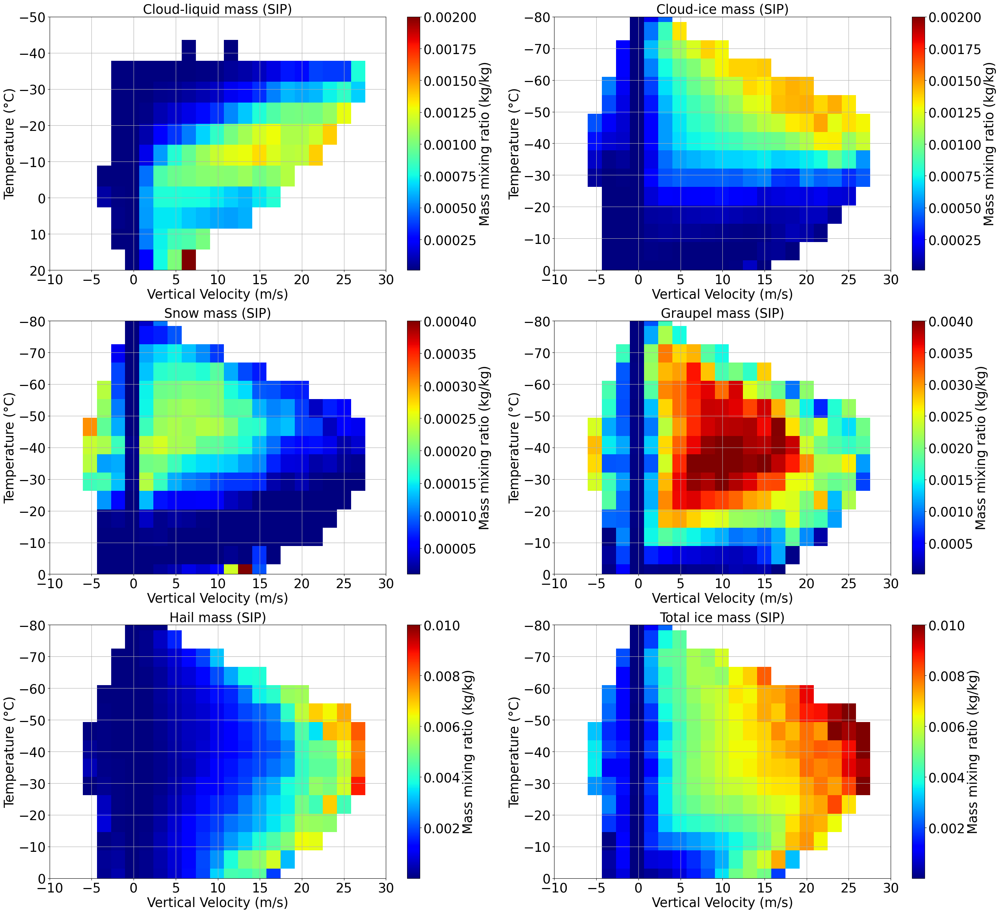

In [64]:


fontsize = 25;

plt.figure(figsize=(32, 30))
plt.subplot(3,2,1)
contour=plt.imshow(avg_qc_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=2.e-3, aspect='auto', origin='lower',cmap='jet')

plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(20, -50)
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Cloud-liquid mass (SIP)', fontsize=fontsize)

plt.subplot(3,2,2)
contour=plt.imshow(avg_qi_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=2.e-3, aspect='auto', origin='lower',cmap='jet')

plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(0, -80)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70, -80], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Cloud-ice mass (SIP)', fontsize=fontsize)
#plt.show()


#fontsize = 20;

#plt.figure(figsize=(25, 7))
plt.subplot(3,2,3)
contour=plt.imshow(avg_qs_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=4.e-4, aspect='auto', origin='lower',cmap='jet')

plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(0, -80)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70, -80], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Snow mass (SIP)', fontsize=fontsize)

plt.subplot(3,2,4)
contour=plt.imshow(avg_qg_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=4.e-3, aspect='auto', origin='lower',cmap='jet')
plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(0, -80)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70, -80], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Graupel mass (SIP)', fontsize=fontsize)

#plt.show()


#fontsize = 20;

#plt.figure(figsize=(25, 7))
plt.subplot(3,2,5)
contour=plt.imshow(avg_qh_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=1.e-2, aspect='auto', origin='lower',cmap='jet')

plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(0, -80)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70, -80], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Hail mass (SIP)', fontsize=fontsize)

plt.subplot(3,2,6)
contour=plt.imshow(avg_tqi_temp_w_sip, extent=[wvel_bin[0], wvel_bin[-1],temp_bin[0], temp_bin[-1]], 
                   vmin=1.e-5, vmax=1.e-2, aspect='auto', origin='lower',cmap='jet')
plt.grid(True)
plt.xlim(-10, 30)
plt.xticks([-10, -5, 0, 5, 10, 15, 20, 25, 30], fontsize=fontsize)
plt.ylim(0, -80)
plt.yticks([0, -10, -20, -30, -40, -50, -60, -70, -80], fontsize=fontsize)
plt.ylabel('Temperature (°C)', fontsize=fontsize)
plt.xlabel('Vertical Velocity (m/s)', fontsize=fontsize)

colorbar=plt.colorbar(label='Average mass (kg/kg)')
colorbar.ax.tick_params(labelsize=fontsize)
colorbar.set_label(label='Mass mixing ratio (kg/kg)', size=fontsize)

plt.title('Total ice mass (SIP)', fontsize=fontsize)

plt.show()
